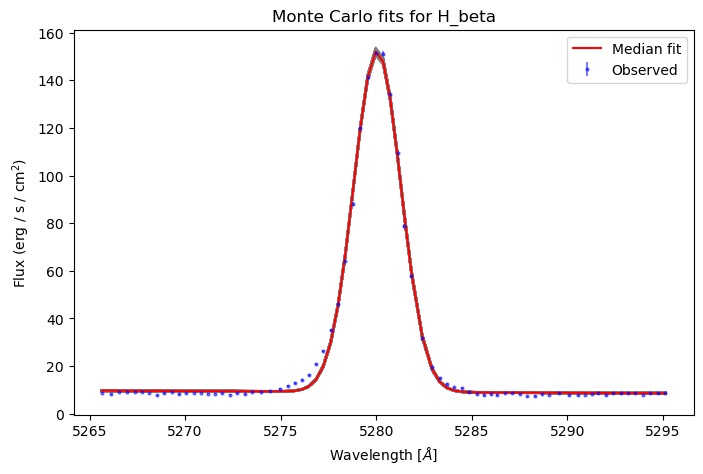

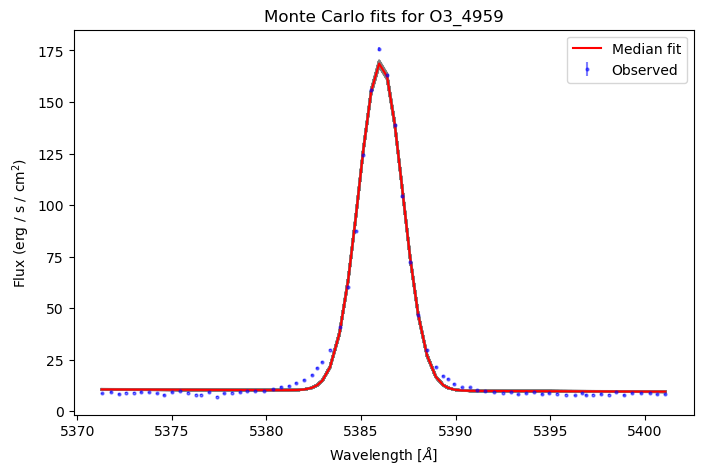

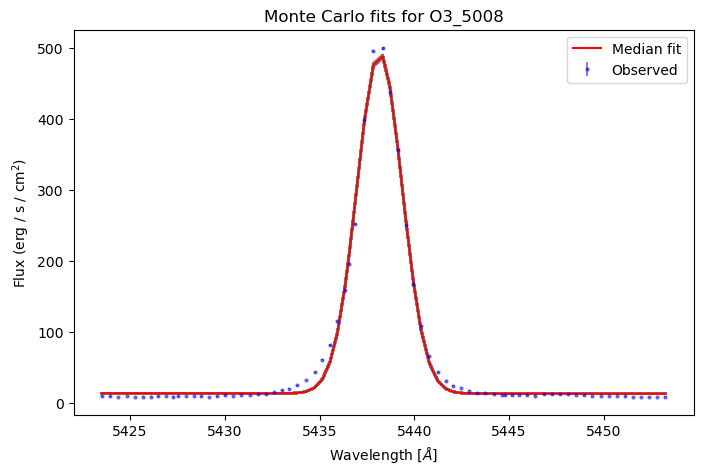

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
                format='pdf')
    plt.show()

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux += absorption

    save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    balmer_absorption_correction(J0328_SPEC)
    balmer_absorption_correction(J0020_SPECTRA)
    balmer_absorption_correction(J0203_SPECTRA)
    balmer_absorption_correction(J0243_SPECTRA)
    balmer_absorption_correction(J0333_SPECTRA)
    balmer_absorption_correction(J0404_SPECTRA)
    balmer_absorption_correction(J2204_SPECTRA)
    balmer_absorption_correction(J2258_SPECTRA)
    balmer_absorption_correction(J2336_SPECTRA)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
                format='pdf')
    plt.show()

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux += absorption

    save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

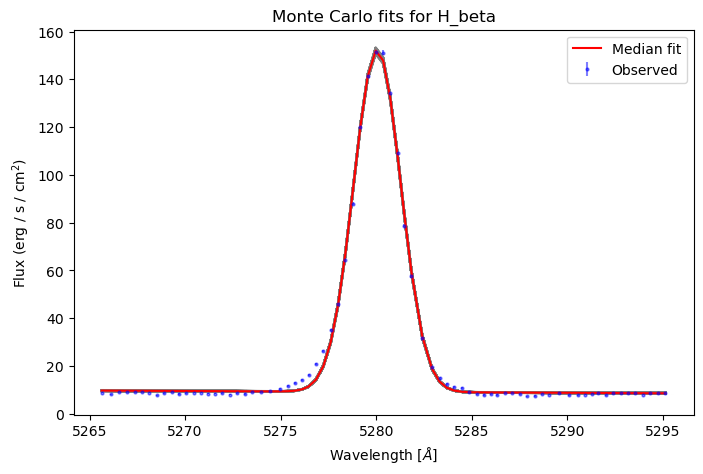

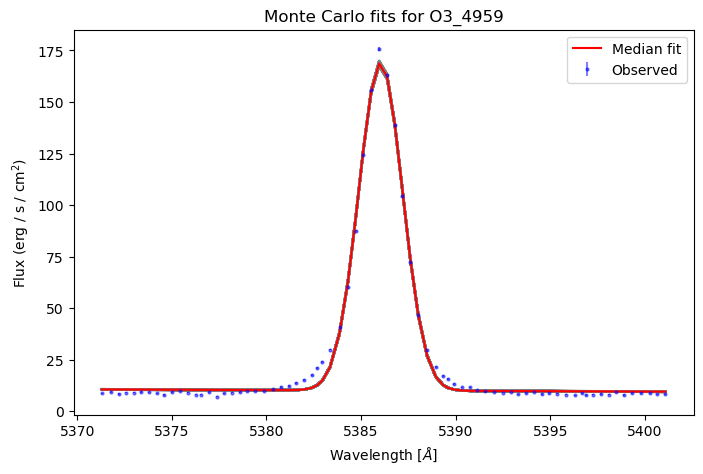

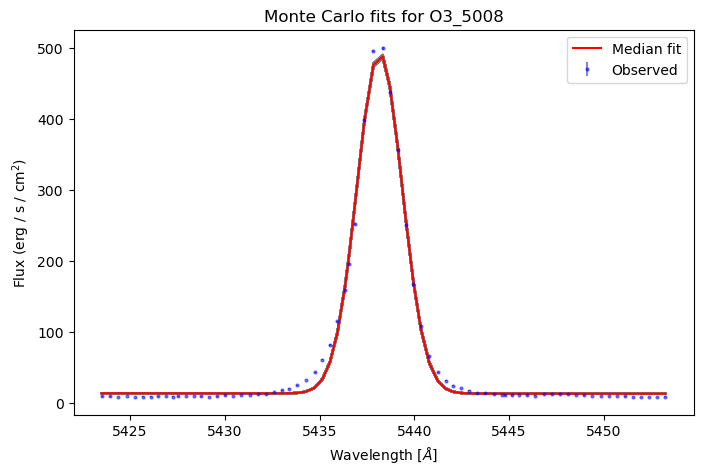

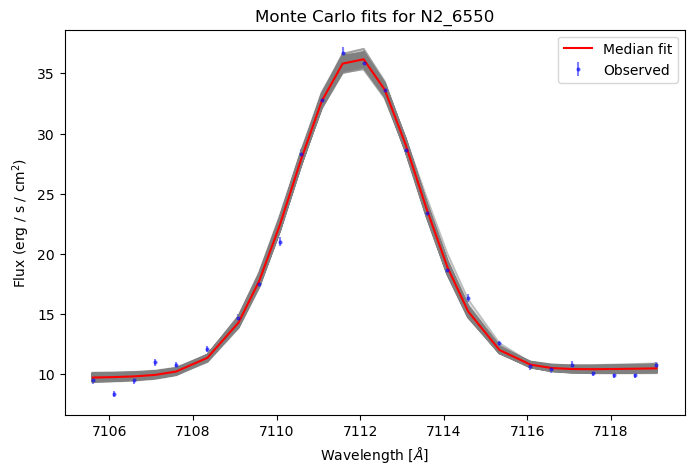

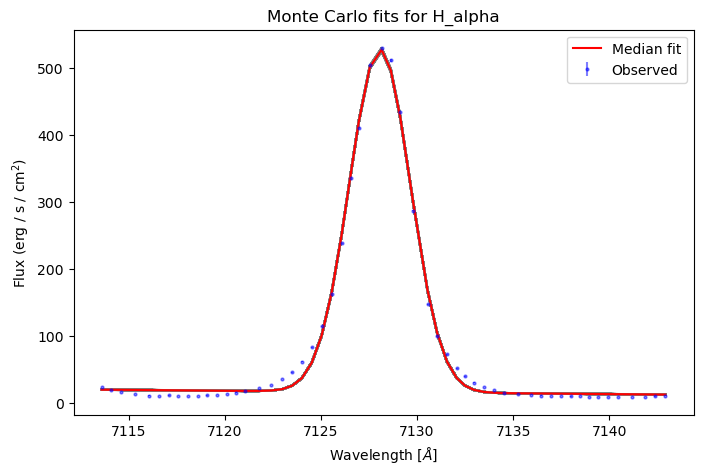

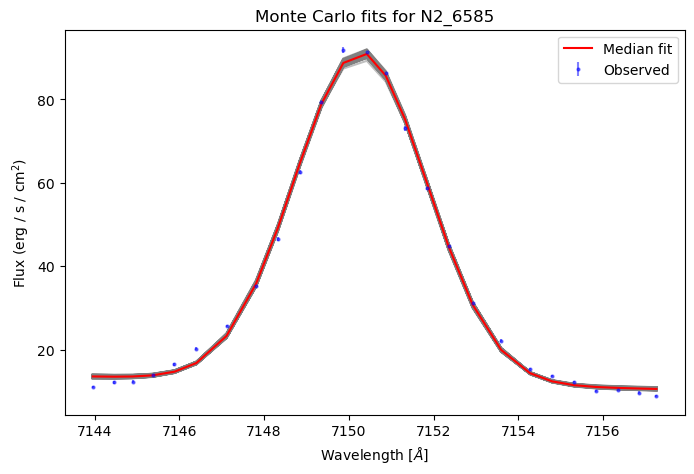

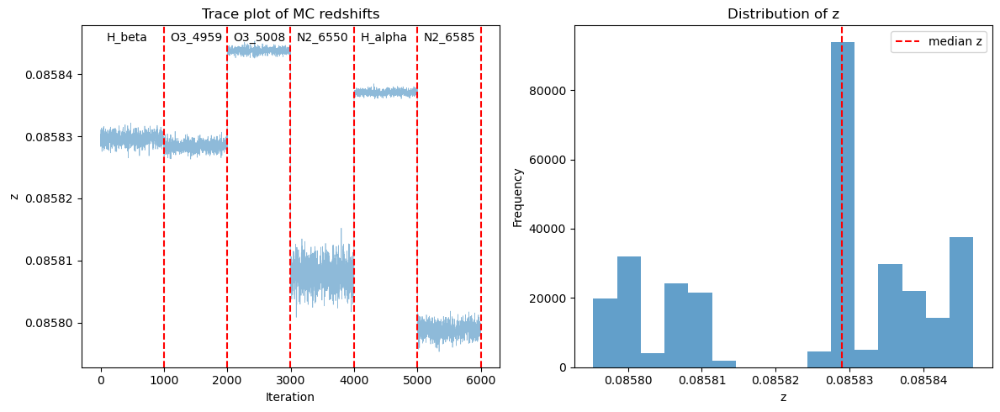

New redshift calculated for no_very_flats,z = 0.08582894685662412
Executed reset_redshift in 42.2351s
New redshift for J0328+0031,z = 0.08582894685662412
Reading data for J0328
Using MW dust corrected data


<ipython-input-1-7d307bf7f3da>:52: RuntimeWarning: divide by zero encountered in divide
  weights=1/sigma**2,
<ipython-input-1-7d307bf7f3da>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-1-7d307bf7f3da>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-1-7d307bf7f3da>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-1-7d307bf7f3da>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-1-7d307bf7f3da>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-1-7d307bf7f3da>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-1-7d307bf7f3da>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-1-7d307bf7f3da>:233: RuntimeWarning: divide by zero enco

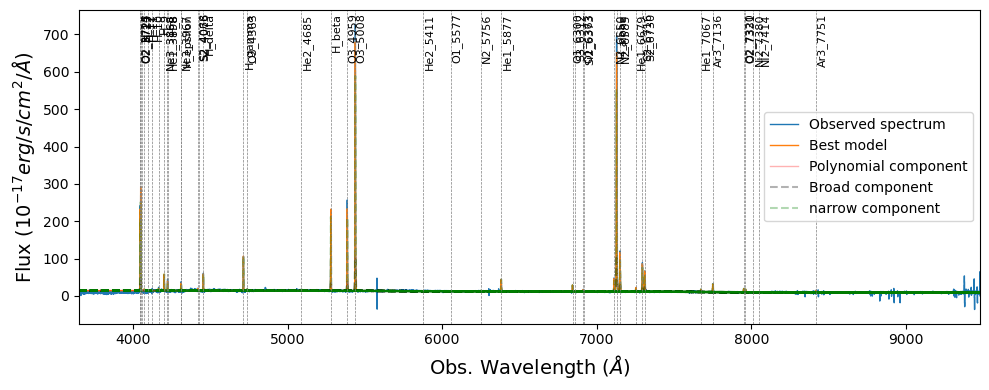

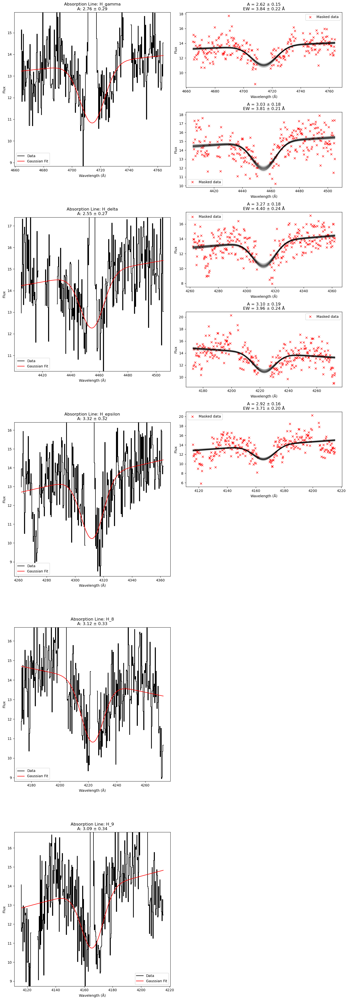

In [ ]:
    
    class_ = SPECTRALDATA(J0328_SPEC)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
                format='pdf')
    plt.show()

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux += absorption

In [ ]:
comps

[{'H_gamma_': array([-1.69907310e-07, -2.16163206e-07, -2.72688123e-07, -3.41619185e-07,
         -3.92338111e-07, -4.76848590e-07, -5.78179796e-07, -7.23101609e-07,
         -9.05270849e-07, -1.13375641e-06, -1.41990773e-06, -1.77057354e-06,
         -2.22120804e-06, -2.78738812e-06, -3.48748372e-06, -4.30951726e-06,
         -5.33197278e-06, -6.60652919e-06, -8.11266643e-06, -1.00486647e-05,
         -1.24653830e-05, -1.53650441e-05, -1.88826941e-05, -2.30137803e-05,
         -2.80759944e-05, -3.42428577e-05, -4.17331952e-05, -5.08874463e-05,
         -6.21944035e-05, -7.53851135e-05, -9.11668602e-05, -1.09782146e-04,
         -1.32182377e-04, -1.59018582e-04, -1.92003647e-04, -2.31343821e-04,
         -2.77056141e-04, -3.30651155e-04, -3.93501931e-04, -4.49487439e-04,
         -4.96356881e-04, -5.73629614e-04, -6.77954989e-04, -8.02497471e-04,
         -9.48241659e-04, -1.11577934e-03, -1.31432236e-03, -1.54198348e-03,
         -1.82341731e-03, -2.14275742e-03, -2.50606521e-03, -2.9

In [ ]:
corrected_flux



array([ 9.18275274, 12.77912761,  9.9047978 , ..., 25.42185646,
       64.78668667,  0.        ])

NameError: name 'dtaa' is not defined

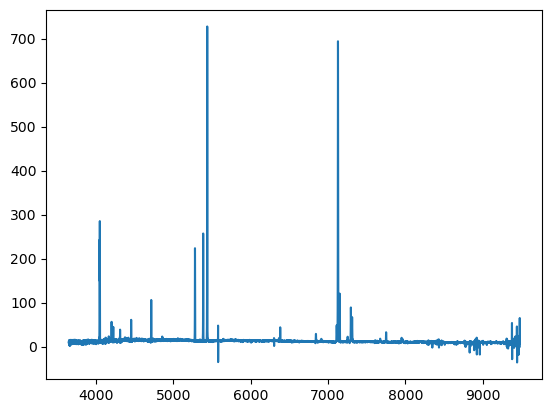

In [ ]:
plt.figure()
plt.plot(data[0], data[1])
plt.plot(dtaa[0], corrected_flux)
plt.show()

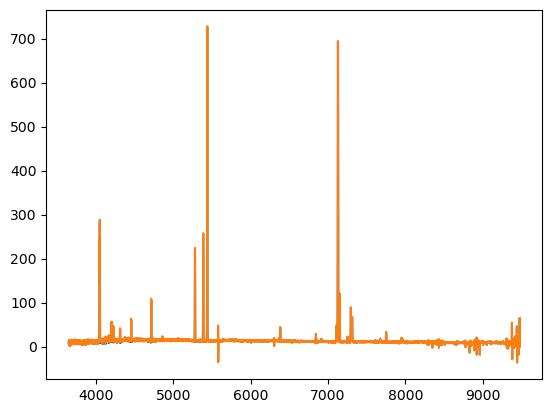

In [ ]:
plt.figure()
plt.plot(data[0], data[1])
plt.plot(data[0], corrected_flux)
plt.show()

In [ ]:
%matplotlib widget

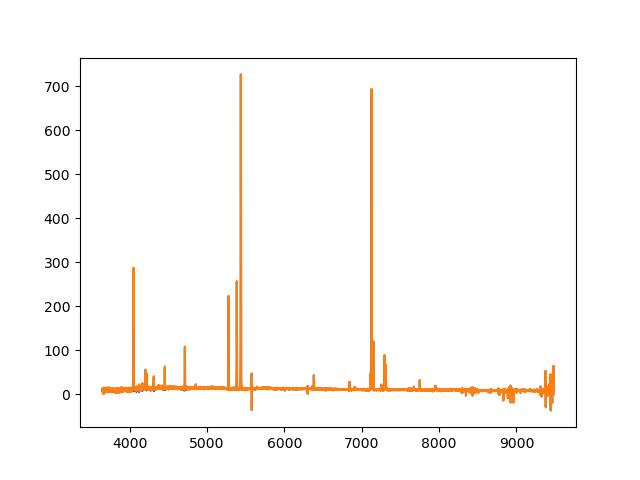

In [ ]:
plt.figure()
plt.plot(data[0], data[1])
plt.plot(data[0], corrected_flux)
plt.show()

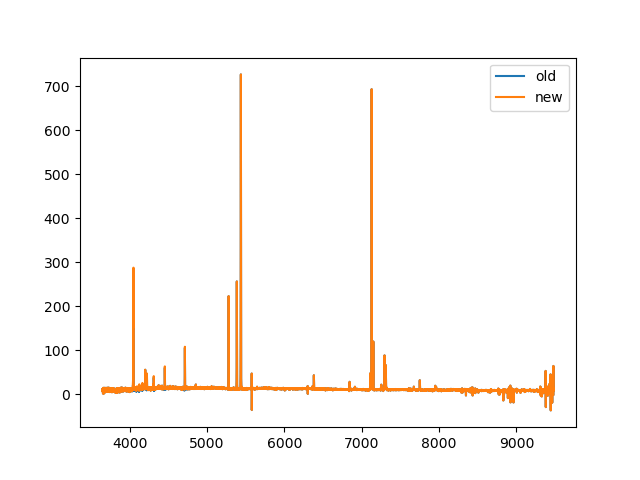

In [ ]:
plt.figure()
plt.plot(data[0], data[1], label='old')
plt.plot(data[0], corrected_flux, label='new')
plt.legend()
plt.show()

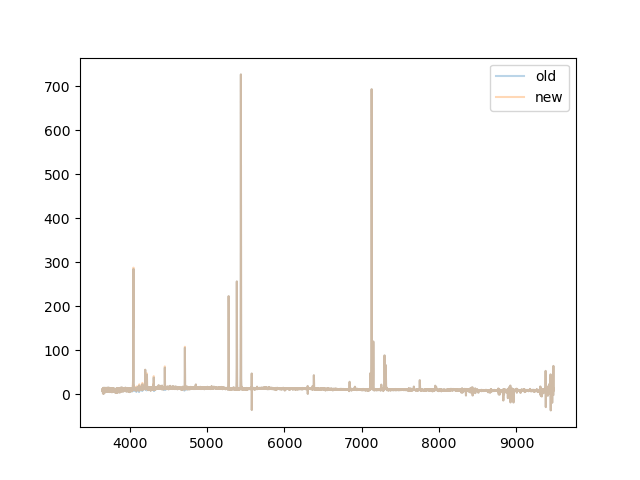

In [ ]:
plt.figure()
plt.plot(data[0], data[1], label='old', alpha=0.3)
plt.plot(data[0], corrected_flux, label='new', alpha=0.3)
plt.legend()
plt.show()

In [ ]:
absorption_alpha

array([-0., -0., -0., ..., -0., -0., -0.])

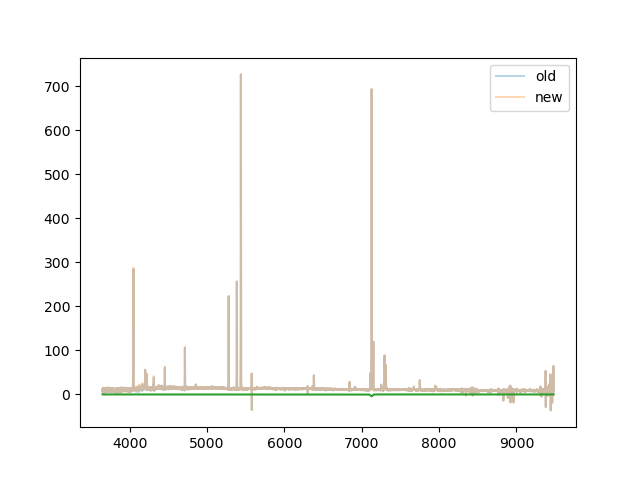

In [ ]:
plt.figure()
plt.plot(data[0], data[1], label='old', alpha=0.3)
plt.plot(data[0], corrected_flux, label='new', alpha=0.3)
plt.plot(data[0], absorption_alpha)
plt.legend()
plt.show()

In [ ]:
corrected_flux -= absorption_alpha

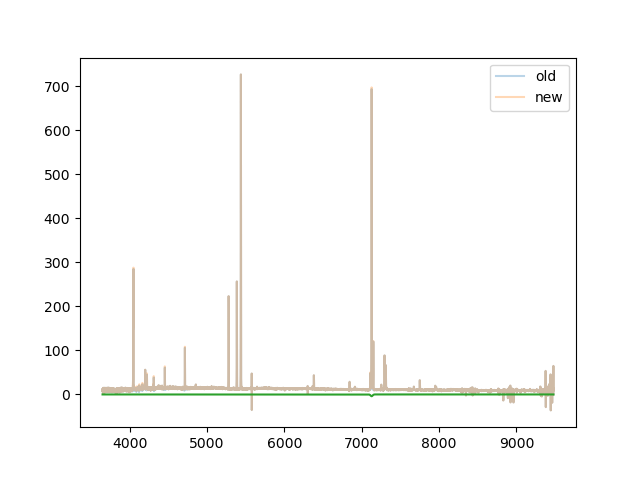

In [ ]:
plt.figure()
plt.plot(data[0], data[1], label='old', alpha=0.3)
plt.plot(data[0], corrected_flux, label='new', alpha=0.3)
plt.plot(data[0], absorption_alpha)
plt.legend()
plt.show()

In [ ]:
corrected_flux -= absorption_beta

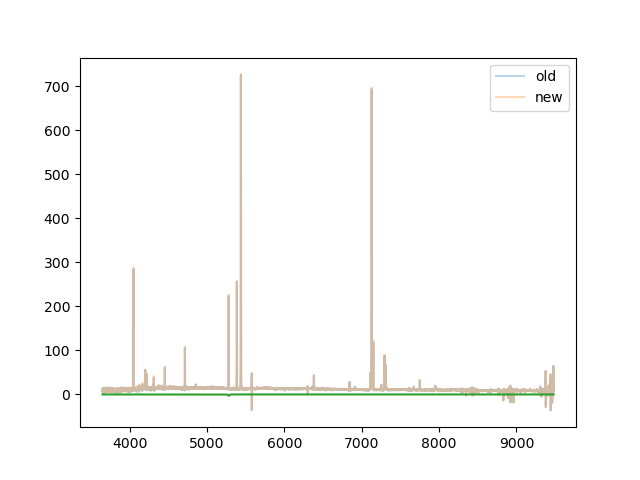

In [ ]:
plt.figure()
plt.plot(data[0], data[1], label='old', alpha=0.3)
plt.plot(data[0], corrected_flux, label='new', alpha=0.3)
plt.plot(data[0], absorption_beta)
plt.legend()
plt.show()

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
                format='pdf')
    plt.show()

    save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
                format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: div

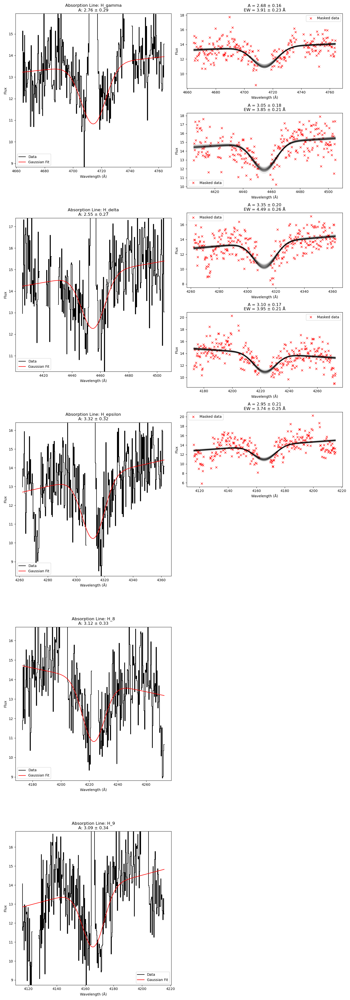

In [ ]:
    
    # class_ = SPECTRALDATA(J0328_SPEC)
    # _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    # data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    # sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux += absorption

<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-18-d9cf237b6750>:233: RuntimeWarning: div

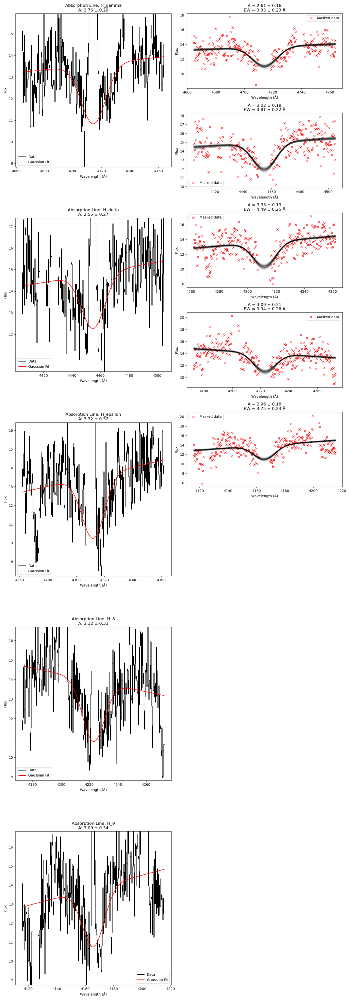

In [ ]:
    
    # class_ = SPECTRALDATA(J0328_SPEC)
    # _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    # data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    # sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()


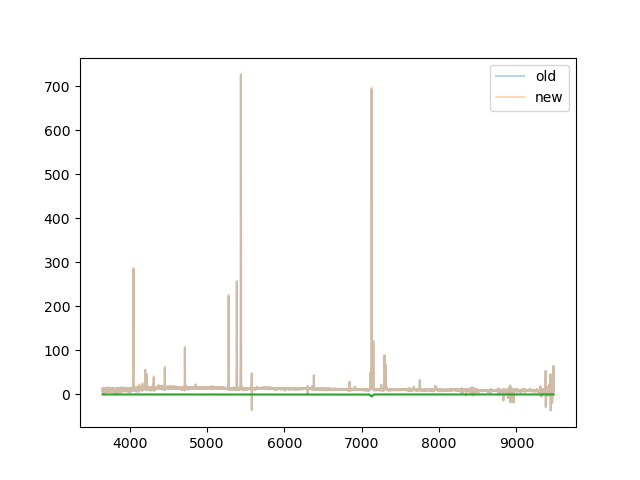

In [ ]:
plt.figure()
plt.plot(data[0], data[1], label='old', alpha=0.3)
plt.plot(data[0], corrected_flux, label='new', alpha=0.3)
plt.plot(data[0], absorption_alpha)
plt.legend()
plt.show()

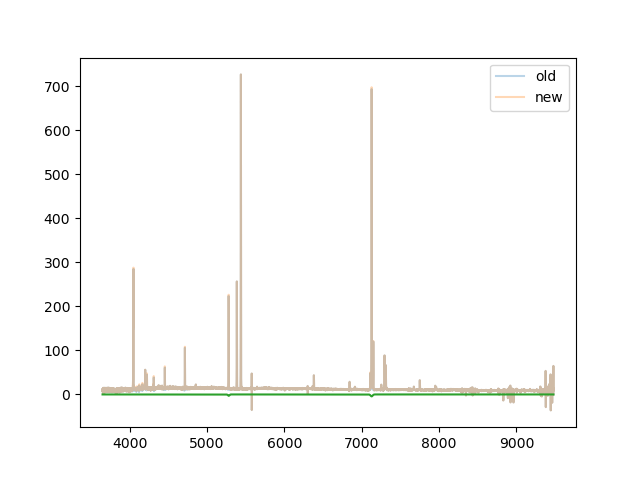

In [ ]:
plt.figure()
plt.plot(data[0], data[1], label='old', alpha=0.3)
plt.plot(data[0], corrected_flux, label='new', alpha=0.3)
plt.plot(data[0], absorption)
plt.legend()
plt.show()

In [ ]:
a

NameError: name 'a' is not defined

In [ ]:
%matplotlib widget


In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
                format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

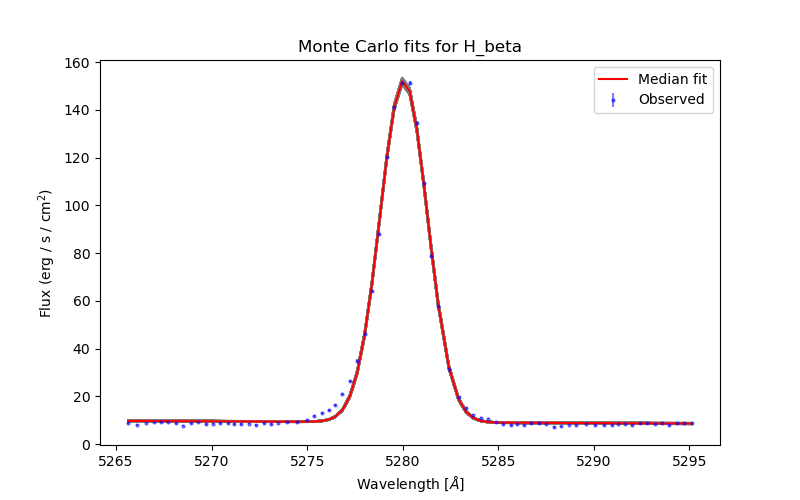

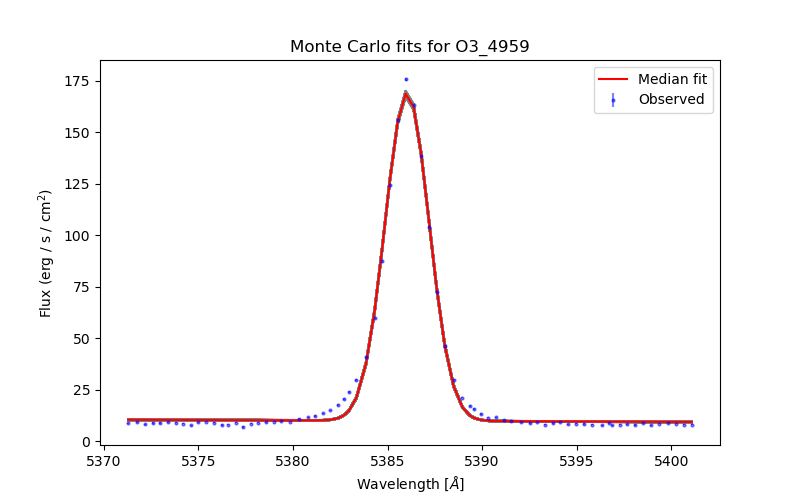

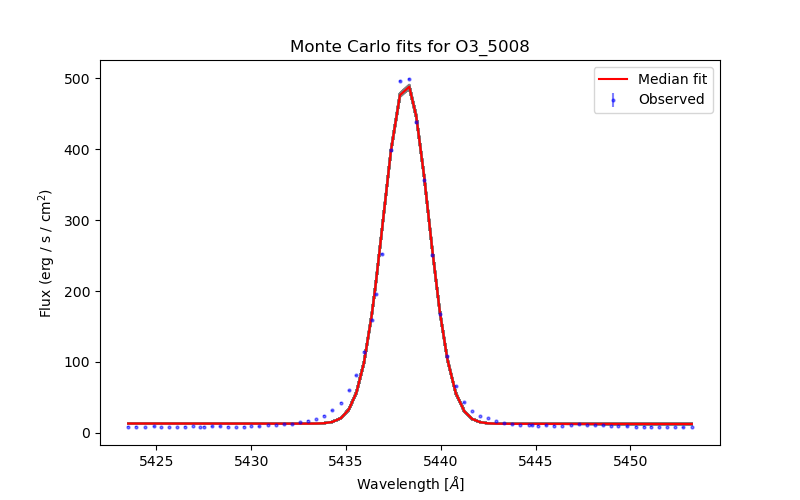

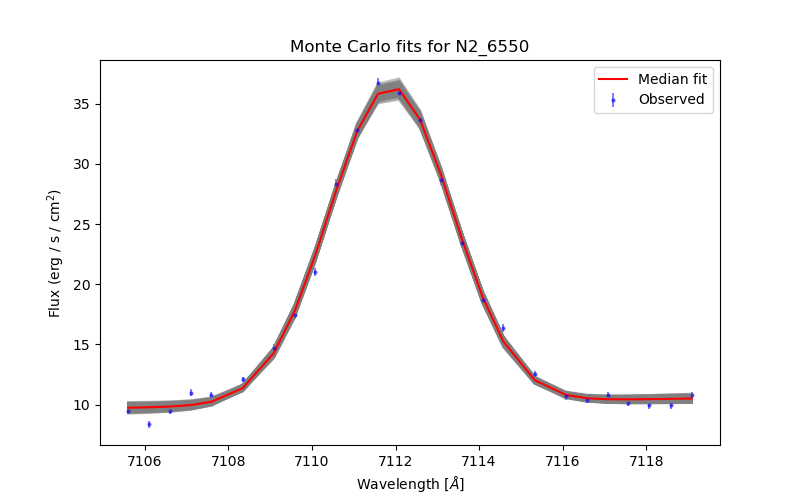

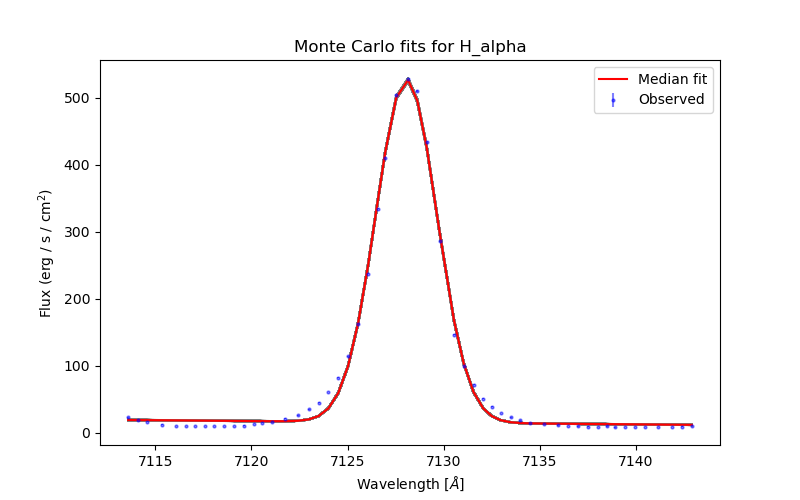

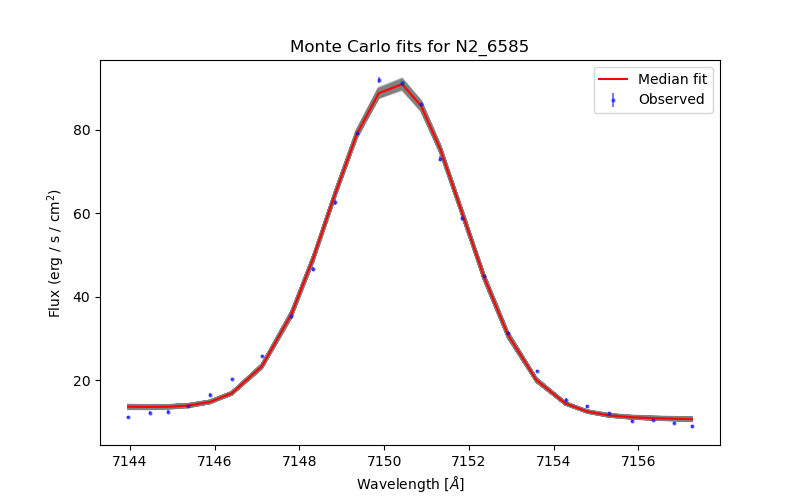

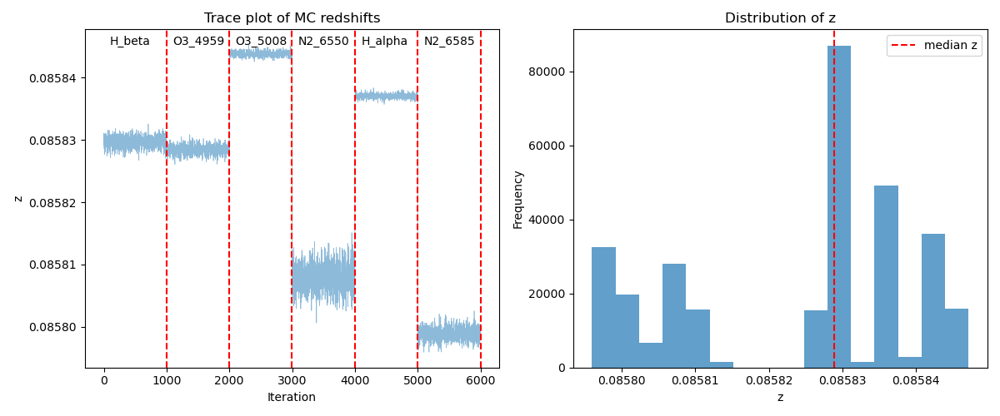

New redshift calculated for no_very_flats,z = 0.08582895658419398
Executed reset_redshift in 39.4107s
New redshift for J0328+0031,z = 0.08582895658419398
Reading data for J0328
Using MW dust corrected data


<ipython-input-26-6ed7c91c75d8>:52: RuntimeWarning: divide by zero encountered in divide
  weights=1/sigma**2,
<ipython-input-26-6ed7c91c75d8>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-26-6ed7c91c75d8>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-26-6ed7c91c75d8>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-26-6ed7c91c75d8>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-26-6ed7c91c75d8>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-26-6ed7c91c75d8>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-26-6ed7c91c75d8>:233: RuntimeWarning: divide by zero encountered in divide
  x=wave, weights=1/err**2,
<ipython-input-26-6ed7c91c75d8>:233: RuntimeWarning: divide by 

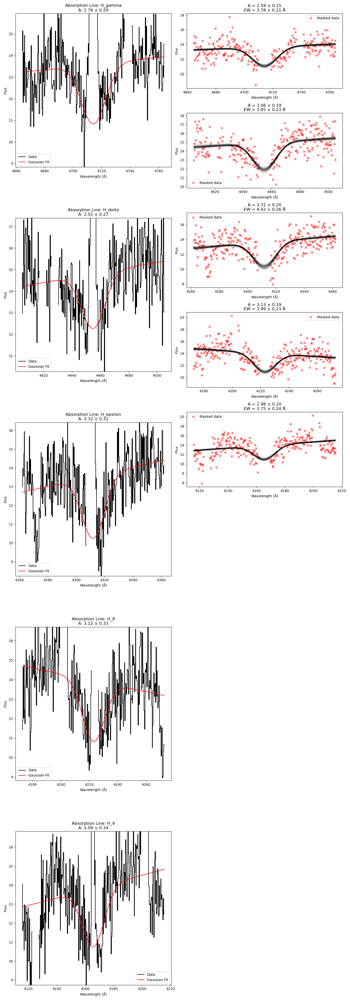

'Balmer absorption correction applied and results saved for J0328.'

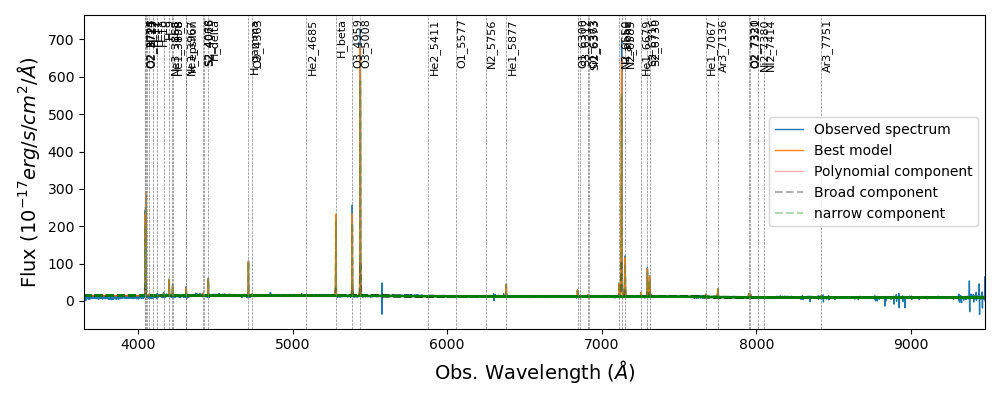

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
corrected_flux

array([ 9.18275274, 12.77912761,  9.9047978 , ..., 25.42185646,
       64.78668667,  0.        ])

In [ ]:
plt.figure()
plt.plot(data[0], data[1]. alpha=0.4)
plt.plot(data[0], corrected_flux, alpha=0.4)
plt.show()

SyntaxError: expression cannot contain assignment, perhaps you meant "=="? (<ipython-input-29-78253422e7ae>, line 2)

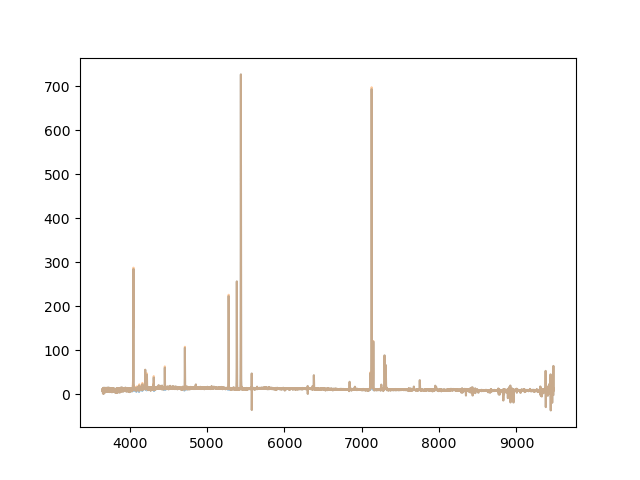

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4)
plt.plot(data[0], corrected_flux, alpha=0.4)
plt.show()

<ipython-input-31-de1827d19ad2>:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


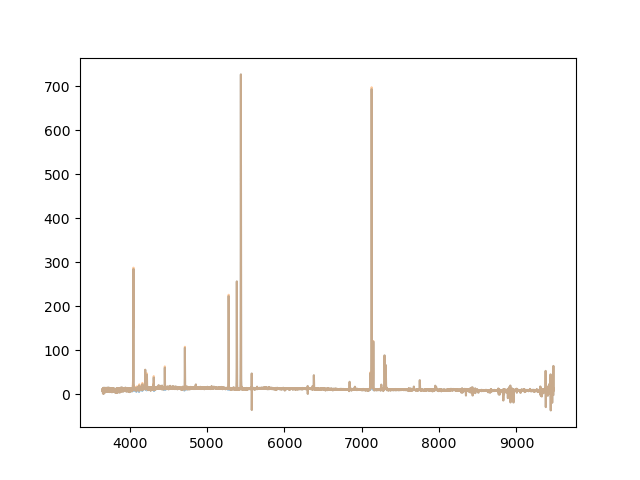

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4)
plt.plot(data[0], corrected_flux, alpha=0.4)
plt.show()

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        A_val = fits[i].params[param_key].value
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

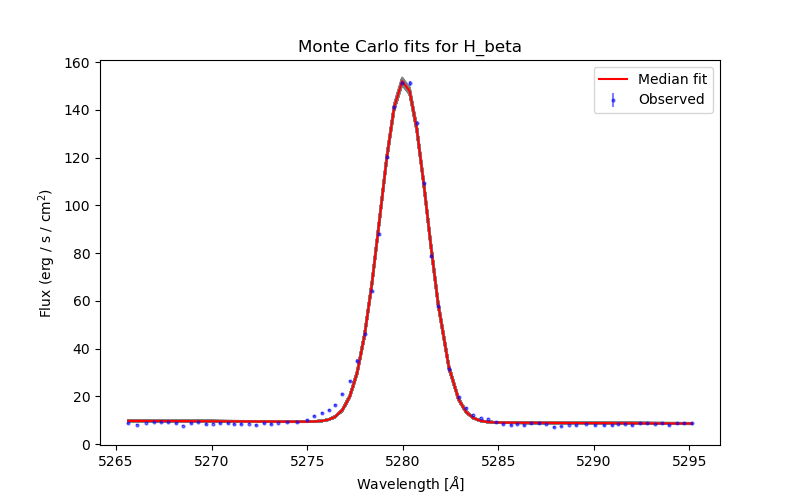

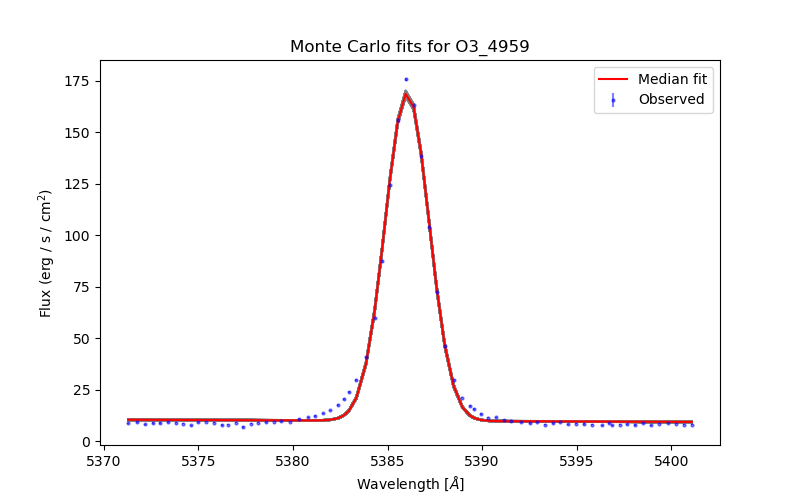

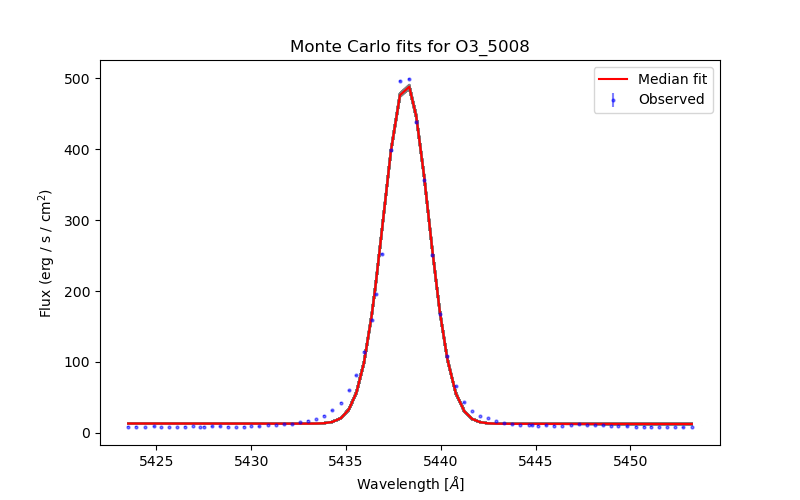

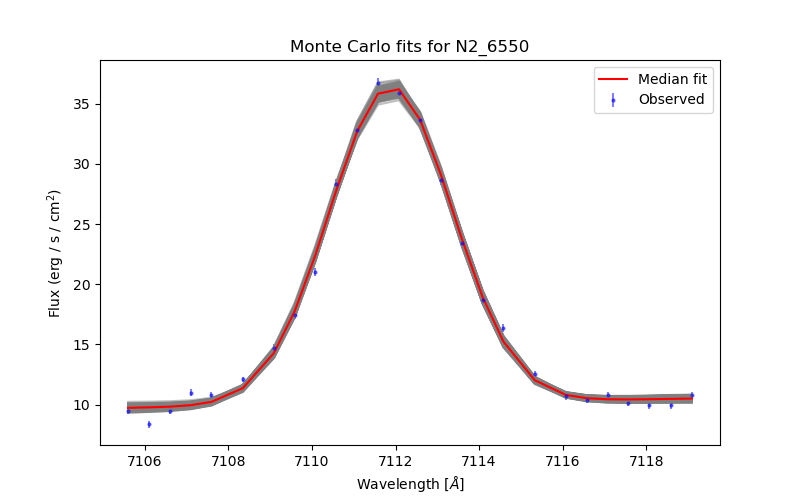

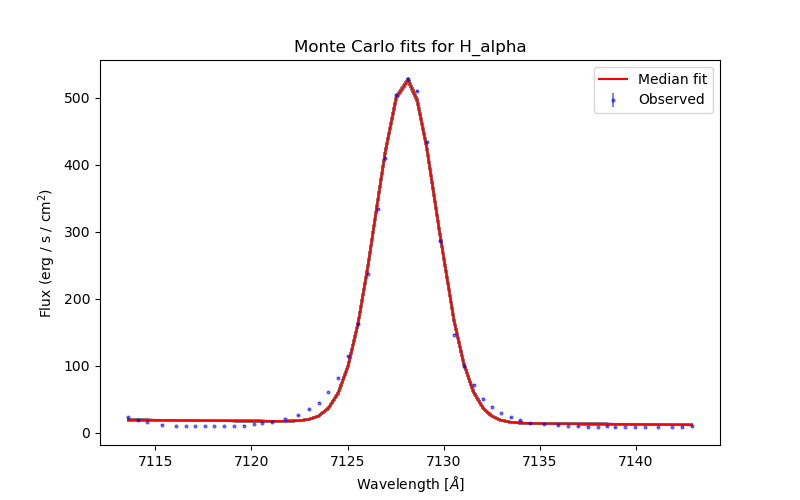

KeyboardInterrupt: 

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        A_val = fits[i].params[param_key].value
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        A_val = fits[i].params[param_key].value
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

In [ ]:
%matplotlib widget 

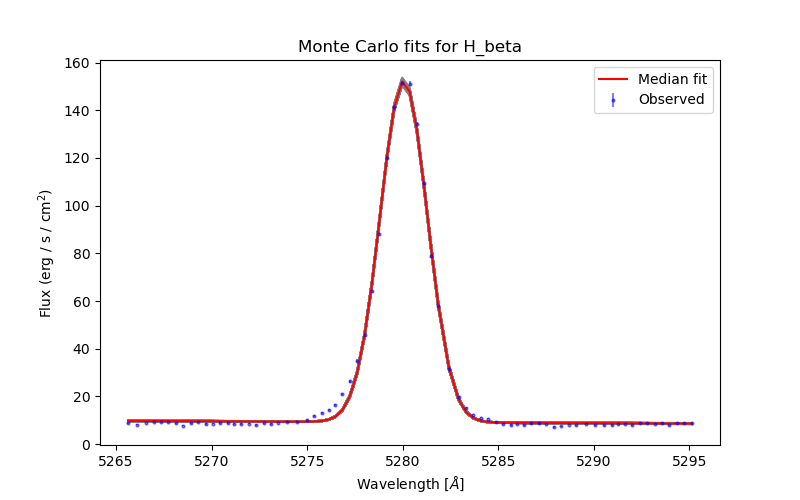

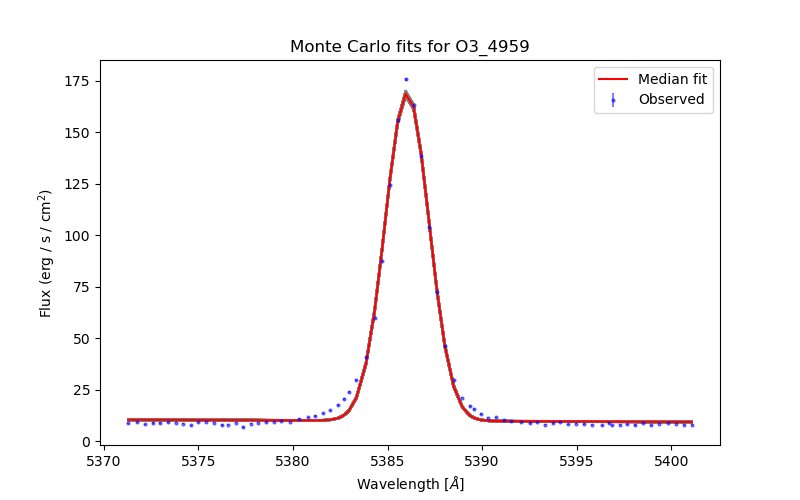

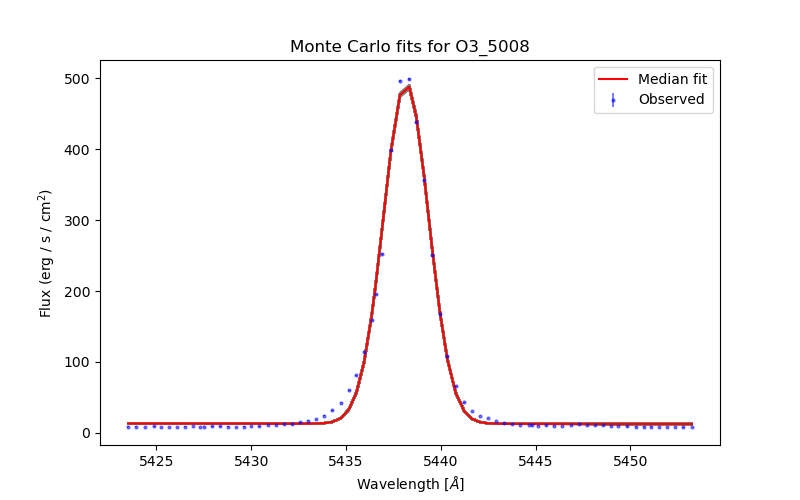

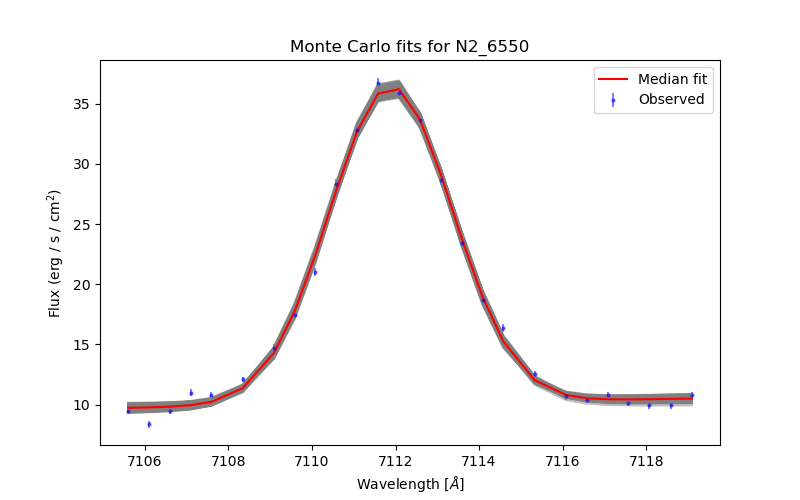

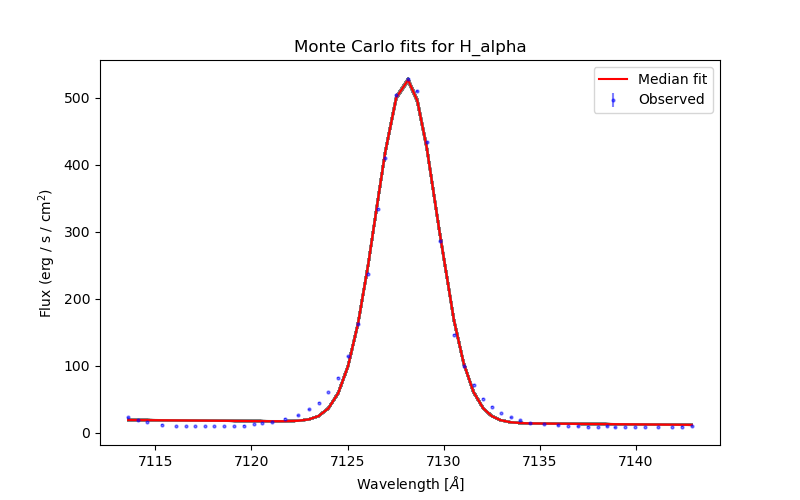

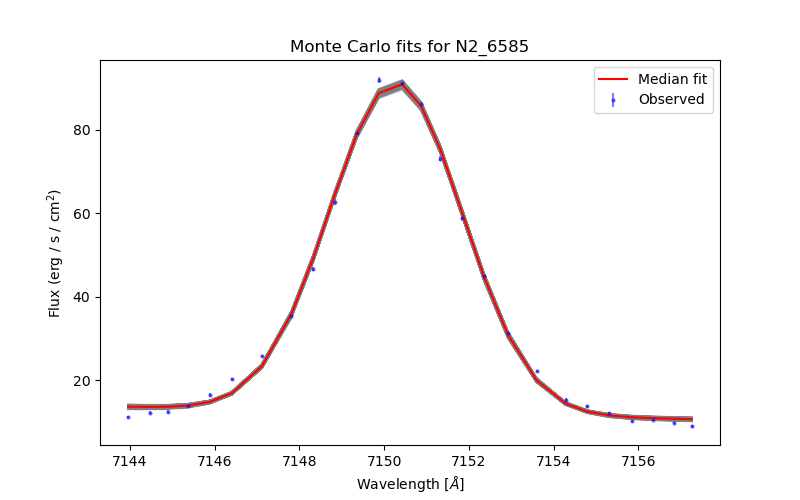

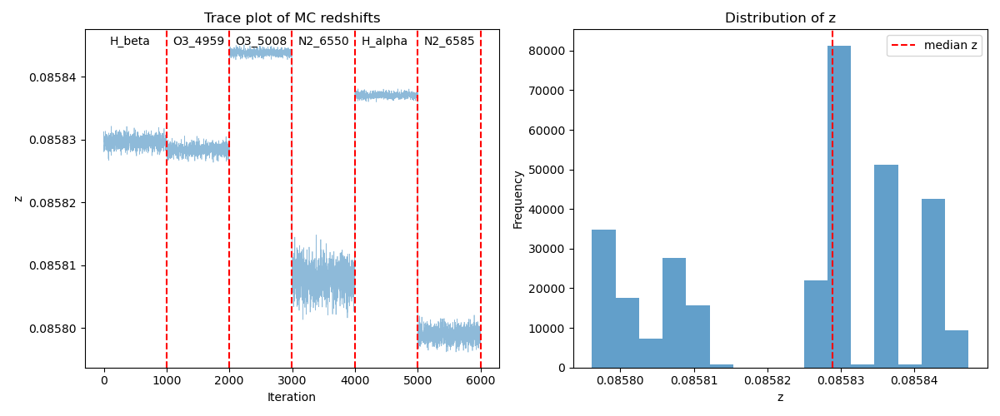

New redshift calculated for no_very_flats,z = 0.08582890717802427
Executed reset_redshift in 41.3558s
New redshift for J0328+0031,z = 0.08582890717802427
Reading data for J0328
Using MW dust corrected data


UnboundLocalError: cannot access local variable 'param_key' where it is not associated with a value

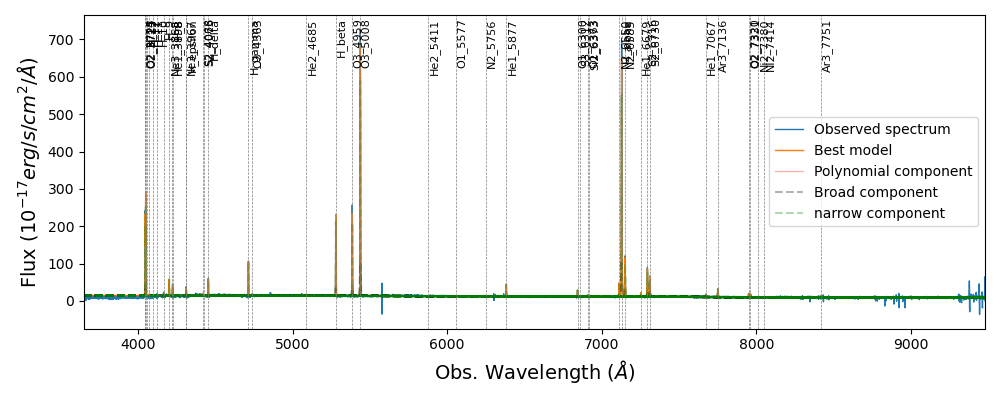

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        param_key = f"{line}_height"
        A_val = fits[i].params[param_key].value
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

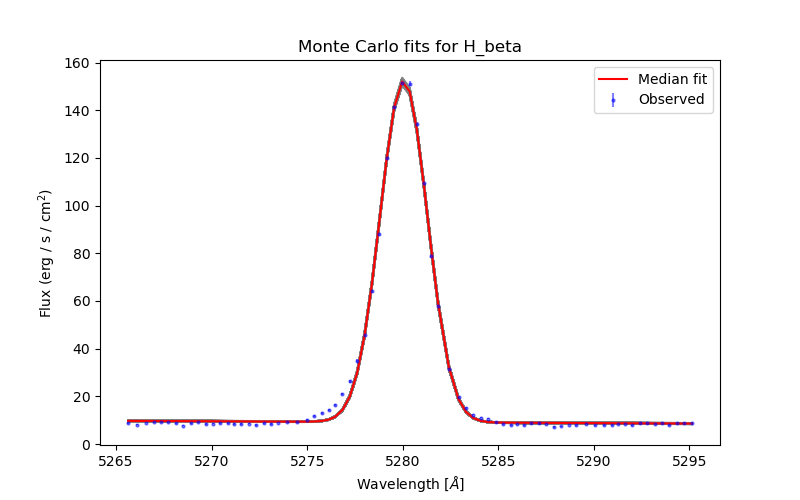

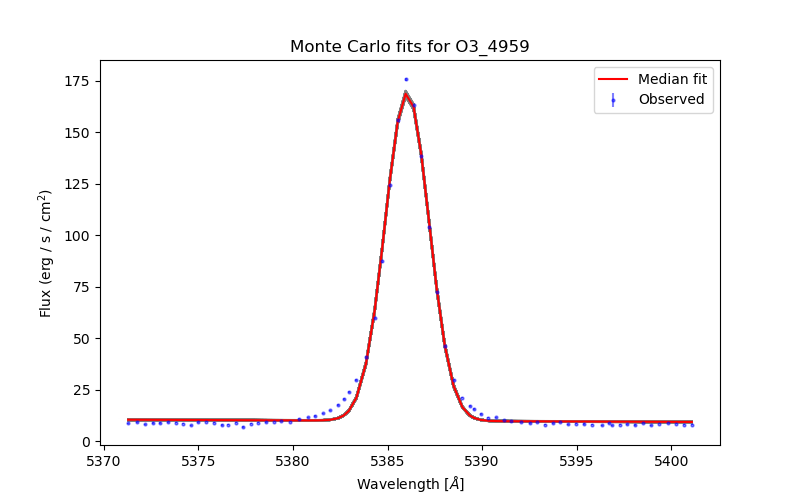

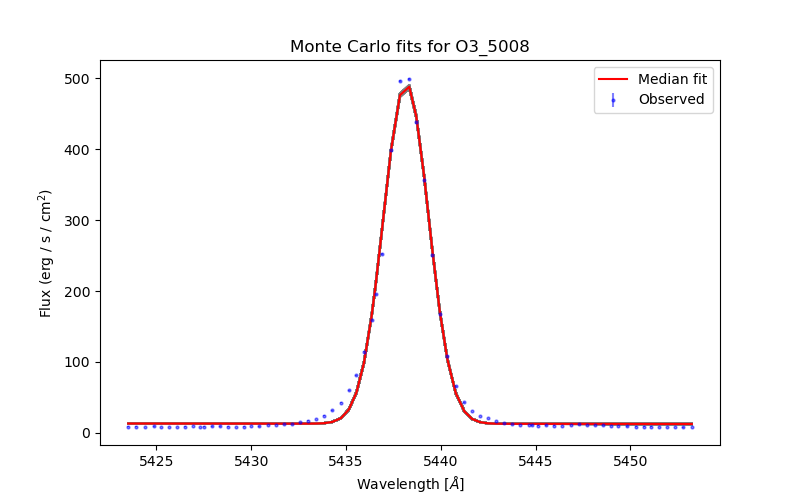

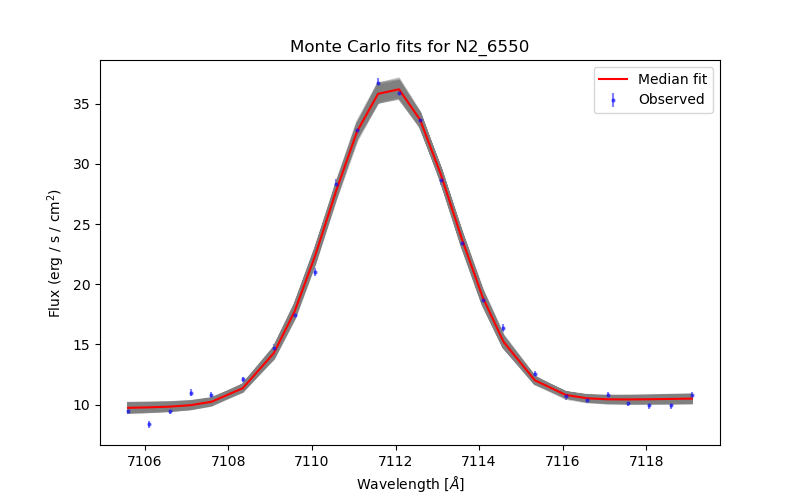

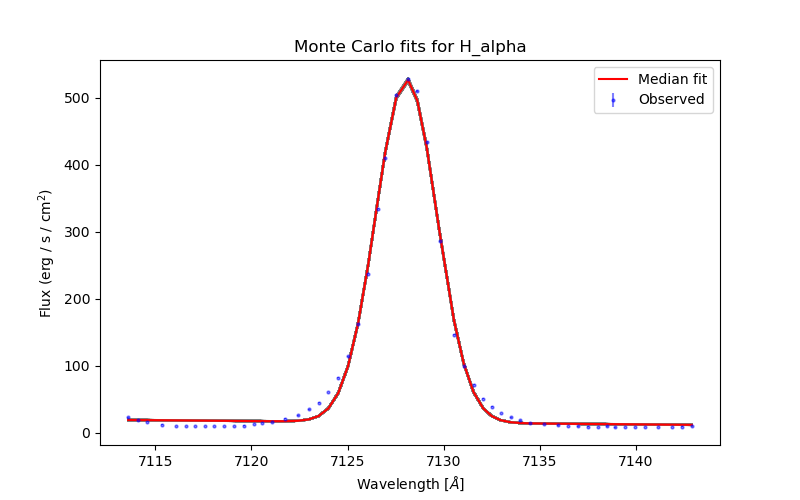

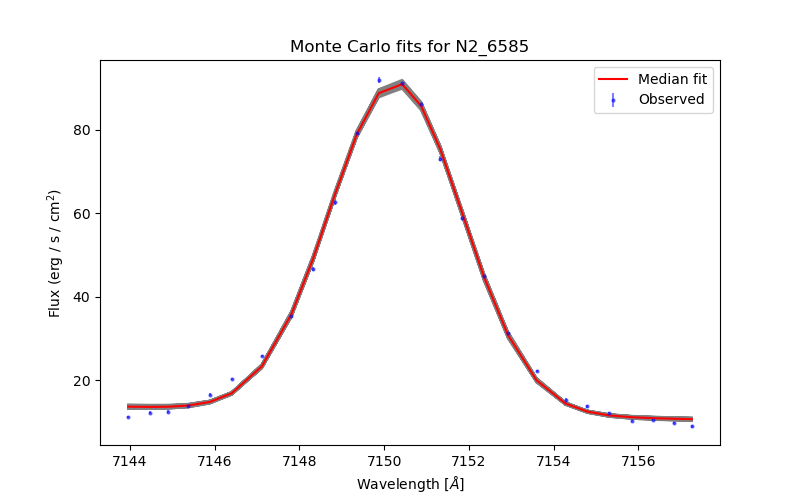

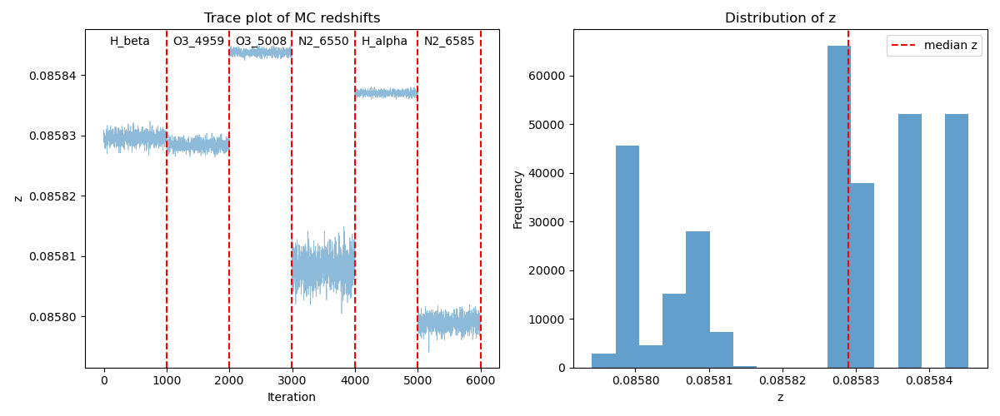

New redshift calculated for no_very_flats,z = 0.08582896112105398
Executed reset_redshift in 41.8154s
New redshift for J0328+0031,z = 0.08582896112105398
Reading data for J0328
Using MW dust corrected data


KeyError: 'H_14_height'

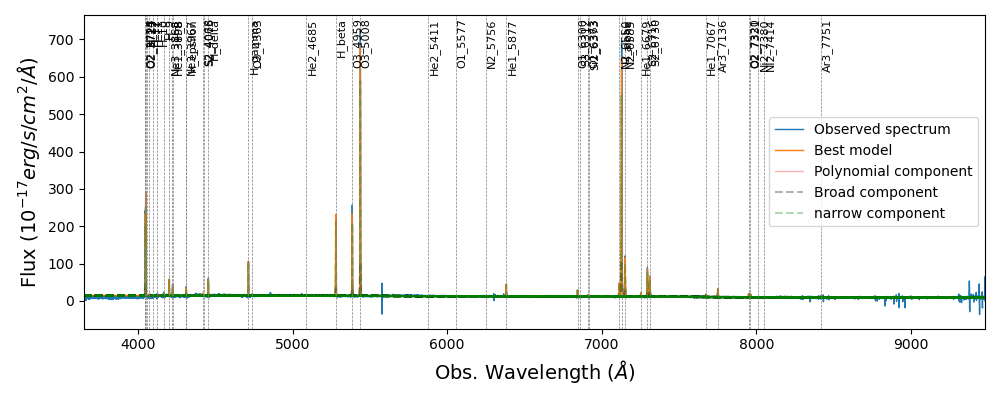

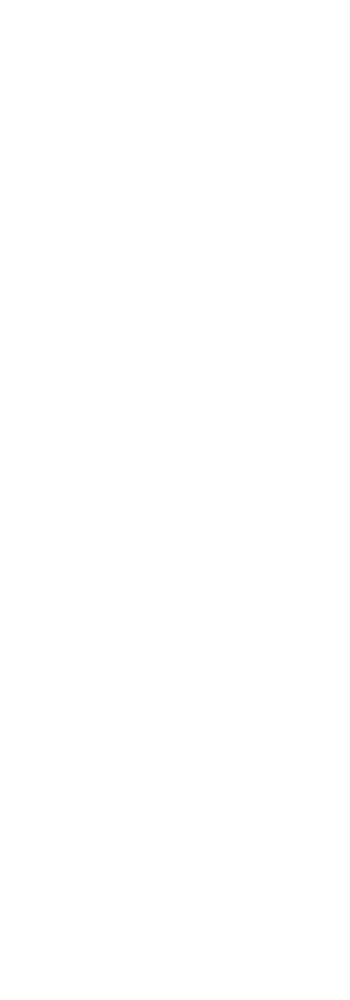

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

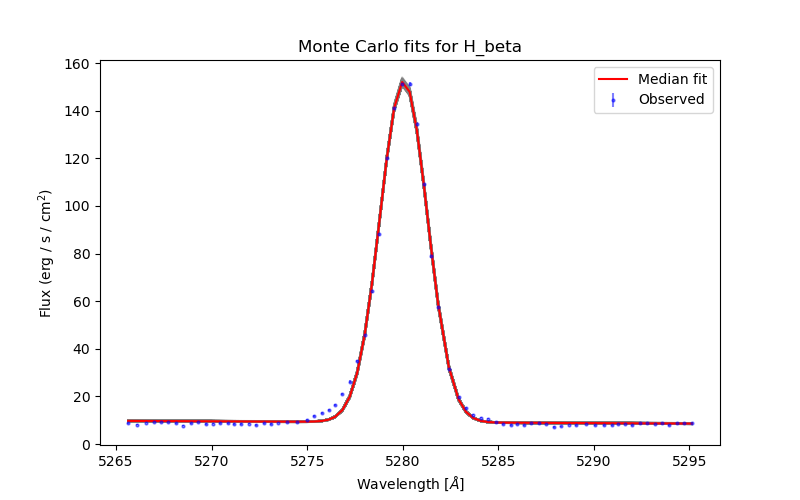

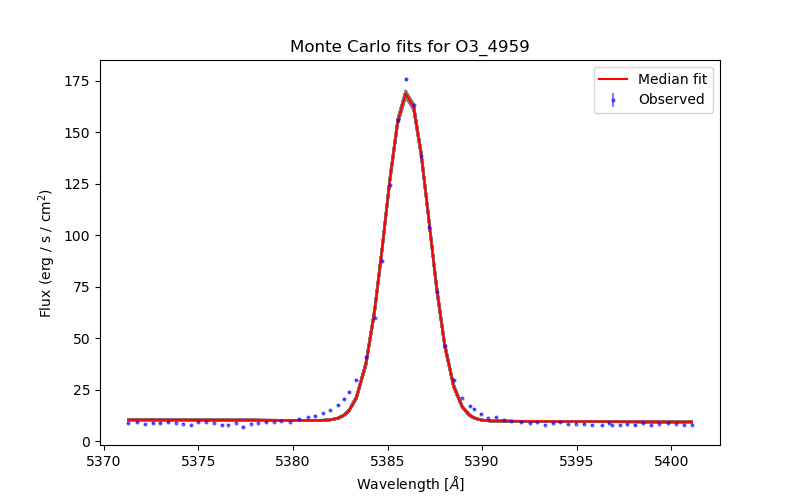

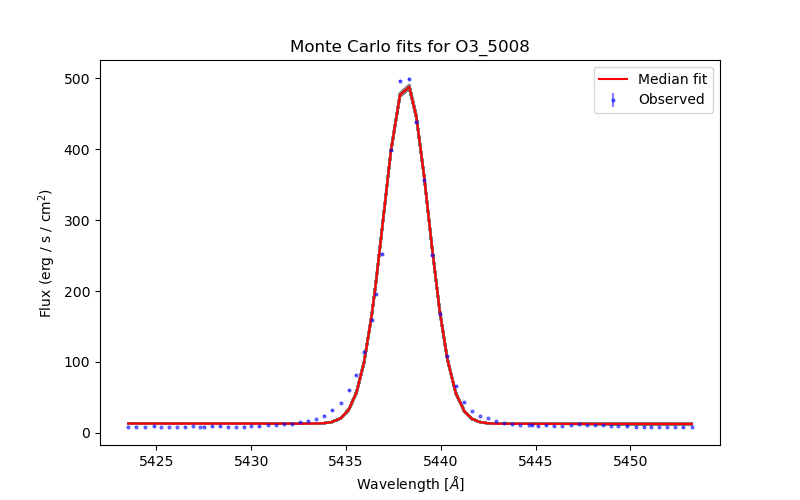

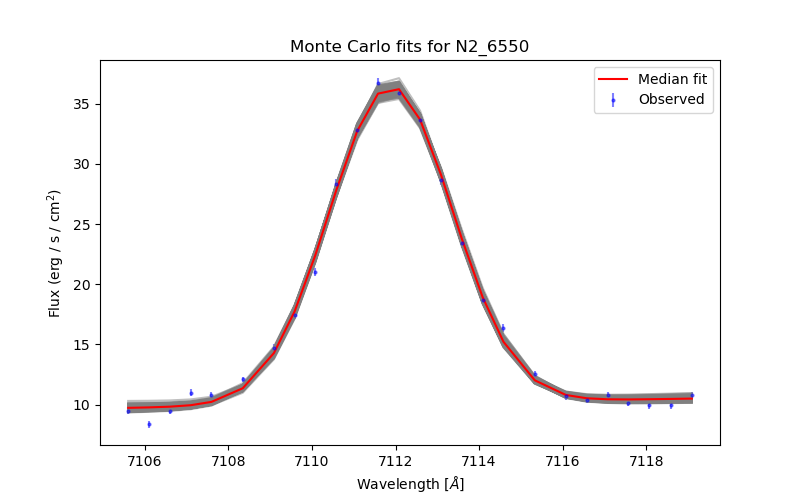

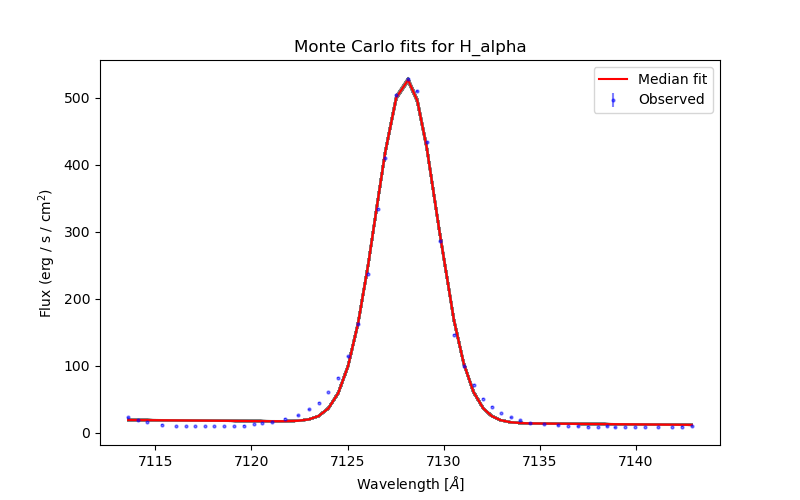

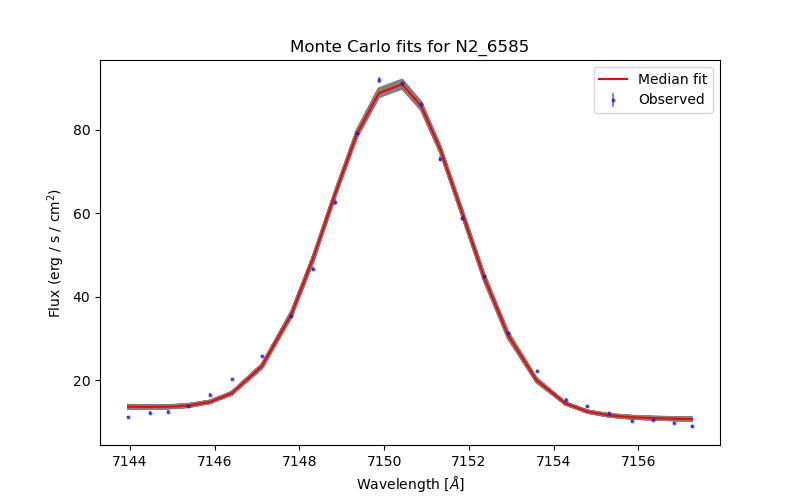

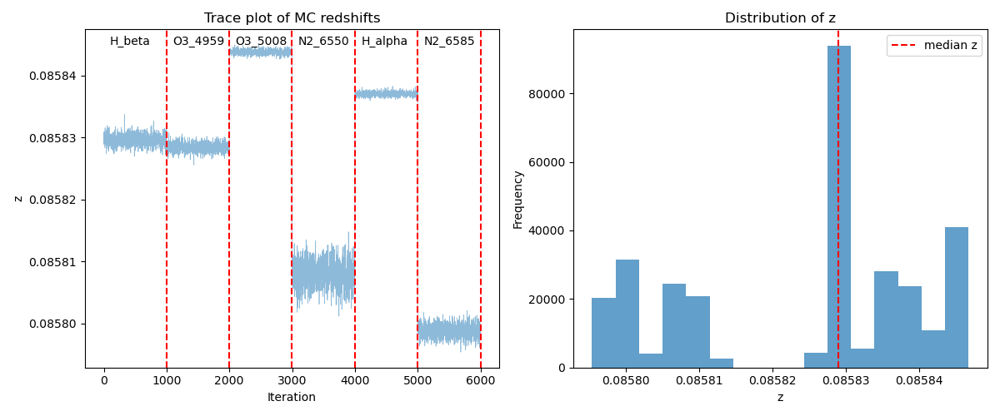

New redshift calculated for no_very_flats,z = 0.08582894730601831
Executed reset_redshift in 44.0327s
New redshift for J0328+0031,z = 0.08582894730601831
Reading data for J0328
Using MW dust corrected data


KeyError: 'H_8_height'

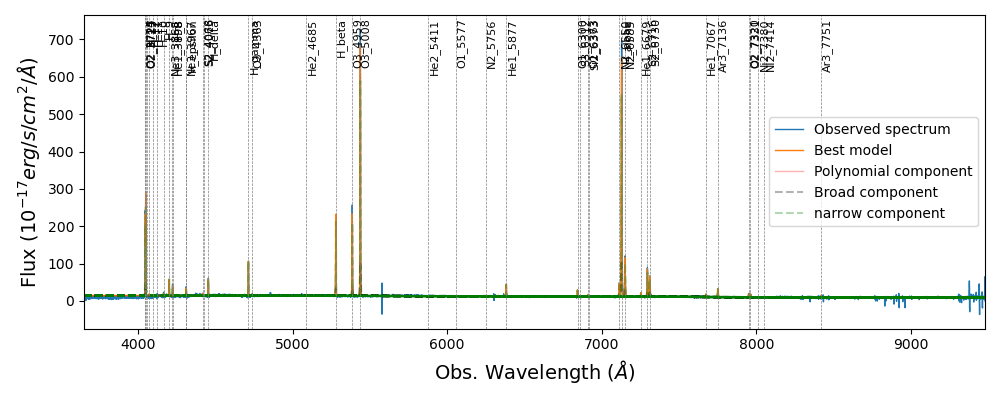

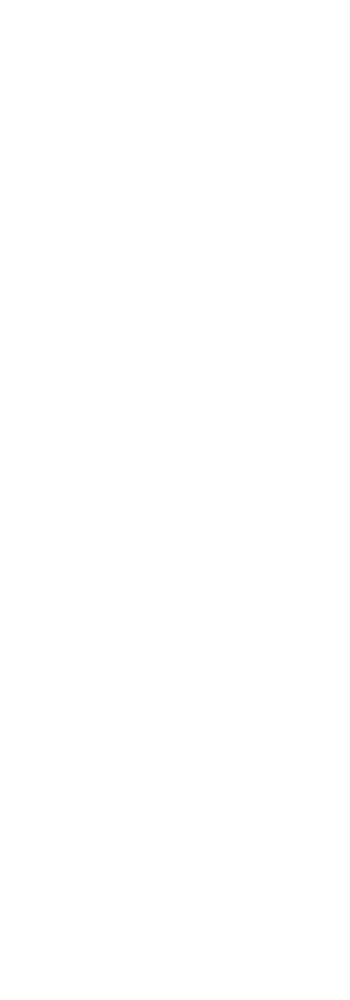

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
balmer_lines

['H_gamma', 'H_delta', 'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']

In [ ]:
fits

In [ ]:
fits[3]

In [ ]:
fits[3].params['H_8_height']

<Parameter 'H_8_height', value=np.float64(-3.1213503117626713) +/- 0.332, bounds=[-inf:inf], expr='0.3989423*H_8_amplitude/max(1e-15, H_8_sigma)'>

In [ ]:
fits[3].params['H_8_height'].value

np.float64(-3.1213503117626713)

In [ ]:

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    flux = data[1]
    corrected_flux = flux.copy()
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        param_key = f"{line}_height"


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

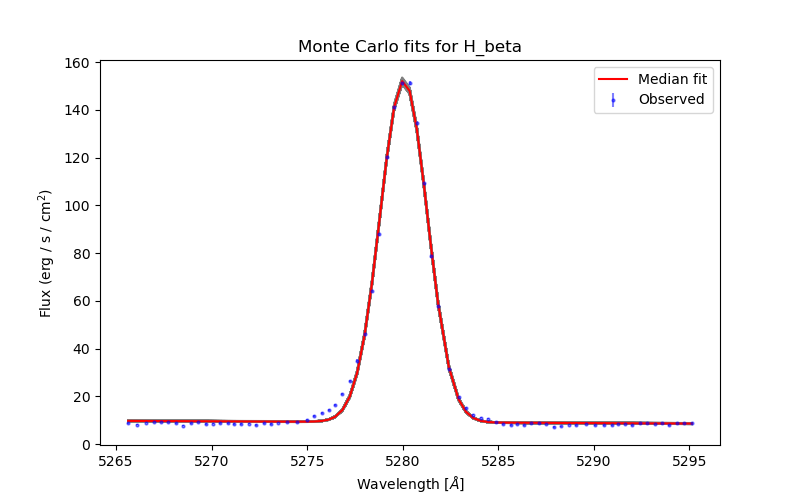

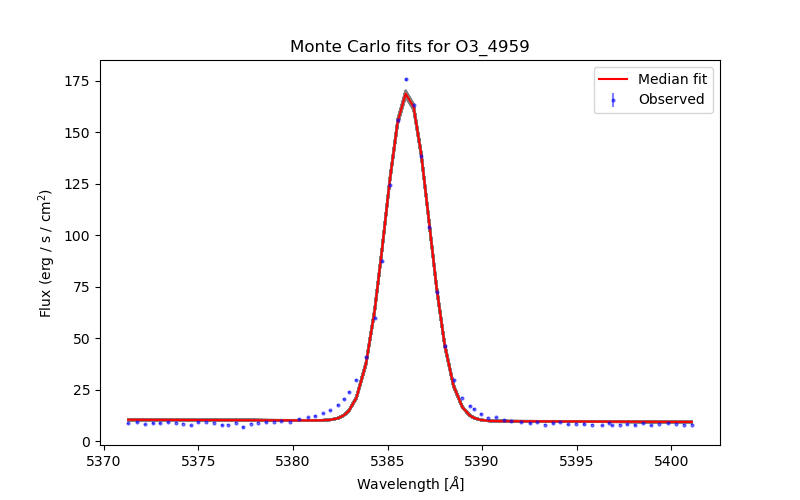

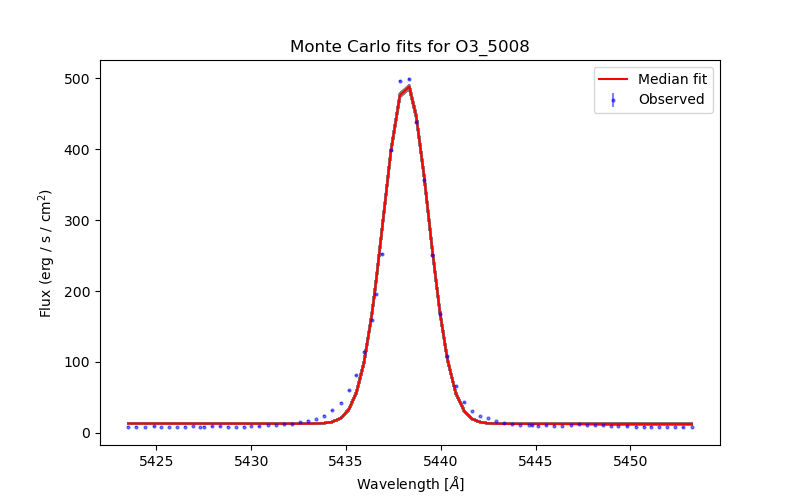

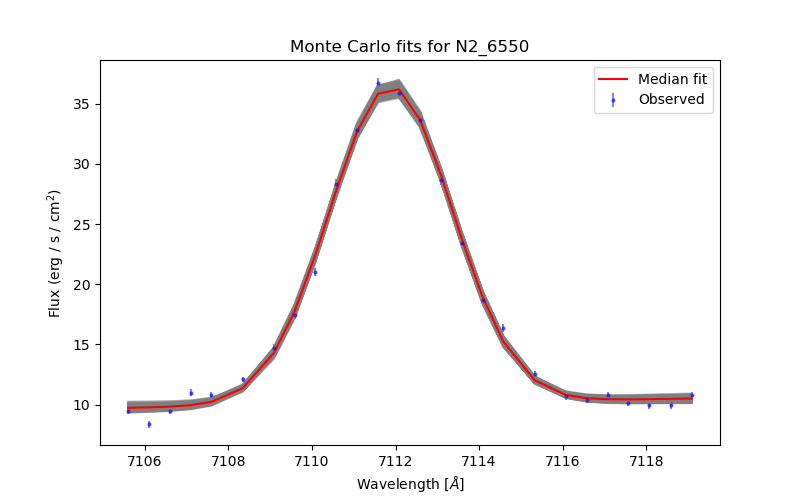

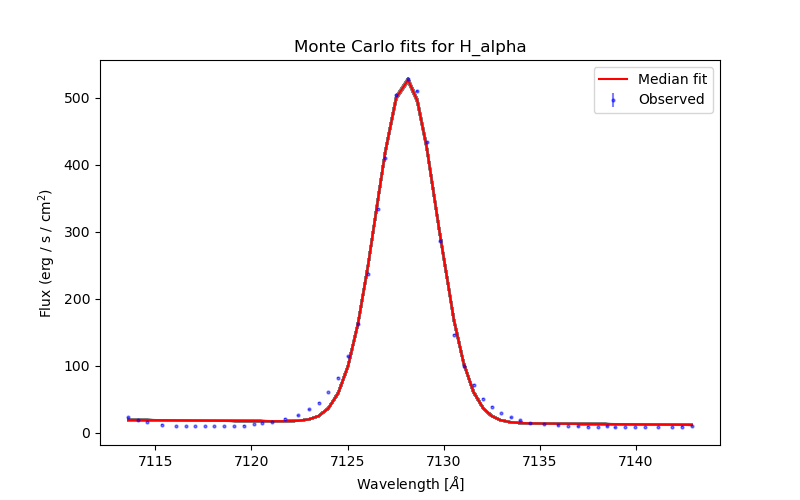

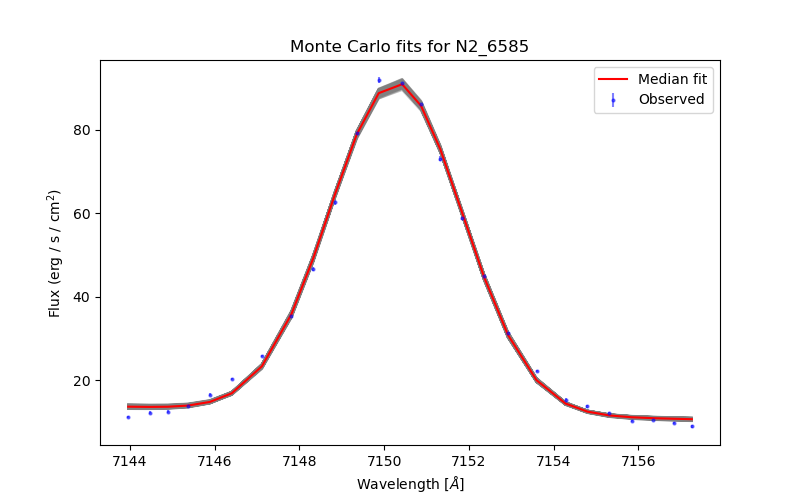

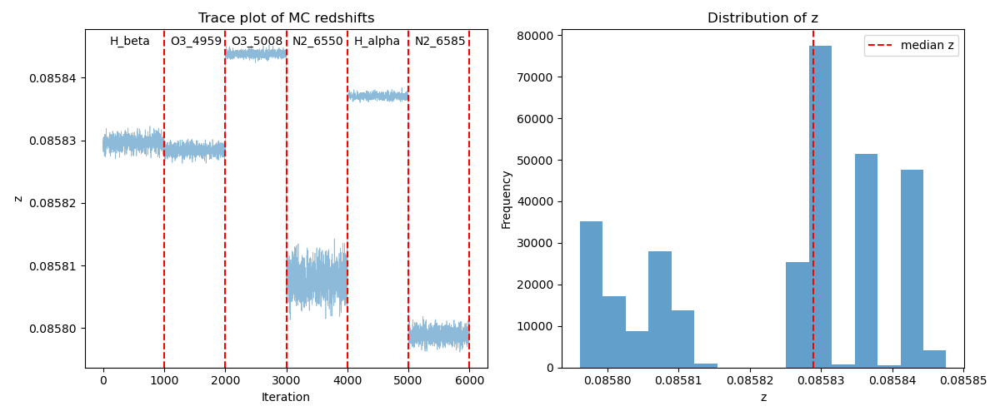

New redshift calculated for no_very_flats,z = 0.08582896356583658
Executed reset_redshift in 42.8035s
New redshift for J0328+0031,z = 0.08582896356583658
Reading data for J0328
Using MW dust corrected data


KeyError: 'H_8_height'

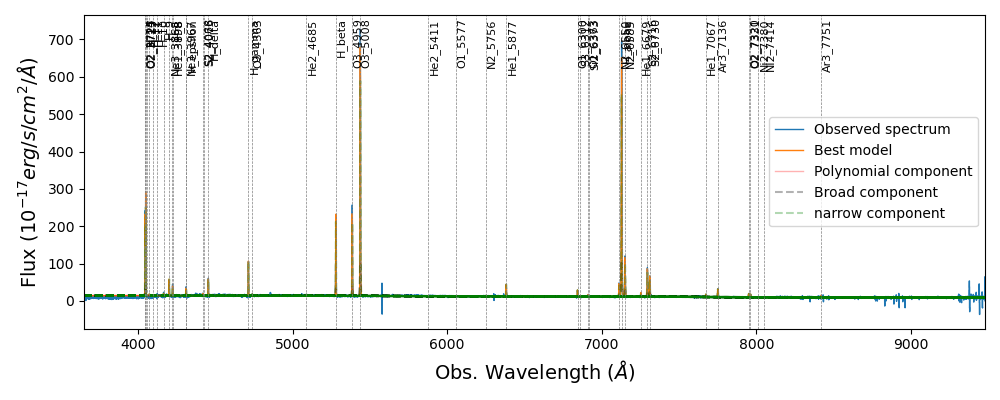

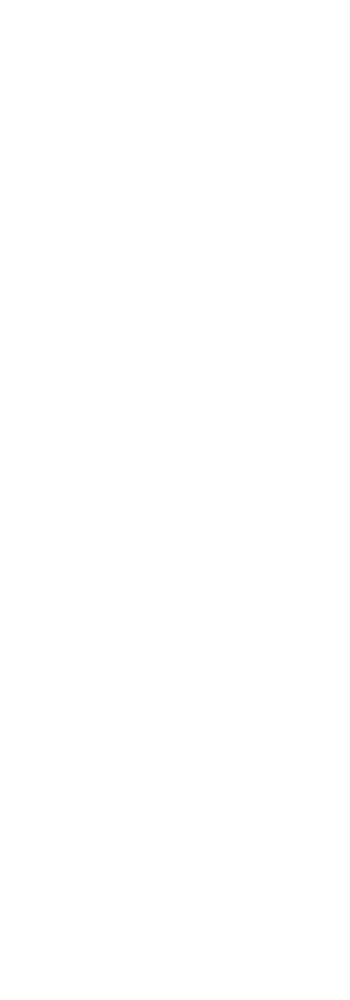

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

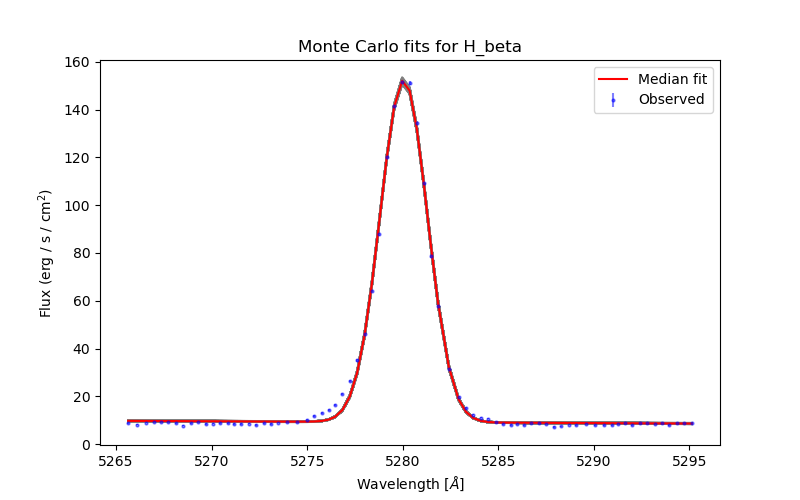

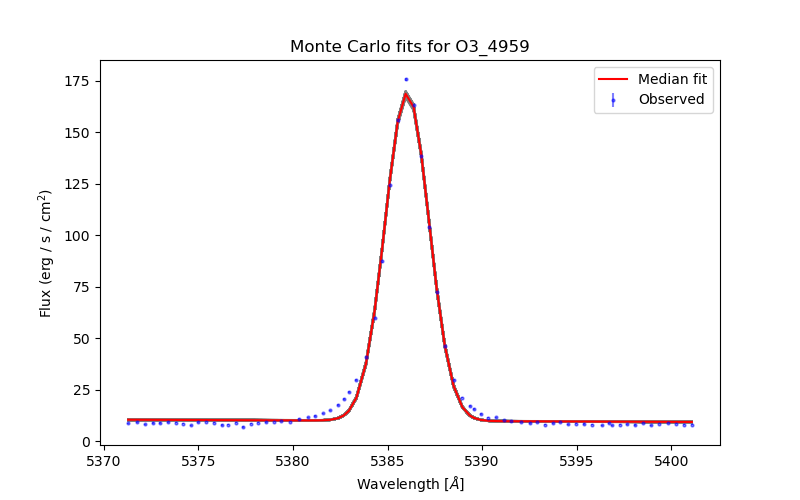

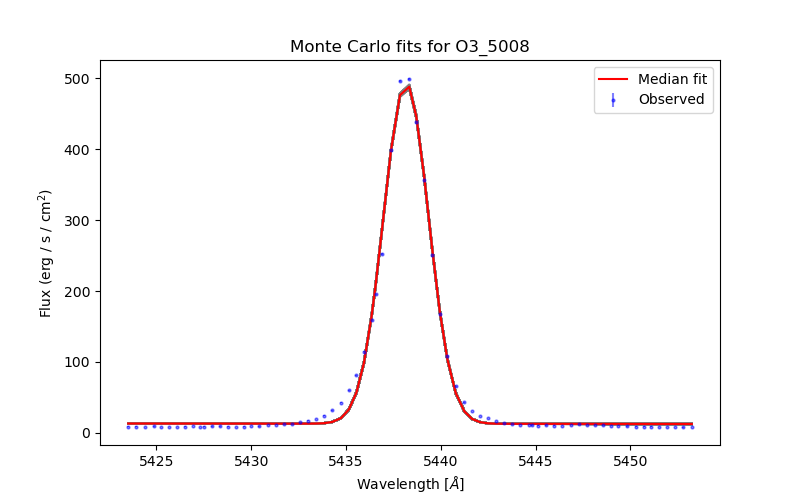

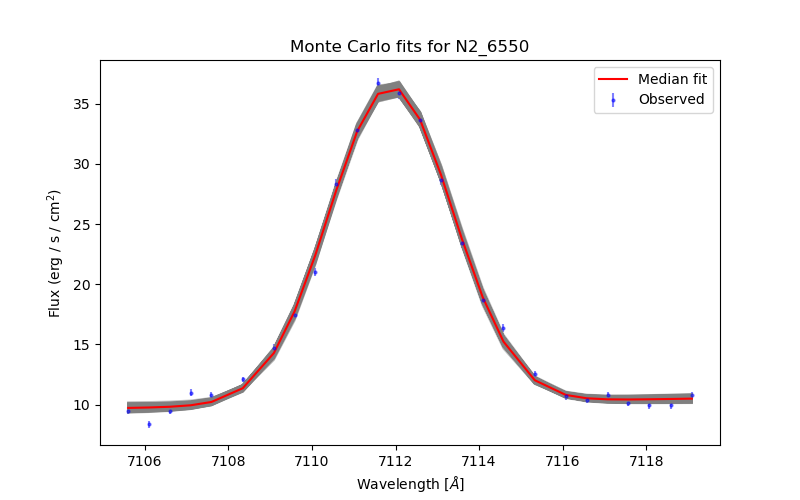

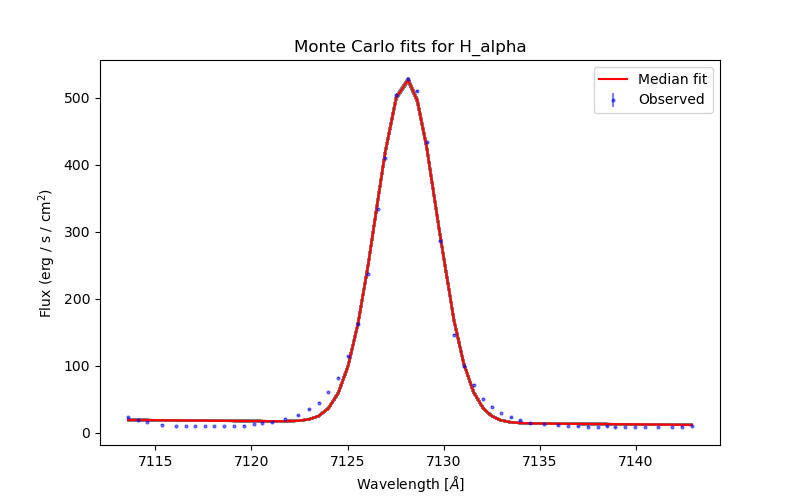

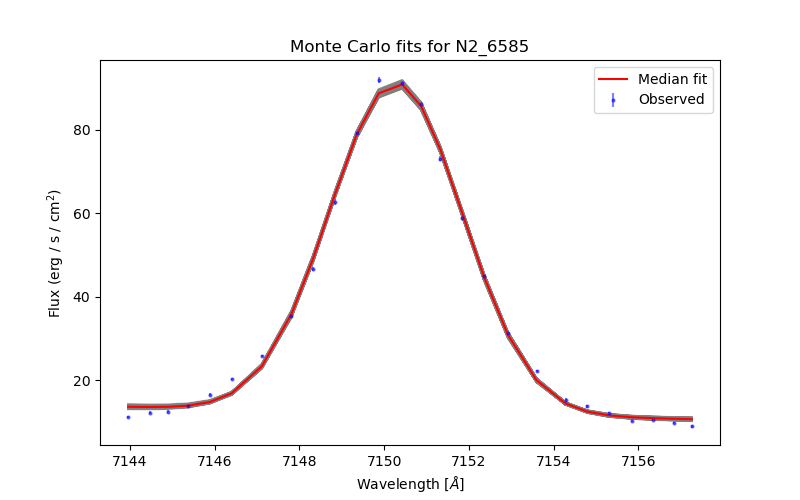

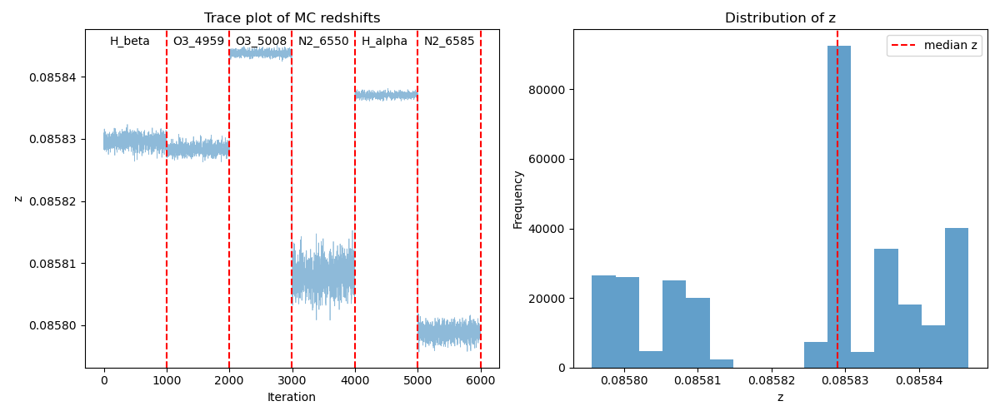

New redshift calculated for no_very_flats,z = 0.08582894151788523
Executed reset_redshift in 43.4061s
New redshift for J0328+0031,z = 0.08582894151788523
Reading data for J0328
Using MW dust corrected data


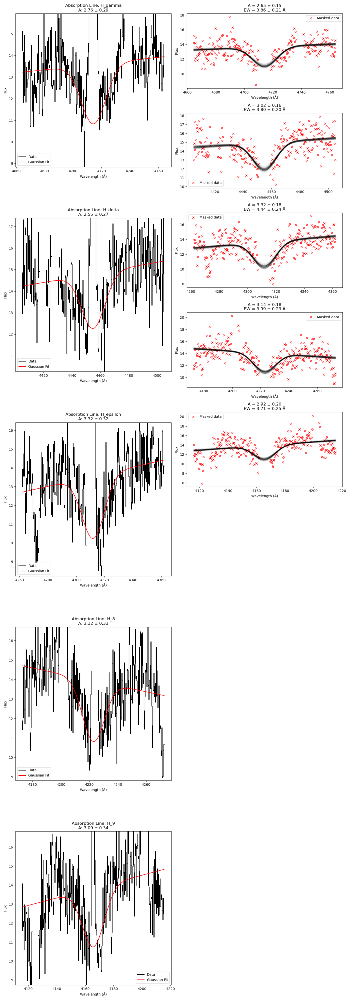

'Balmer absorption correction applied and results saved for J0328.'

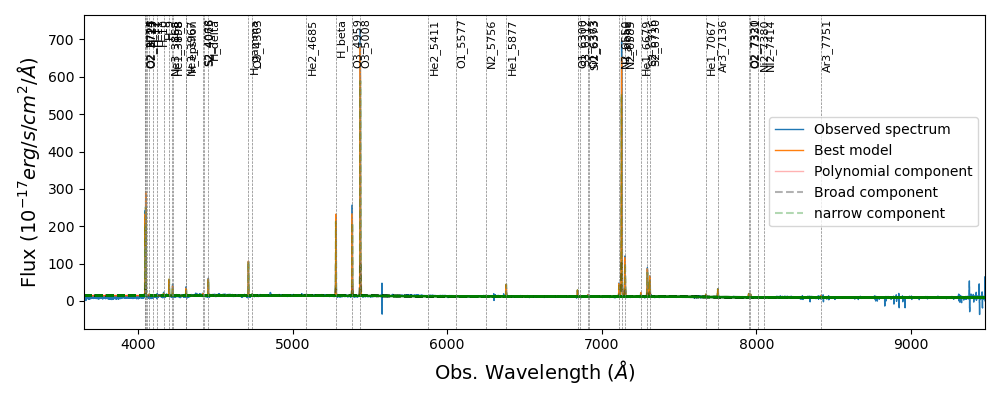

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
plt.figure()
plt.plot(data[0], data[1]. alpha=0.4)
plt.plot(data[0], corrected_flux, alpha=0.4)
plt.show()

SyntaxError: expression cannot contain assignment, perhaps you meant "=="? (<ipython-input-52-78253422e7ae>, line 2)

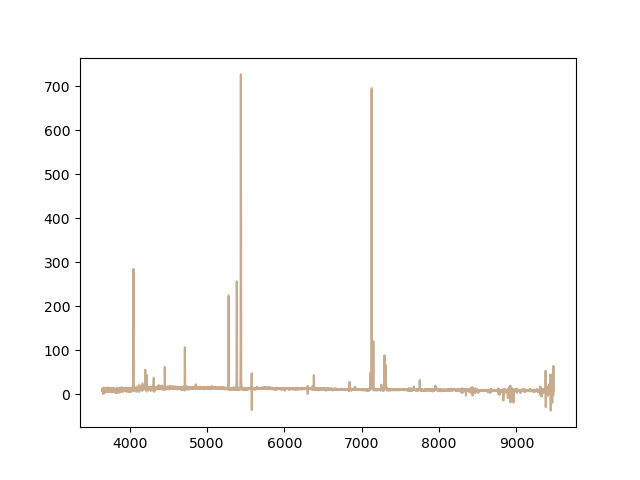

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4)
plt.plot(data[0], corrected_flux, alpha=0.4)
plt.show()

In [ ]:

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    corrected_flux = flux.copy()
    part2 = flux.copy()
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
            part2 -= gaus_2
        else:
            corrected_flux -= gaus_ew
            part2 -= gaus_2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

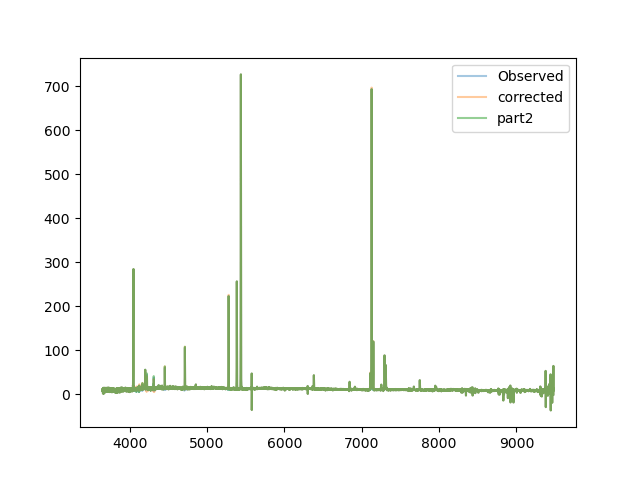

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corrected_flux, alpha=0.4, label='corrected')
plt.plot(data[0], part2, alpha=0.5, label='part2')
plt.legend()
plt.show()

In [ ]:

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    corrected_flux = flux.copy()
    part2 = flux.copy()
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            print(A_val)
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
            part2 -= gaus_2
        else:
            corrected_flux -= gaus_ew
            part2 -= gaus_2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

-3.323978610048242
-3.1213503117626713


In [ ]:

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    corrected_flux = flux.copy()
    part2 = flux.copy()
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            print(A_val, line)
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
            part2 -= gaus_2
        else:
            corrected_flux -= gaus_ew
            part2 -= gaus_2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

-3.323978610048242 H_epsilon
-3.1213503117626713 H_8


In [ ]:

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    corrected_flux = flux.copy()
    part2 = flux.copy()
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            print(A_val, line)
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
            part2 -= gaus_2
        else:
            print(line)
            corrected_flux -= gaus_ew
            part2 -= gaus_2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

H_gamma
H_delta
-3.323978610048242 H_epsilon
-3.1213503117626713 H_8
H_9
H_10
H_11
H_12


In [ ]:

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    corrected_flux = flux.copy()
    part2 = flux.copy()
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = -1 * fits[i].params[param_key].value
            print(A_val, line)
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
            part2 -= gaus_2
        else:
            print(line)
            corrected_flux -= gaus_ew
            part2 -= gaus_2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

H_gamma
H_delta
3.323978610048242 H_epsilon
3.1213503117626713 H_8
H_9
H_10
H_11
H_12


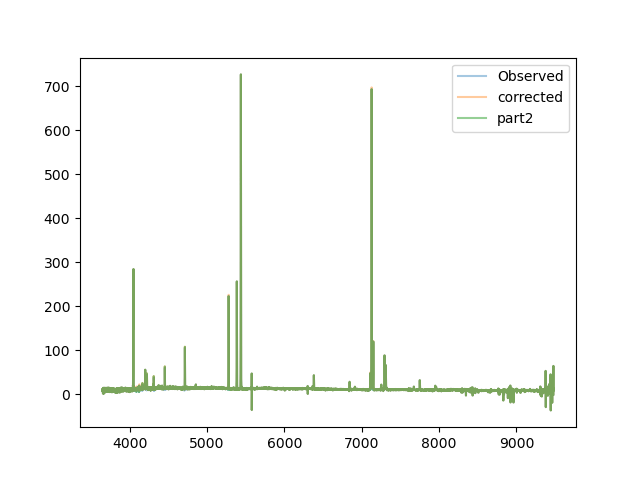

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corrected_flux, alpha=0.4, label='corrected')
plt.plot(data[0], part2, alpha=0.5, label='part2')
plt.legend()
plt.show()

In [ ]:

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    corrected_flux = flux.copy()
    part2 = flux.copy()
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if line in balmer_lines[:5]:
            param_key = f"{line}_height"
            A_val = -1 * fits[i].params[param_key].value
            corrected_flux -= neg_gauss(class_, line, data[0], A_val)
            part2 -= gaus_2
        else:
            corrected_flux -= gaus_ew
            part2 -= gaus_2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

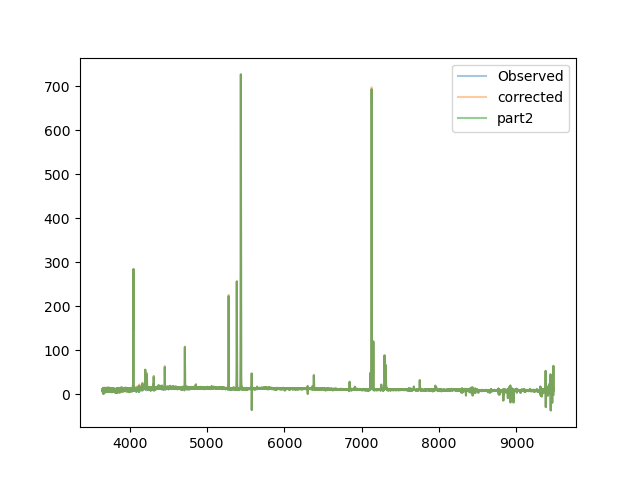

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corrected_flux, alpha=0.4, label='corrected')
plt.plot(data[0], part2, alpha=0.5, label='part2')
plt.legend()
plt.show()

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= gaus_2
        else:
            corrected_flux -= gaus_ew

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

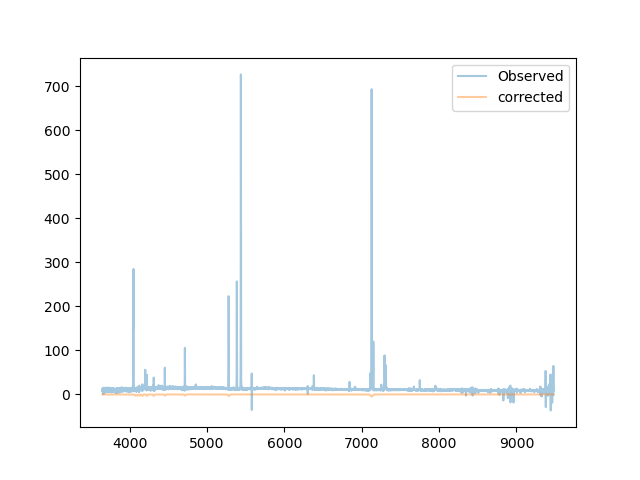

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.legend()
plt.show()

In [ ]:
stellar_abs = np.zeros(flux.shape())

TypeError: 'tuple' object is not callable

In [ ]:
flux.shape()

TypeError: 'tuple' object is not callable

In [ ]:
flux.shape

(12619,)

In [ ]:
stellar_abs = np.zeros(flux.shape)

In [ ]:
absorption

array([-0., -0., -0., ..., -0., -0., -0.])

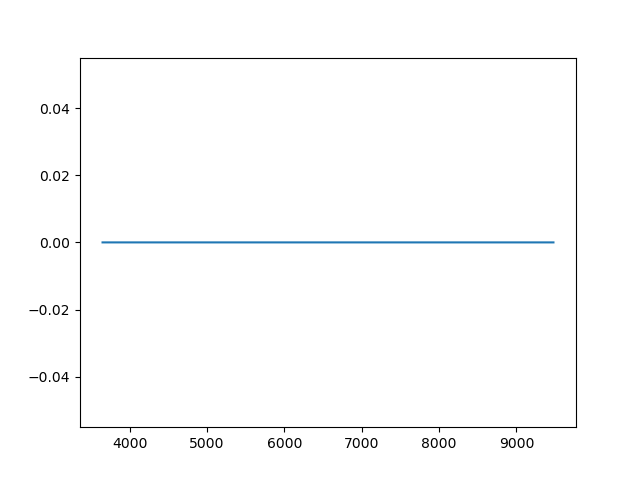

In [ ]:
plt.figure()
plt.plot(data[0], stellar_abs)
plt.show()


In [ ]:
stellar_abs += absorption

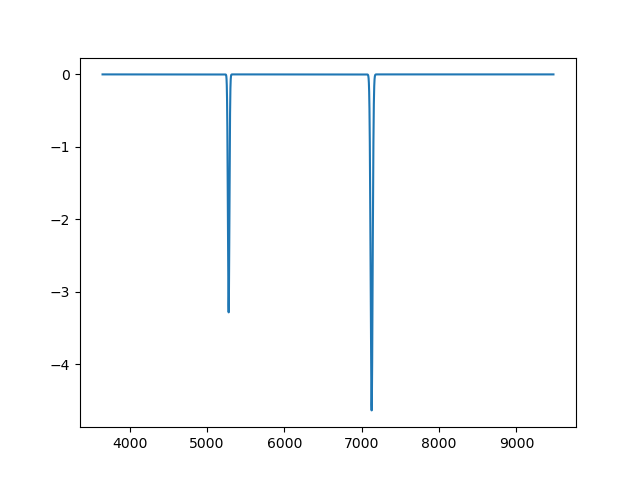

In [ ]:
plt.figure()
plt.plot(data[0], stellar_abs)
plt.show()


In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output1 = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    output2 = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n 
    return output1, output2


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    stellar_abs = np.zeros(flux.shape)
    data = read_data(class_)
    flux = data[1]
    fit = np.zeros()
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew, fit2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2, fit3  = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= gaus_2
            stellar_abs += fit3
        else:
            corrected_flux -= gaus_ew
            stellar_abs += fit2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption
    stellar_abs += absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

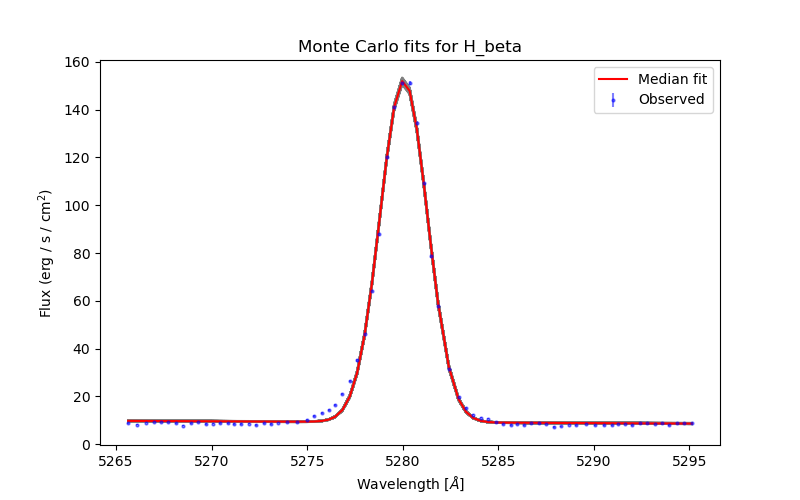

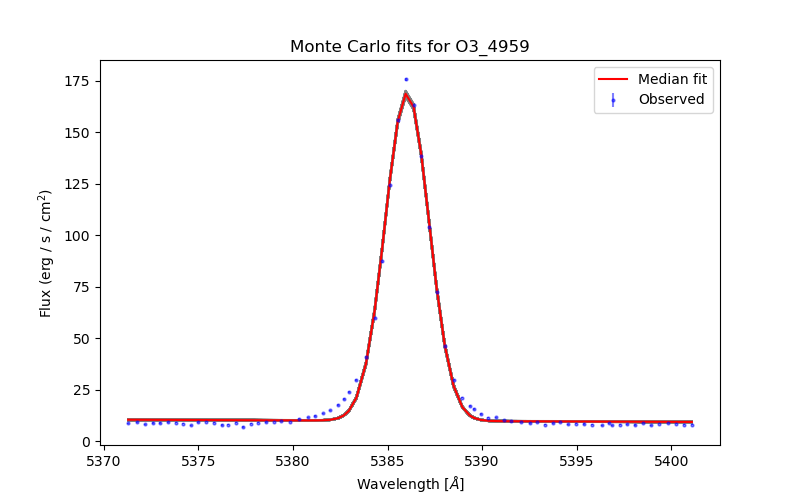

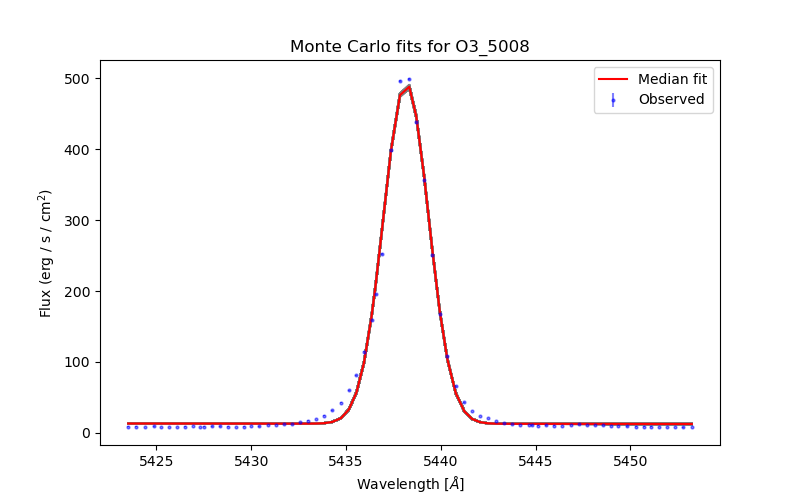

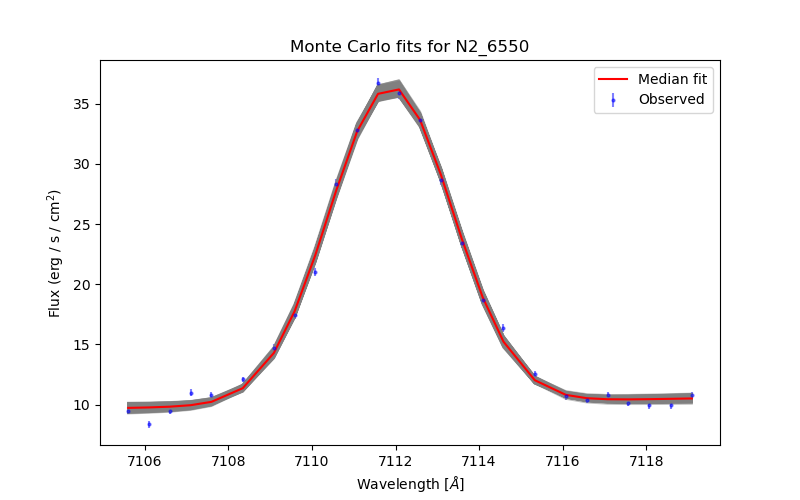

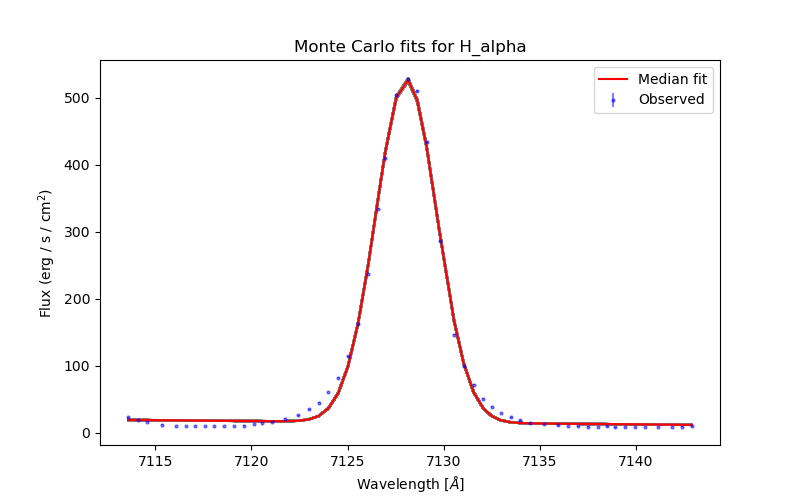

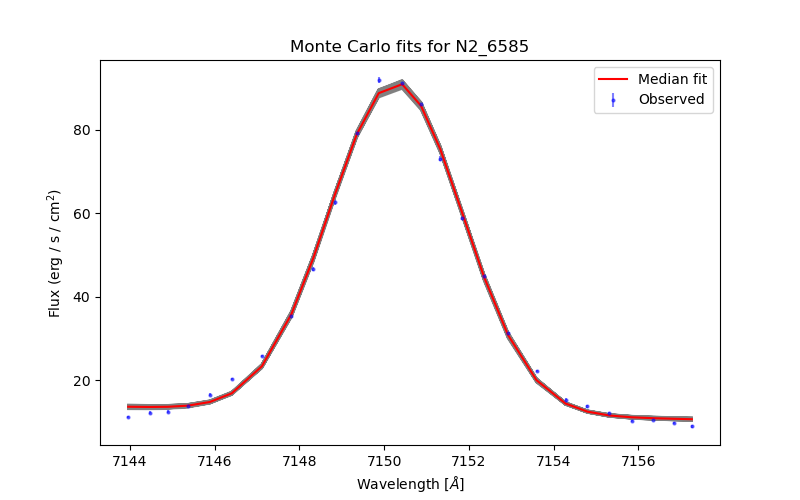

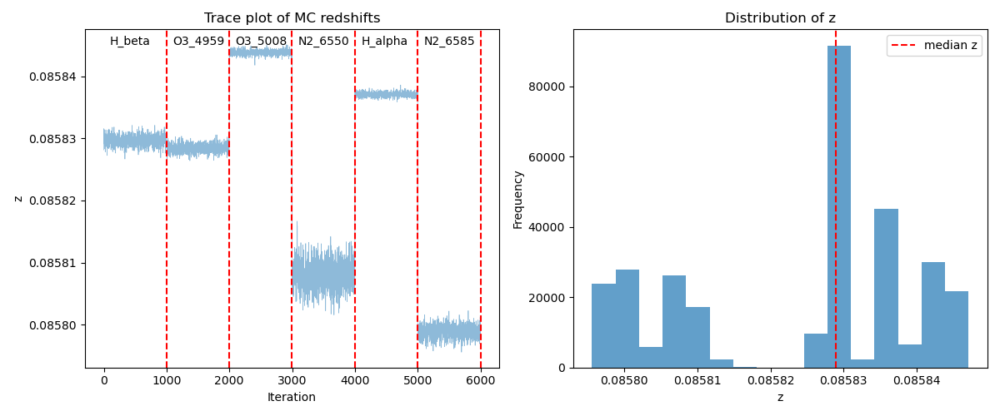

New redshift calculated for no_very_flats,z = 0.08582895255670109
Executed reset_redshift in 41.8449s
New redshift for J0328+0031,z = 0.08582895255670109


UnboundLocalError: cannot access local variable 'flux' where it is not associated with a value

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output1 = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    output2 = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n 
    return output1, output2


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    stellar_abs = np.zeros(flux.shape)
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew, fit2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2, fit3  = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= gaus_2
            stellar_abs += fit3
        else:
            corrected_flux -= gaus_ew
            stellar_abs += fit2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption
    stellar_abs += absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

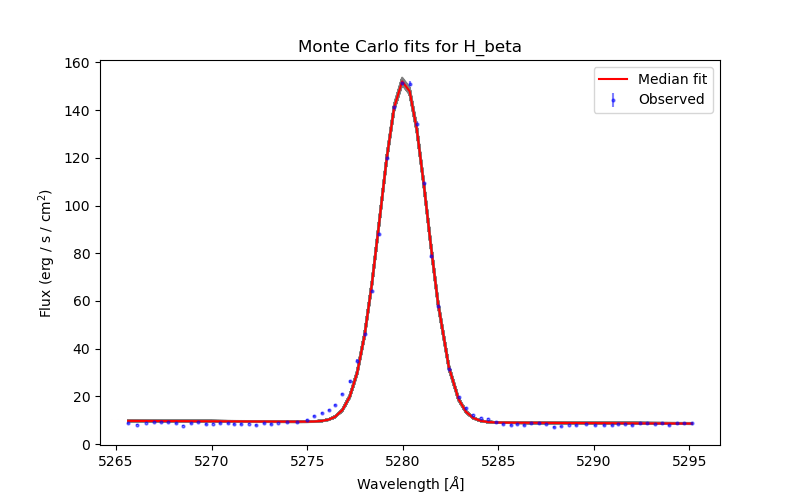

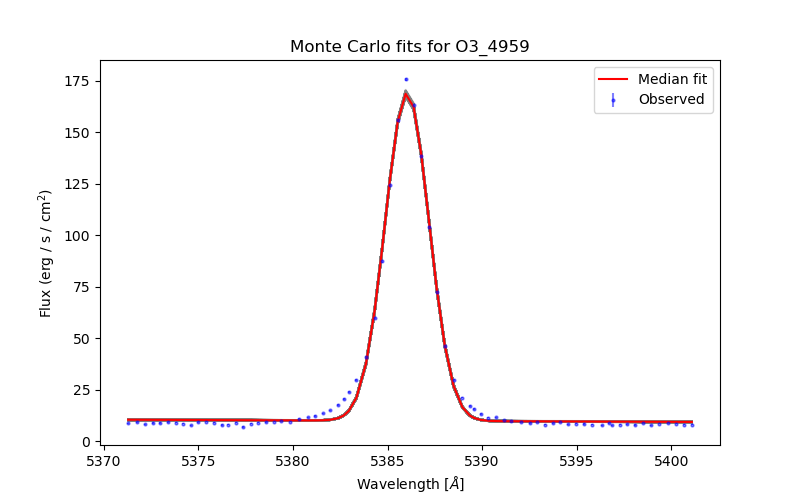

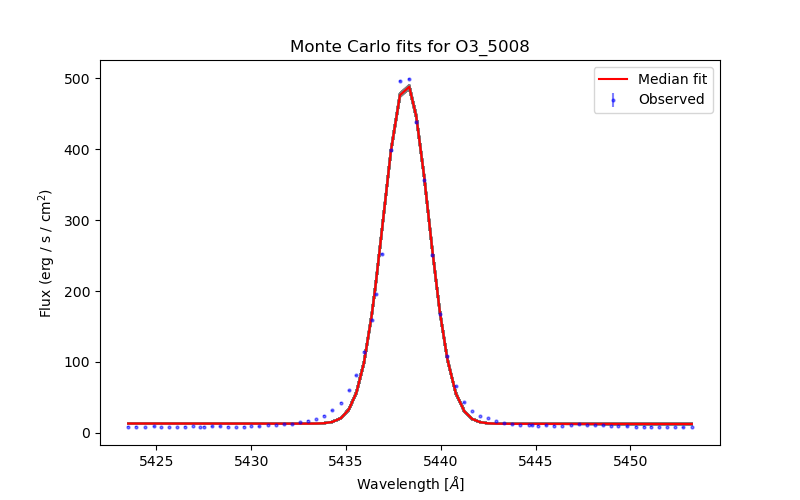

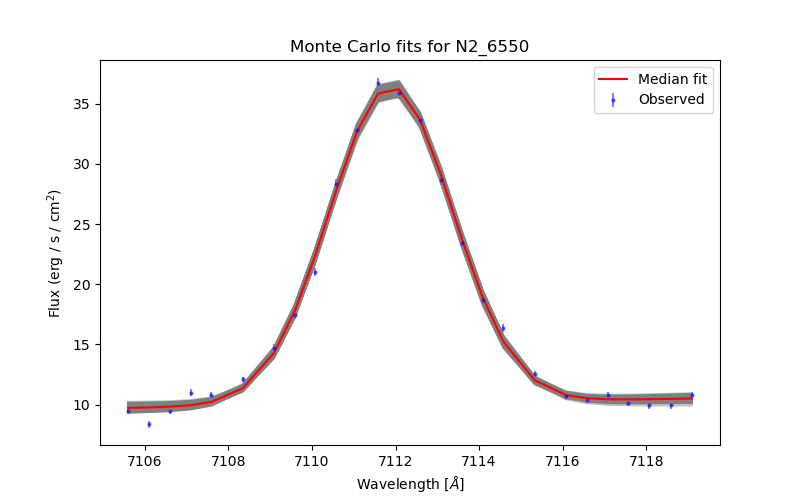

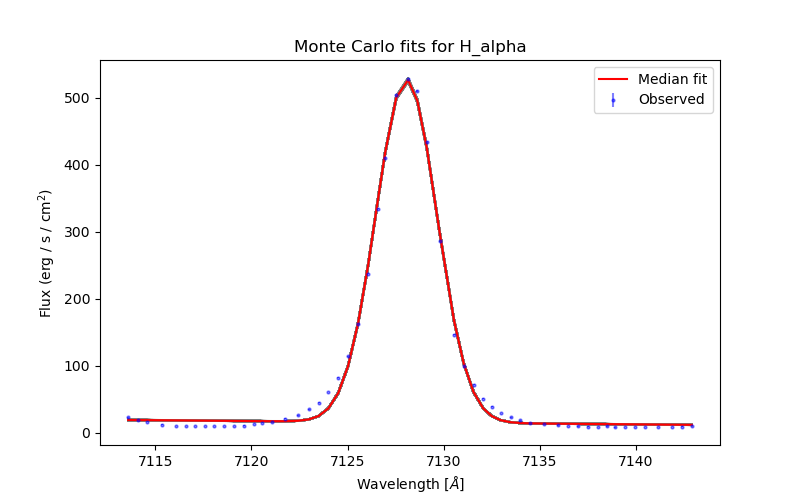

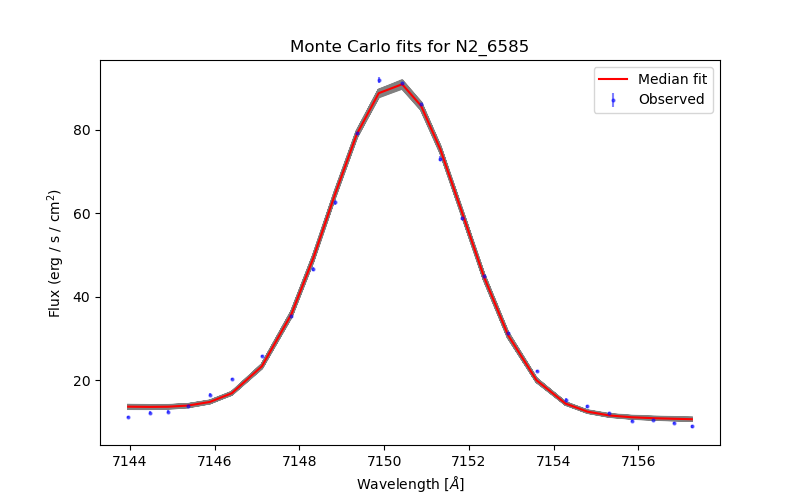

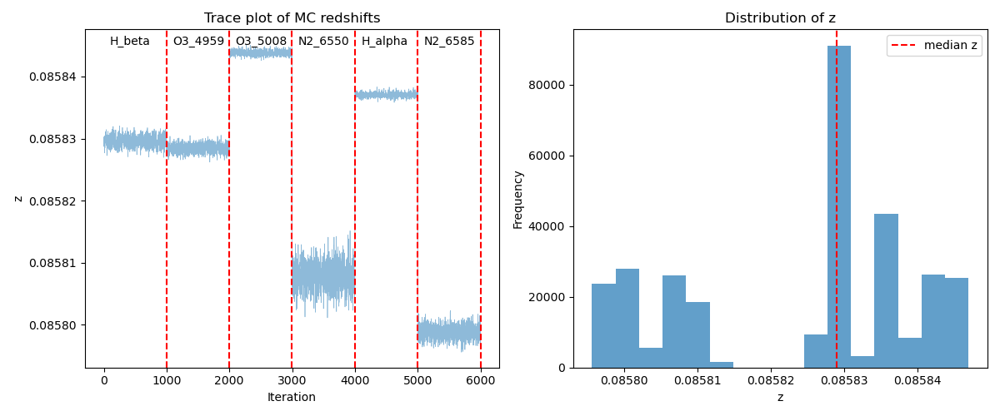

New redshift calculated for no_very_flats,z = 0.08582898918482684
Executed reset_redshift in 40.1345s
New redshift for J0328+0031,z = 0.08582898918482684
Reading data for J0328
Using MW dust corrected data


ValueError: non-broadcastable output operand with shape (12619,) doesn't match the broadcast shape (4,12619)

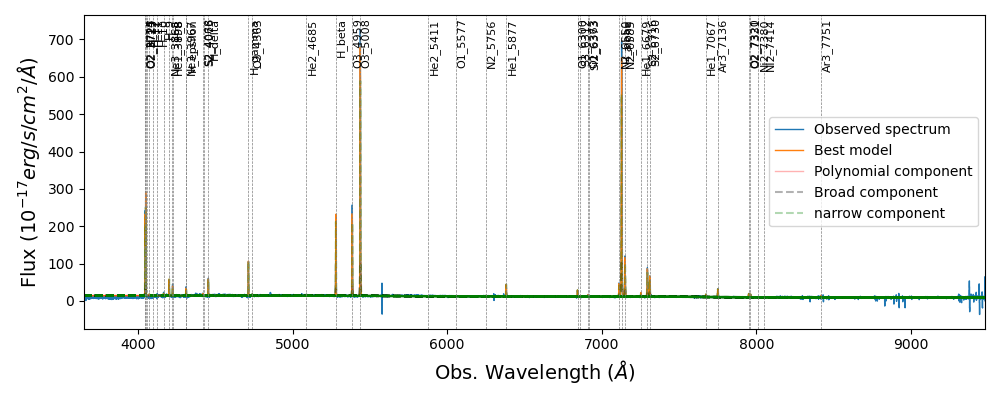

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output1 = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    output2 = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n 
    return output1, output2


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    stellar_abs = np.zeros(data[0].shape)
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew, fit2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2, fit3  = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= gaus_2
            stellar_abs += fit3
        else:
            corrected_flux -= gaus_ew
            stellar_abs += fit2

    absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta

    corrected_flux -= absorption
    stellar_abs += absorption

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

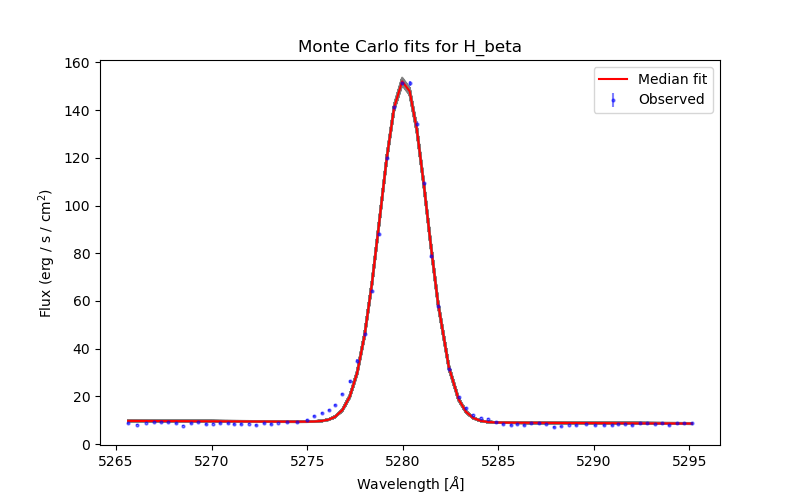

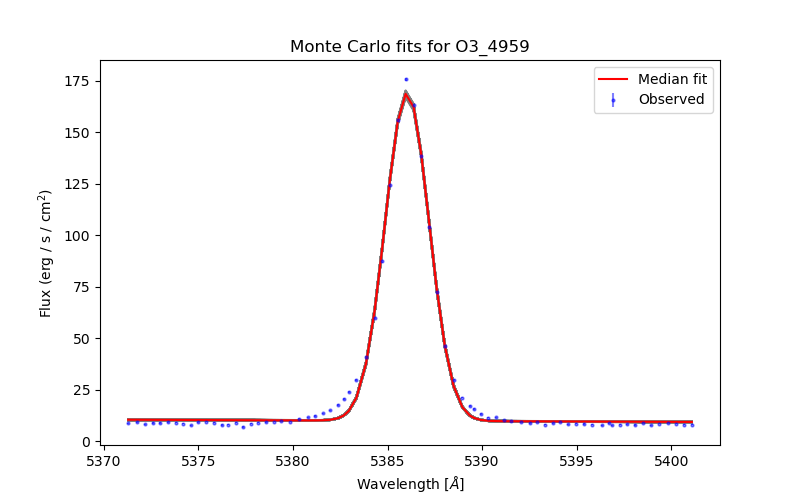

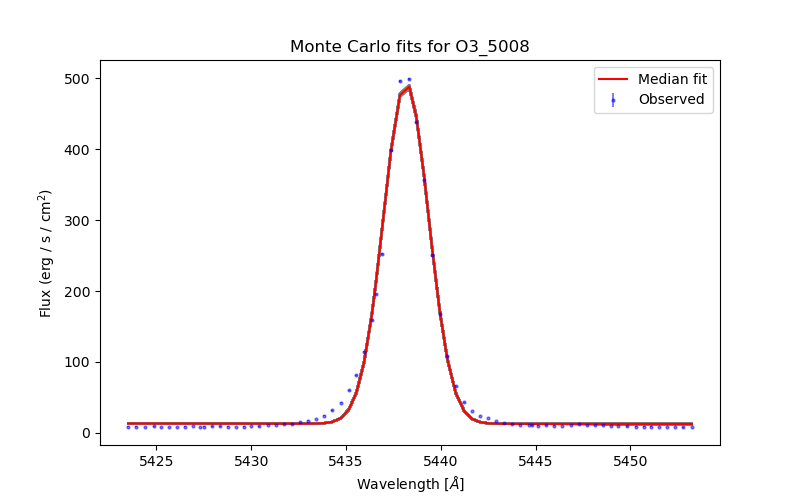

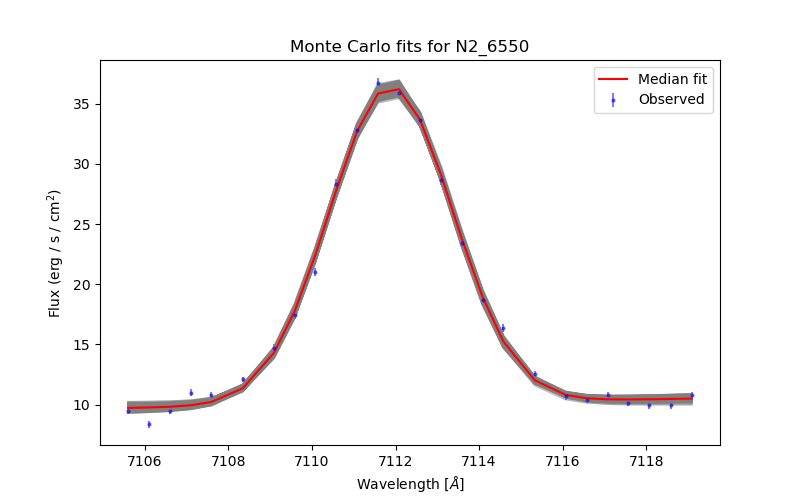

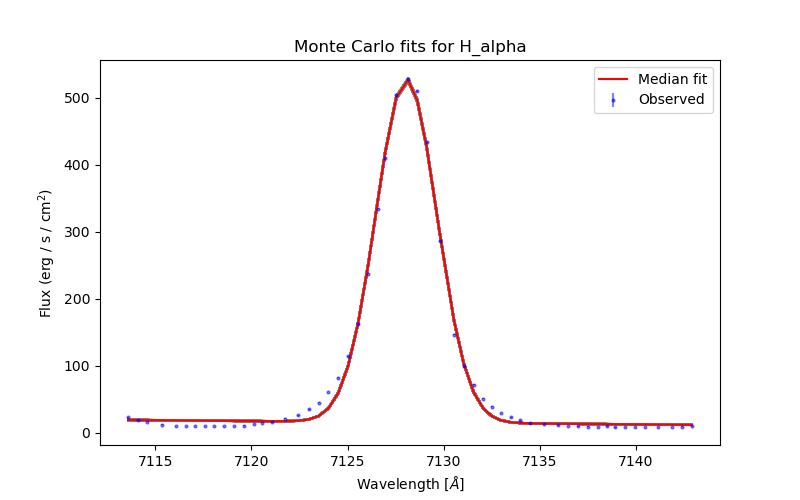

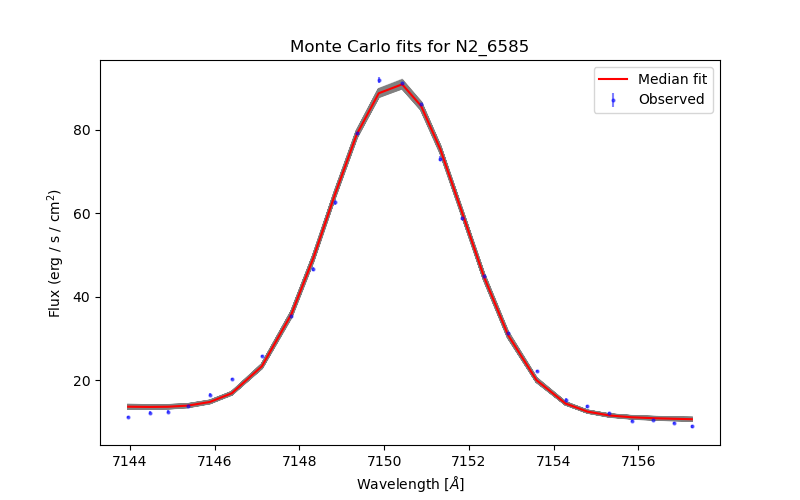

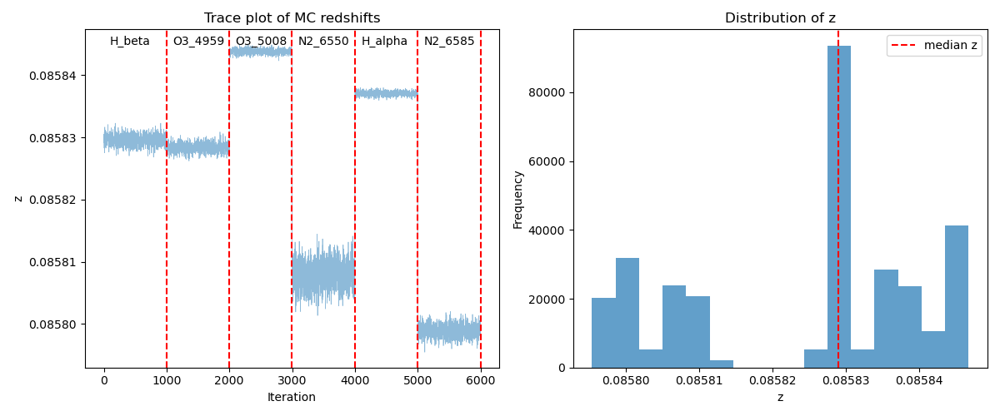

New redshift calculated for no_very_flats,z = 0.0858289015044782
Executed reset_redshift in 44.0620s
New redshift for J0328+0031,z = 0.0858289015044782
Reading data for J0328
Using MW dust corrected data


ValueError: non-broadcastable output operand with shape (12619,) doesn't match the broadcast shape (4,12619)

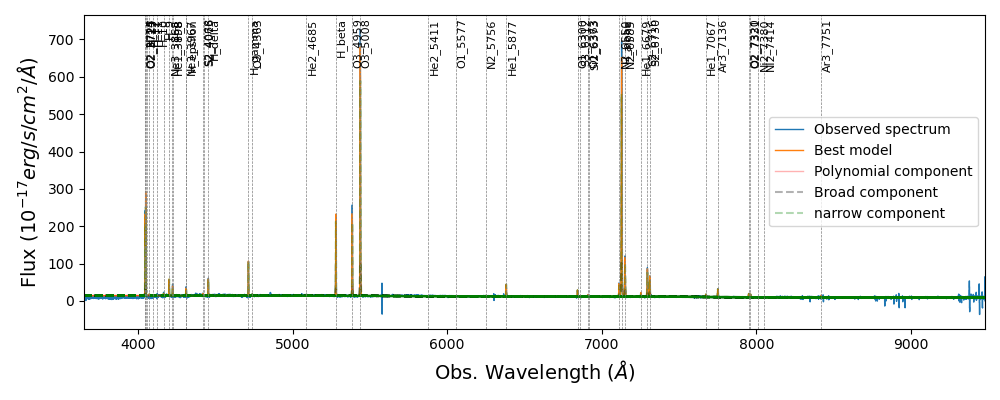

In [ ]:
balmer_absorption_correction(J0328_SPEC)

In [ ]:
# Equivalent width calculation and plotting functions

import astropy.constants as const
from corr import REDSHIFT, SPECTRALDATA
from scipy.optimize import curve_fit
import numpy as np
import matplotlib.pyplot as plt
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import os
import pandas as pd

from GaussianFitting import fitSpectrum

proj_DIR = '/Users/javieratoro/Desktop/thesis/proyecto 2024-2/'
balmer_lines = ['H_gamma', 'H_delta',
                'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12']


def read_data(class_):
    """
    Reads MW duct corrected data if it exist, otherwise reads the
    uncorrected data.
    """
    gal_id = class_.names[0][:5]
    print(f'Reading data for {gal_id}')
    file_path = f'{proj_DIR}dust/{gal_id}/dcorr_{gal_id}.csv'
    if os.path.exists(file_path):
        print("Using MW dust corrected data")
        dcorr = pd.read_csv(file_path)
        arrays = dcorr.to_numpy().T
        wave, flux, sigma = arrays

    else:
        print("Using uncorrected data")
        wave, flux, sigma, _ = class_.datas[0]
    return wave, flux, sigma


def first_sigma_est(class_, data, plot=False):
    """
    Get the velocity dispersion (sigma) of the narrow and/or broad
    Gaussian components from the spectral fitting.

    Add plot=True to visualize the spectral fitting model
    """
    wave, flux, sigma = data

    fit = fitSpectrum(wave, flux, sigma,
                      linelist=class_.linelist_dict,
                      z_init=class_.redshift,
                      weights=1/sigma**2,
                      showPlot=plot,
                      broad=True, nfev=1000)

    sigma_narrow = fit.params['sigma_v_narrow']
    sigma_broad = fit.params['sigma_v_broad']

    return sigma_narrow, sigma_broad


def get_sigma(line, class_, sigmas):
    sigma_narr, sigma_broad = sigmas
    bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
                    'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
                    'S2_6730']
    center = class_.linelist_dict[line] * (1 + class_.redshift)
    if line in bright_lines:
        sigma = (center / const.c.to('km/s').value) * sigma_broad.value
    else:
        sigma = (center / const.c.to('km/s').value) * sigma_narr.value
    return sigma


def mask_nonuse_emission_line(class_, sigmas, line, data):
    """
    Mask the non-use emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - sigmas: A tuple containing the velocity dispersions (sigma) for
                narrow and broad components.
    - line: The emission line to keep (e.g., 'H_alpha').
    - data: A tuple containing the wavelength, flux, and sigma arrays.

    Returns:
    - masked_wave: The wavelength array with non-use emission lines masked.
    - masked_flux: The flux array with non-use emission lines masked.
    """
    # Define the wavelength ranges for masking (example ranges)
    wave, flux, err = data

    # Mask every emission line 3 sigma from center
    cte = (1 + class_.redshift)
    masked_flux = flux.copy()
    masked_sigma = err.copy()

    for label in class_.linelist_dict:
        if label == line:
            continue
        else:
            center = class_.linelist_dict[label] * cte
            sigma = get_sigma(label, class_, sigmas)

            size = 2.5
            mask_below = (wave > center - size*sigma)
            mask_up = (wave < center + size*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            masked_flux[mask_line] = np.nan
            masked_sigma[mask_line] = 0.0

    return wave, masked_flux, masked_sigma


def isolate_emission_line(class_, line, window, datas):
    """
    Isolate the emission line from the spectral data.

    Parameters:
    - class_: The spectral data class.
    - line_center: The central wavelength of the emission line to isolate.
    - window: The width around the line center to consider for
              isolation (in Angstroms).

    Returns:
    - isolated_wave: Wavelength array of the isolated emission line region.
    - isolated_flux: Flux array of the isolated emission line region.
    - isolated_sigma: Sigma array of the isolated emission line region.
    - estimated_redshift: Estimated redshift based on the peak wavelength.
    - peak_wave: Observed wavelength at the peak flux.
    - peak_flux: Peak flux value of the emission line.
    """
    wave, flux, sigma = datas

    # Define the line center
    line_center = class_.linelist_dict[line] * (1 + class_.redshift)

    # Define the range for isolation
    lower_bound = line_center - window
    upper_bound = line_center + window

    # Create a mask to isolate the emission line
    mask = (wave >= lower_bound) & (wave <= upper_bound)

    # Isolate the data
    isolated_wave = wave[mask]
    isolated_flux = flux[mask]
    isolated_sigma = sigma[mask]

    # plt.figure(figsize=(10, 6))
    # plt.step(wave, flux, label='Data', color='black')
    # plt.step(isolated_wave, isolated_flux, label='Isolated Line',
    #          color='red')
    # plt.xlabel('Wavelength (Å)')
    # plt.ylabel('Flux')
    # plt.title(f'Isolated Emission Line: {line}')
    # plt.legend()
    # plt.show()
    return (isolated_wave, isolated_flux, isolated_sigma)


def model(class_, label, datas, sigmas):
    """
    Create the model for the absoption with a negative gaussian
    and a 1-degree polynomial
    """
    wave, flux_, err = datas

    # mask emission line
    lam = class_.linelist_dict[label]
    center = lam * (1 + class_.redshift)

    sigma = get_sigma(label, class_, sigmas)

    size = 2.5
    mask_below = (wave > center - size*sigma)
    mask_up = (wave < center + size*sigma)
    mask_line = mask_below & mask_up

    # Every line to nan
    flux = flux_.copy()
    flux[mask_line] = np.nan

    # Gaussian model for balmer abs
    gaussian = GaussianModel(prefix=label+'_')

    # Create a polynomial model for the continuum
    polydeg = 1
    polynomial = PolynomialModel(degree=polydeg)

    comp_mult = gaussian + polynomial
    pars_mult = comp_mult.make_params()

    pars_mult.add(name='z', value=class_.redshift,
                  vary=False)

    pars_mult.add(name='sigma_v', value=550, vary=False)
    # velocity dispersion at 450 km/s

    # Loop through emission lines to define parameters
    # for narrow and broad

    for param in ['center', 'amplitude', 'sigma']:
        narrow_key = f'{label}_{param}'
        if param == 'center':
            value = lam
            vary_ = False
            min_ = None
            max_ = None
            expr = f'{lam:6.2f}*(1+z)'
        elif param == 'amplitude':
            value = -80
            vary_ = True
            min_ = -100
            max_ = 0
            expr = None
        elif param == 'sigma':
            value = None
            vary_ = False
            min_ = None
            max_ = None
            expr = f'(sigma_v/3e5)*{label}_center'
        pars_mult[narrow_key] = Parameter(name=narrow_key,
                                          value=value,
                                          vary=vary_, expr=expr,
                                          min=min_, max=max_)
    for i in range(polydeg+1):
        pars_mult[f'c{i:1.0f}'].set(value=0)

    out_comp_mult = comp_mult.fit(flux, pars_mult,
                                  x=wave, weights=1/err**2,
                                  nan_policy='omit',
                                  max_nfev=1000)

    return out_comp_mult


def model_mcmc(class_, label, stamp):

    wave, flux, f_err = stamp[0], stamp[1], stamp[2]
    z, w_center = class_.redshift, class_.linelist_dict[label]

    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5

    step = 0.5*sigma
    mask = np.isfinite(flux) & ((wave < mu - step) | (wave > mu + step))

    def absorption(w, A, m, n):
        output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n
        return output

    #  Test one fit
    p0 = 5.0, 0.0, 5.0
    popt, pcov = curve_fit(absorption, wave[mask], flux[mask], p0)

    #
    # Do a MC
    #

    N_mc = 100
    f_mc = np.random.normal(loc=flux[mask],
                            scale=f_err[mask], size=(N_mc, mask.sum()))
    popt_mc = np.zeros((N_mc, 3))
    for i in range(N_mc):
        popt, pcov = curve_fit(absorption, wave[mask], f_mc[i], p0)
        popt_mc[i] = popt

    A_mean = np.median(popt_mc[:, 0])
    A_err = np.std(popt_mc[:, 0])

    EW_mc = (
        (popt_mc[:, 0] * np.sqrt(2 * np.pi * sigma**2))
        / (popt_mc[:, 1] * w_center * (1 + z) + popt_mc[:, 2])
        / (1 + z)
    )

    return A_mean, A_err, np.median(EW_mc), np.std(EW_mc), mask, popt_mc


def neg_gauss(class_, line, w, A):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    output = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    return output


def absorption_func(class_, line, w, A, m, n):
    gauss = neg_gauss(class_, line, w, A)
    output = gauss + m * w + n
    return output


def neg_gauss_EW(class_, line, w, emcee, EW_, num):
    w_center = class_.linelist_dict[line]
    z = class_.redshift
    mu = w_center * (1 + z)
    sigma = w_center * (1 + z) * 550 / 3e5
    popt_mc = emcee[5]

    m = popt_mc[num, 1]
    n = popt_mc[num, 2]

    continuum_at_mu = m * mu + n
    A = (EW_ * (1 + class_.redshift)
        * continuum_at_mu
        / (np.sqrt(2*np.pi) * sigma) )
    output1 = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2))
    output2 = -A * np.exp(-((mu - w) ** 2) / (2 * sigma**2)) + m * w + n 
    return output1, output2


def save_corrected_data(class_, data, new_flux):
    """
    Saves the corrected data to a CSV file,
    creating the directory if needed.
    """
    # Define the directory and file path
    save_dir = f'{proj_DIR}bal_abs'
    save_path = f'{save_dir}/bcorr_{class_.gal_id}_new.csv'

    # Create the directory if it doesn't exist
    os.makedirs(save_dir, exist_ok=True)

    # Create and save DataFrame
    df = pd.DataFrame({'wave': data[0], 'flux': new_flux,
                       'sigma': data[2]})
    df.to_csv(save_path, index=False)

    print(f'Saved Balmer Absorption corrected data to: {save_path}')


def balmer_absorption_correction(info):
    """
    Applies the Balmer absorption correction to the flux data using the
    MCMC results from the model fitting.

    Parameters:
    - class_: The spectral data class.
    - data: The input data.
    - sigmas: The sigma values.
    - emcee: The MCMC results.

    Returns:
    - A message indicating the correction has been applied and results saved.
    """
    # Implementation for applying Balmer absorption correction
    class_ = SPECTRALDATA(info)
    _ = REDSHIFT(class_)
    balmer_lines = ['H_gamma', 'H_delta',
                    'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12', 'H_13', 'H_14']

    windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
    fits, comps, stamps, emcee = [], [], [], []
    EW_lines = []
    data = read_data(class_)
    flux = data[1]
    stellar_abs = np.zeros(flux.shape)
    corrected_flux = flux.copy()
    sigmas = first_sigma_est(class_, data, plot=True)
    for line, window in zip(balmer_lines, windows):
        masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                                [data[0], corrected_flux,
                                                 data[2]])
        isolated_data = isolate_emission_line(class_, line, window=window,
                                              datas=masked_data)
        stamps.append(isolated_data)

        fit = model(class_, line, isolated_data, sigmas)
        fits.append(fit)
        comp = fit.eval_components(x=isolated_data[0])
        comps.append(comp)

        model_ = model_mcmc(class_, line, isolated_data)
        emcee.append(model_)

    for i, _ in enumerate(balmer_lines):
        EW_line = emcee[i][2]
        EW_lines.append(EW_line)

    EW_med = np.median(EW_lines[:5])

    for i, line in enumerate(balmer_lines):
        gaus_ew, fit2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
        gaus_2, fit3  = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
        if np.min(gaus_2) < np.min(gaus_ew):
            param_key = f"{line}_height"
            A_val = fits[i].params[param_key].value
            corrected_flux -= gaus_2
            stellar_abs += fit3
        else:
            corrected_flux -= gaus_ew
            stellar_abs += fit2

    absorption_beta, stellar_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    absorption_alpha, stellar_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    absorption = absorption_alpha + absorption_beta
    stellar = stellar_alpha + stellar_beta

    corrected_flux -= absorption
    stellar_abs += stellar

    plt.figure(figsize=(14, 4*len(balmer_lines)))

    for i, line in enumerate(balmer_lines[:5]):
        param_key = f"{line}_height"

        A_val = -fits[i].params[param_key].value
        A_err = fits[i].params[param_key].stderr

        wave = stamps[i][0]
        flux = stamps[i][1]
        mask = emcee[i][4]
        popt_mc = emcee[i][5]

        wave_to_plot = np.linspace(np.min(stamps[i][0]),
                                   np.max(stamps[i][0]),
                                   100)

        # Left panel: main fit
        plt.subplot(len(balmer_lines[:5]), 2, 2*i + 1)

        plt.step(wave, flux, label='Data', color='black')

        plt.plot(
            wave,
            comps[i][line + '_'] + comps[i]['polynomial'],
            label='Gaussian Fit',
            color='red'
        )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')


        if A_err is None:
            A_text = f"A: {A_val:.2f} ± N/A"
        else:
            A_text = f"A: {A_val:.2f} ± {A_err:.2f}"

        plt.title(f"Absorption Line: {line}\n{A_text}")
        plt.legend()
        plt.ylim(np.min(comps[i][line + '_'] + comps[i]['polynomial']) - 2,
                 np.max(comps[i][line + '_'] + comps[i]['polynomial']) + 2)

        # Right panel: MC fits
        plt.subplot(len(balmer_lines), 2, 2*i + 2)

        plt.plot(wave[mask], flux[mask], "rx", label='Masked data')

        for j in range(100):
            plt.plot(
                wave_to_plot,
                absorption_func(class_, line, wave_to_plot, *popt_mc[j]),
                "k-",
                alpha=0.05
            )

        plt.xlabel('Wavelength (Å)')
        plt.ylabel('Flux')
        plt.title(
            f"A = {emcee[i][0]:.2f} ± {emcee[i][1]:.2f}\n"
            f"EW = {emcee[i][2]:.2f} ± {emcee[i][3]:.2f} Å"
        )

        plt.legend()

    plt.tight_layout()
    # plt.savefig(f'{proj_DIR}bal_abs/balmer_fits_{class_.gal_id}_.pdf',
    #             format='pdf')
    plt.show()

    # absorption_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
    # absorption_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
    # absorption = absorption_alpha + absorption_beta

    # corrected_flux += absorption

    # save_corrected_data(class_, data, corrected_flux)

    return f'Balmer absorption correction applied and results saved for {class_.gal_id}.'


# =============================================================================
#
# Program
#
# =============================================================================

# get EW estimated from other hydrogen lunes, with fixed sigma
# with that you can create the gaussian fro h alpha and h beta
# correct the spectra
# make some estimations about the change in fluxes for h alpha and h beta
if __name__ == '__main__':

    J0328_SPEC = {
                 'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/35-J0328/',
                 'FILES': ['no_very_flats/J0328_NO_VERY_FLATS_tellcorr.fits'],
                 'redshift': 0.086,
                 'names': ['J0328+0031'],
                 'mass': 9.8
                 }

    J0020_SPECTRA= {
                    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/10-J0020/',
                    'FILES': ['no_very_flats/J0020_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.106,
                    'names':['J0020+0030'],
                    'mass':9.6
    }

    J0203_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/25-J0203/',
    'FILES': ['no_very_flats/J0203_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0203_TWILIGHT_tellcorr.fits'],
     'redshift': 0.156,
     'names':['J0203+0035'],
     'mass':9.96
    }

    J0243_SPECTRA= {
    'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/28-J0243/',
    'FILES': ['no_very_flats/J0243_NO_VERY_FLATS_tellcorr.fits'],# 'twilight/J0243_TWILIGHT_tellcorr.fits'],
     'redshift': 0.134,
     'names':['J0243+0111'],
     'mass':9.7
    }

    J0333_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/36-J0033/',
        'FILES': ['no_very_flats/J0033_NO_VERY_FLATS_tellcorr.fits'], #'twilight/J0033_TWILIGHT_tellcorr.fits'],
        'redshift': 0.194,
        'names':['J0333+0017'],
        'mass':9.9
    }

    J0404_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/38-J0404/',
        'FILES': ['no_very_flats/J0404_NO_VERY_FLATS_tellcorr.fits', 'twilight/J0404_TWILIGHT_tellcorr.fits'],
        'redshift': 0.066,
        'names':['J0404+0538'],
        'mass':10.2
    }

    J2204_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/2-J2204/',
        'FILES': ['no_very_flats/J2204_NO_VERY_tellcorr.fits', 'twilight/J2204_TWILIGHT_tellcorr.fits'],
        'redshift': 0.185,
        'names':['J2204+0058'],
        'mass':10.16
    }

    J2258_SPECTRA= {
                    'DIR': '/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/6-J2258/',
                    'FILES': ['twilight/J2258_TWILIGHT_tellcorr.fits'], #'no_very_flats/J2258_NO_VERY_FLATS_tellcorr.fits'],
                    'redshift': 0.094,
                    'names': ['J2258+0056'],
                    'mass': 9.6
    }

    J2336_SPECTRA= {
        'DIR':'/Users/javieratoro/Desktop/thesis/BAADE_DATA/testing/7-J2336/',
        'FILES': ['no_very_flats/J2336_NO_VERY_BLUE_tellcorr.fits', 'twilight/J2336_TWILIGHT_tellcorr.fits'],
        'redshift':0.17047114835326904,
        'names':['J2336-0042'],
        'mass':9.9
    }
    # balmer_absorption_correction(J0328_SPEC)
    # balmer_absorption_correction(J0020_SPECTRA)
    # balmer_absorption_correction(J0203_SPECTRA)
    # balmer_absorption_correction(J0243_SPECTRA)
    # balmer_absorption_correction(J0333_SPECTRA)
    # balmer_absorption_correction(J0404_SPECTRA)
    # balmer_absorption_correction(J2204_SPECTRA)
    # balmer_absorption_correction(J2258_SPECTRA)
    # balmer_absorption_correction(J2336_SPECTRA)

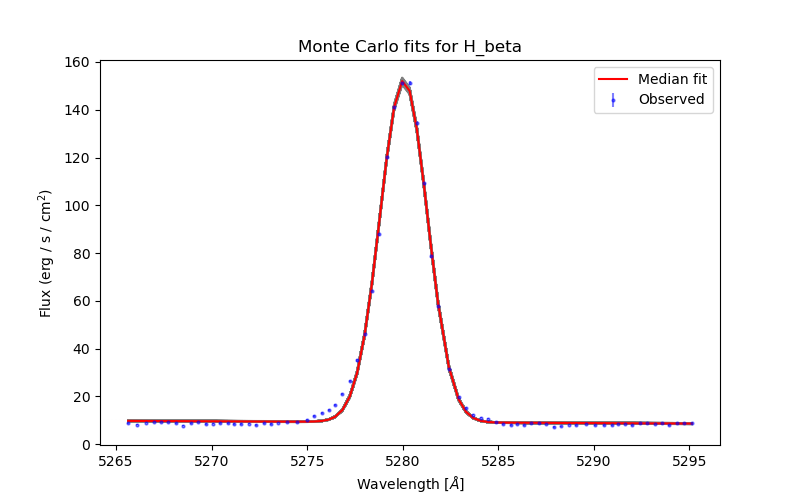

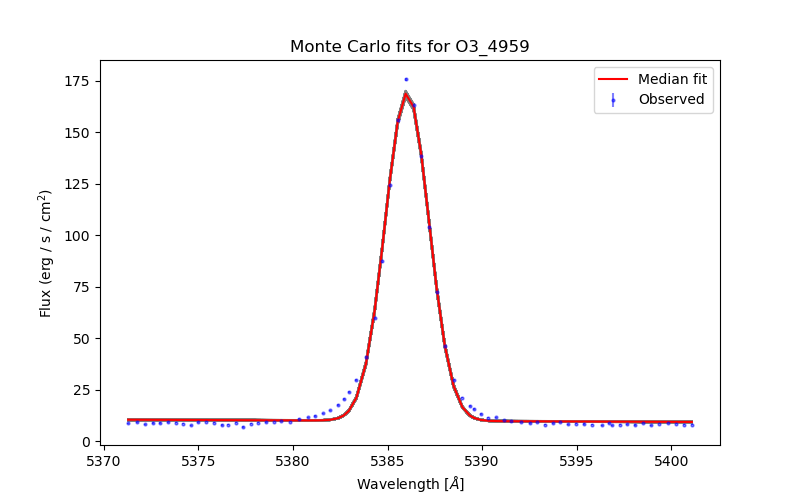

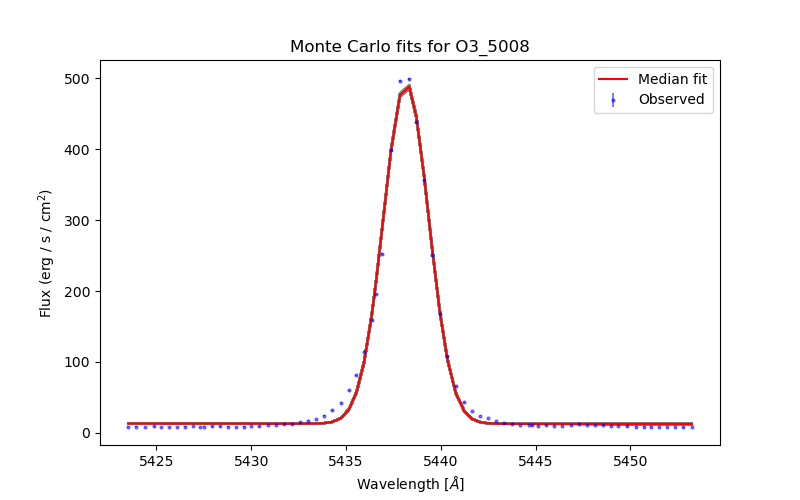

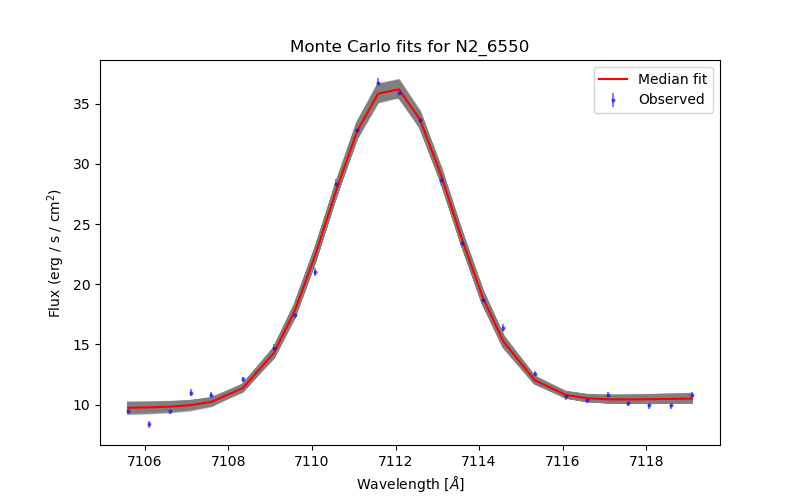

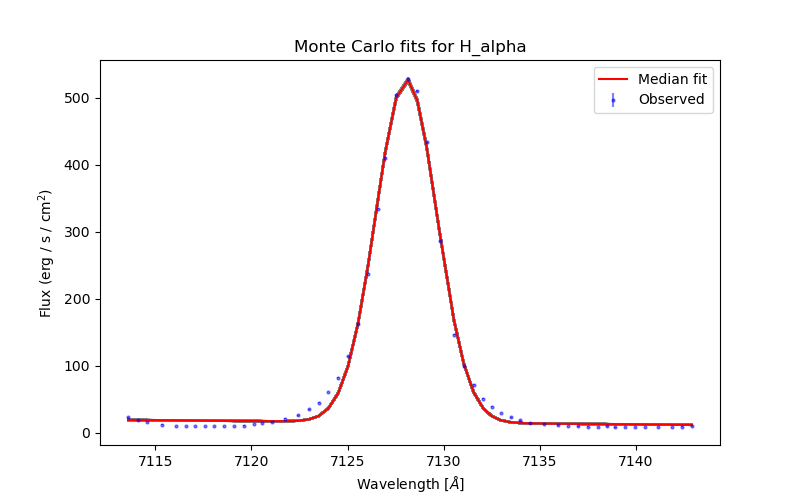

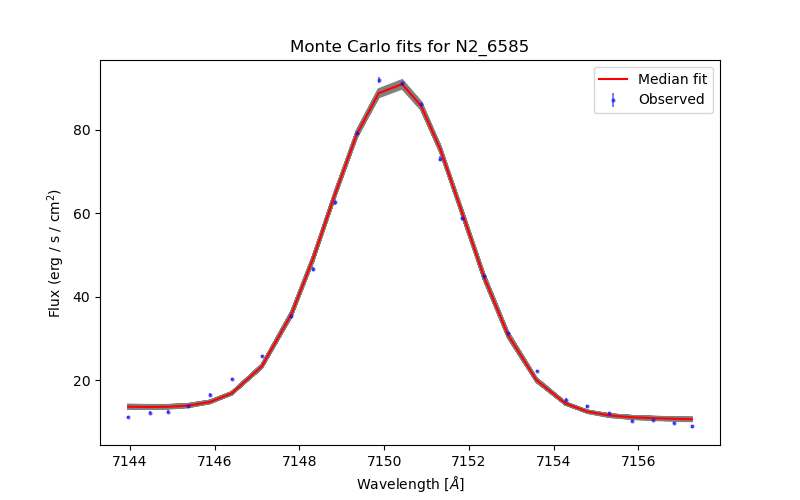

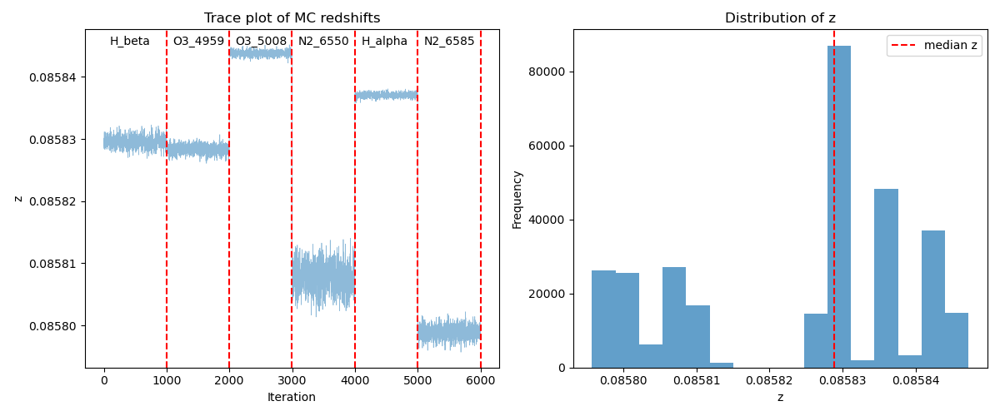

New redshift calculated for no_very_flats,z = 0.08582891625715627
Executed reset_redshift in 40.8035s
New redshift for J0328+0031,z = 0.08582891625715627
Reading data for J0328
Using MW dust corrected data


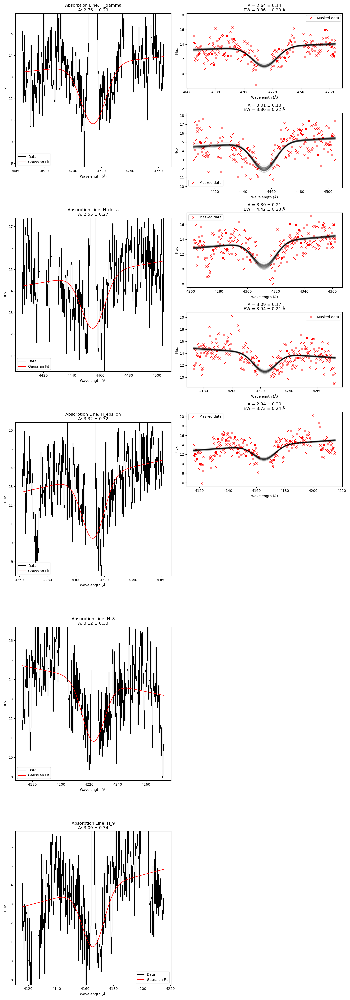

'Balmer absorption correction applied and results saved for J0328.'

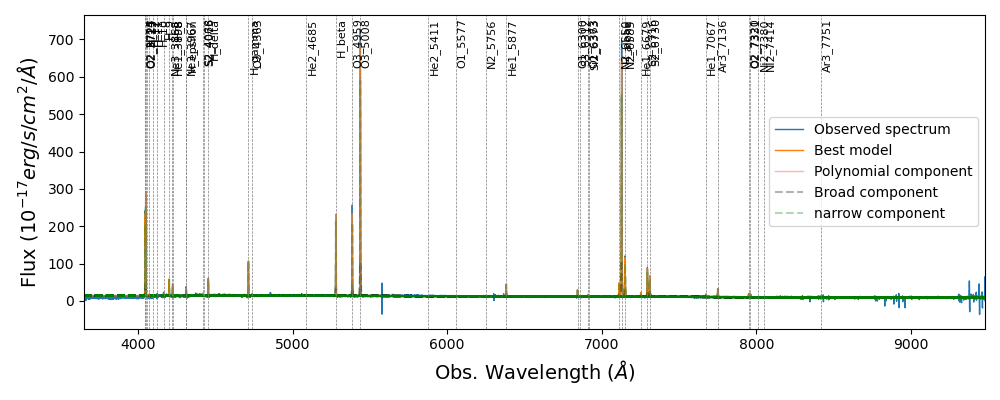

In [ ]:
balmer_absorption_correction(J0328_SPEC)

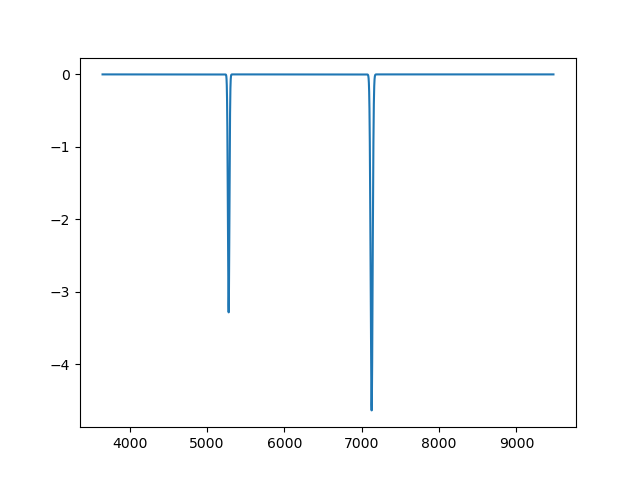

In [ ]:
plt.figure()
plt.plot(data[0], stellar_abs)
plt.show()


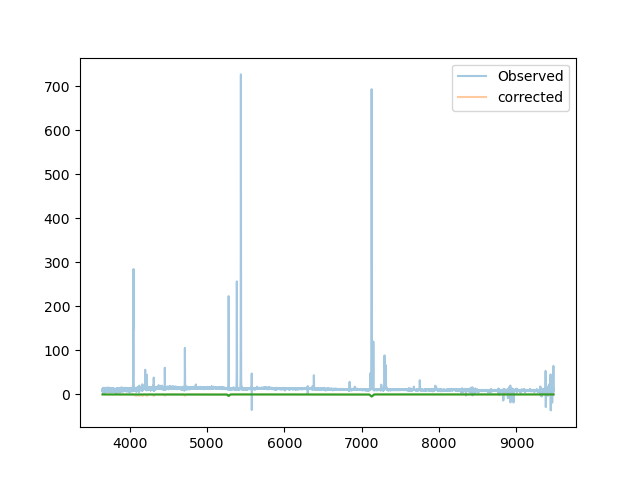

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.plot(data[0], stellar_abs)
plt.legend()
plt.show()

In [ ]:
windows = [50, 50, 50, 50, 50, 40, 40, 15, 40, 40]
fits, comps, stamps, emcee = [], [], [], []
EW_lines = []
flux = data[1]
stellar_abs = np.zeros(flux.shape)
corrected_flux = flux.copy()
for line, window in zip(balmer_lines, windows):
    masked_data = mask_nonuse_emission_line(class_, sigmas, line,
                                            [data[0], corrected_flux,
                                                data[2]])
    isolated_data = isolate_emission_line(class_, line, window=window,
                                            datas=masked_data)
    stamps.append(isolated_data)

    fit = model(class_, line, isolated_data, sigmas)
    fits.append(fit)
    comp = fit.eval_components(x=isolated_data[0])
    comps.append(comp)

    model_ = model_mcmc(class_, line, isolated_data)
    emcee.append(model_)

for i, _ in enumerate(balmer_lines):
    EW_line = emcee[i][2]
    EW_lines.append(EW_line)

EW_med = np.median(EW_lines[:5])

for i, line in enumerate(balmer_lines):
    gaus_ew, fit2 = neg_gauss_EW(class_, line, data[0], emcee[i], EW_med, i)
    gaus_2, fit3  = neg_gauss_EW(class_, line, data[0], emcee[i], EW_lines[i], i)
    if np.min(gaus_2) < np.min(gaus_ew):
        param_key = f"{line}_height"
        A_val = fits[i].params[param_key].value
        corrected_flux -= gaus_2
        stellar_abs += fit3
    else:
        corrected_flux -= gaus_ew
        stellar_abs += fit2

absorption_beta, stellar_beta = neg_gauss_EW(class_, 'H_beta', data[0], emcee[0], EW_med, 0)
absorption_alpha, stellar_alpha = neg_gauss_EW(class_, 'H_alpha', data[0], emcee[0], EW_med, 0)
absorption = absorption_alpha + absorption_beta
stellar = stellar_alpha + stellar_beta

corrected_flux -= absorption
stellar_abs += stellar

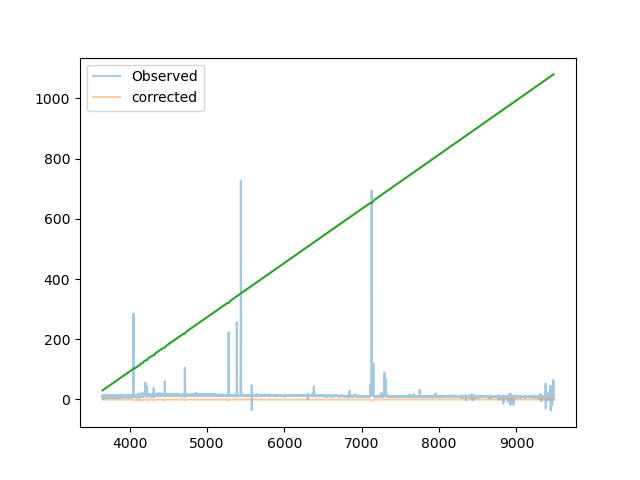

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.plot(data[0], stellar_abs)
plt.legend()
plt.show()

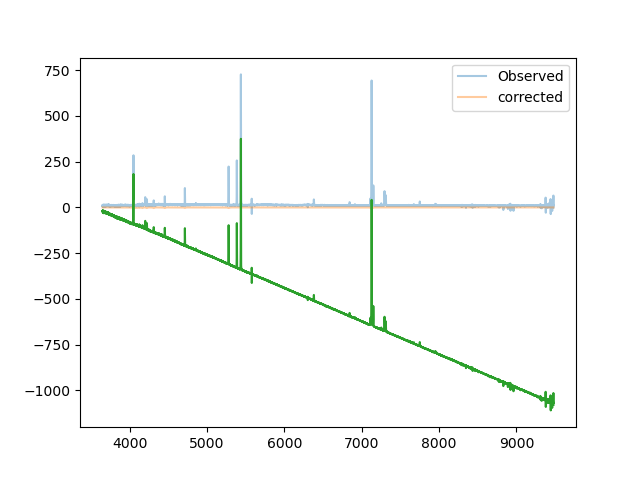

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.plot(data[0], data[1]-stellar_abs)
plt.legend()
plt.show()

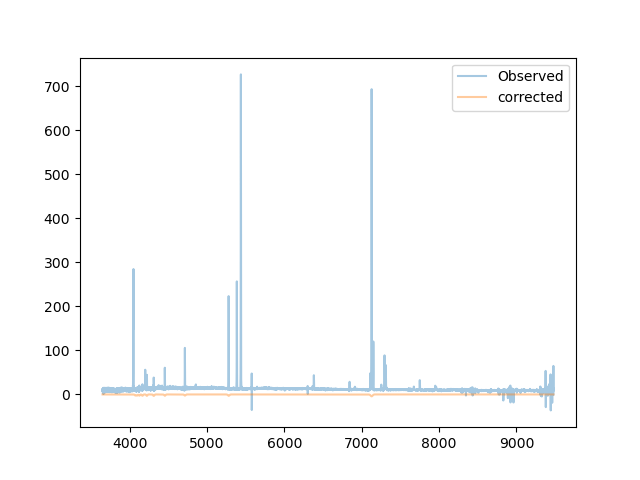

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.legend()
plt.show()

In [ ]:
import os

import astropy.constants as const
import functools
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pyneb as pn

from astropy.io import ascii, fits
from scipy.interpolate import CubicSpline
from GaussianFitting import fitSpectrum
from lmfit import Parameter
from lmfit.models import GaussianModel, PolynomialModel
import time

main_DIR = "/Users/javieratoro/Desktop/thesis/"
proj_DIR = f"{main_DIR}proyecto 2024-2/"
code_DIR = f"{proj_DIR}codes"


def log_method_call(func):
    @functools.wraps(func)
    def wrapper(self, *args, **kwargs):
        start_time = time.time()
        result = func(self, *args, **kwargs)
        end_time = time.time()
        print(f"Executed {func.__name__} in {end_time - start_time:.4f}s")
        return result
    return wrapper


class SPECTRALDATA:
    '''
    Receives a dictionary with:
     - DIR: The directory of the astronomical spectra.
     - FILES: The names of the files for each science data,
     completes the directory to read the file.
     - redshift: First hand estimation of the source redshift.
     - names: The source names.
     - mass: The mass of the source.
     EX:
     dicc = {
                'DIR': '/Users/name/desktop/observations',
                'FILES': ['reduction1.fits', 'reduction2.fits'],
                'redshift': 0.086,
                'names': ['J0328+0031'],
                'mass': 9.8}
    '''
    def __init__(self, spectra):
        """Read spectral data loading and management."""
        self.name_class = 'SPECTRALDATA'
        self.DIR = spectra.get('DIR')
        self.FILES = spectra.get('FILES')
        self.redshift = spectra.get('redshift')
        self.names = spectra.get('names')
        self.mass = spectra.get('mass')
        self.line_list, self.linelist_dict = self.load_line_list()
        self.line_wave_or = self.line_list['vacuum_wave']
        self.line_name = self.line_list['name']
        self.gal_id = self.names[0][:5]
        self.model1IT = None

    em_path = f'{proj_DIR}CSV_files/emission_line1.csv'

    def load_line_list(self, path=em_path):
        """Loads the emission line list from a CSV file."""
        line_list = pd.read_csv(path)
        linelist_table = ascii.read(path)
        linelist_dict = {}
        for line in linelist_table:
            linelist_dict[line['name']] = line['vacuum_wave']
        return line_list, linelist_dict


class REDSHIFT:
    '''
    Receives the SPECTRALDATA class and calculates source's redshift according
    to H_alpha and O[III]5007 emission lines. Updating the new value in the
    SPECTRALDATA class.
    '''
    def __init__(self, spectra):
        self.spectra = spectra
        self.spectra.hdus, self.spectra.datas, self.redshifts = [], [], []

        cte = (1 + self.spectra.redshift)
        self.spectra.lines_waves = self.spectra.line_list['vacuum_wave']*cte

        self.zs = []
        for i in self.spectra.FILES:
            path = self.spectra.DIR + i
            hdu = fits.open(path)
            self.spectra.hdus.append(hdu)
            mask = (hdu[1].data['wave'] > 3650)
            data = []
            # Read and save the info from the hdu
            data.append(hdu[1].data['wave'][mask])
            data.append(hdu[1].data['flux'][mask])
            data.append(hdu[1].data['sigma'][mask])
            data.append(i.partition("/")[0])  # name of the folder
            self.spectra.datas.append(data)

            self.reset_redshift(data)

        cte = (1 + self.spectra.redshift)
        self.spectra.lines_waves = self.spectra.line_list['vacuum_wave']*cte

        self.spectra.redshift = self.redshifts[0]
        print(f'New redshift for {self.spectra.names[0]},'
              f'z = {self.spectra.redshift}')

    @log_method_call
    def reset_redshift(self, data):
        """
        Function to calculate and set the redshift on the SPECTRALDATA class
        """
        w, flux, sigma, name = data

        lines_ = ['O3_5008', 'H_alpha']
        list_wave_rest = self.spectra.line_wave_or
        list_wave_obs = self.spectra.lines_waves

        zs = [
            np.median(
                (w[mask][np.argmax(flux[mask])] / or_wave) - 1
            ) if mask.any() else np.nan  # Avoid errors if mask is empty
            for line in lines_
            for or_wave, w_obs in zip(
                list_wave_rest[self.spectra.line_name == line].values,
                list_wave_obs[self.spectra.line_name == line].values
            )
            if (mask := (w > w_obs - 150) & (w < w_obs + 150)).any()
        ]

        if zs:  # Ensure zs is not empty before calculating median
            self.spectra.redshift = np.median(zs)

        lines = ['H_beta', "O3_4959", 'O3_5008', 'N2_6550', 'H_alpha',
                 'N2_6585']

        # Get gaussian on both lines
        cte = (1 + self.spectra.redshift)
        wave_rest = np.array([])
        wave_obs = np.array([])

        # Mask unused emission lines

        for label in lines:
            masked_flux = flux.copy()
            for label_ in self.spectra.linelist_dict:
                if label_ in lines:
                    continue
                else:
                    center = self.spectra.linelist_dict[label_] * cte
                    mask_below = (w > center - 4)
                    mask_up = (w < center + 4)
                    mask_line = mask_below & mask_up

                    # Every line to nan
                    masked_flux[mask_line] = np.nan

            self.comps = []
            # Get manual stamp on the emission lines
            center = self.spectra.linelist_dict[label] * cte
            sep = 7 if label in ['N2_6550', 'N2_6585'] else 15
            mask_below = (w > center - sep)
            mask_up = (w < center + sep)
            mask_stamp = mask_below & mask_up

            stamp = masked_flux[mask_stamp]
            wave_stamp = w[mask_stamp]
            sigma_stamp = sigma[mask_stamp]

            # Gaussian model for balmer abs
            gaussian = GaussianModel(prefix=label+'_')

            # Create a polynomial model for the continuum
            polydeg = 1
            polynomial = PolynomialModel(degree=polydeg)

            comp_mult = gaussian + polynomial
            pars_mult = comp_mult.make_params()

            min_val = 10
            pars_mult.add(name='sigma_v', value=50, min=min_val,
                          max=800)

            pars_mult.add(name='z', value=self.spectra.redshift,
                          vary=True)

            # Loop through emission lines to define parameters
            # for narrow and broad
            lam = self.spectra.linelist_dict[label]
            for param in ['center', 'amplitude', 'sigma']:
                narrow_key = f'{label}_{param}'
                if param == 'center':
                    value = lam
                    vary_ = True
                    min_ = None
                    max_ = None
                    expr = f'{lam:6.2f}*(1+z)'
                elif param == 'amplitude':
                    value = 5e3
                    vary_ = True
                    min_ = 0
                    max_ = None
                    expr = None
                elif param == 'sigma':
                    vary_ = True
                    min_ = None
                    max_ = None
                    expr = f'(sigma_v/3e5)*{label}_center'
                pars_mult[narrow_key] = Parameter(name=narrow_key,
                                                  value=value,
                                                  vary=vary_, expr=expr,
                                                  min=min_, max=max_)
            for i in range(polydeg+1):
                pars_mult[f'c{i:1.0f}'].set(value=0)
            for i in range(1000):
                wave_rest = np.append(wave_rest, lam)
                yoff = stamp + np.random.randn(len(stamp)) * sigma_stamp
                out_comp_mult = comp_mult.fit(yoff, pars_mult,
                                              x=wave_stamp,
                                              nan_policy='omit',
                                              max_nfev=1000)

                self.comps.append(out_comp_mult)
                wave_obs = np.append(wave_obs,
                                     out_comp_mult.params[f'{label}_center'])
            plt.figure(figsize=(8, 5))
            plt.errorbar(wave_stamp, stamp, yerr=sigma_stamp, fmt='o',
                         color='blue', ms=2, alpha=0.5, label="Observed")

            # Overplot all MC fits
            for fit in self.comps:
                plt.plot(wave_stamp, fit.best_fit,
                         color="gray", alpha=0.5)

            # Median fit
            all_fits = np.array([fit.best_fit for fit in self.comps])
            median_fit = np.median(all_fits, axis=0)
            plt.plot(wave_stamp, median_fit, color="red", label="Median fit")

            plt.xlabel(r"Wavelength [$\AA$]")
            plt.ylabel(r'Flux (erg / s / cm$^{2}$)')
            plt.title(f"Monte Carlo fits for {label}")
            plt.legend()
            plt.show()
        self.z_chain = wave_obs / wave_rest - 1
        self.redshifts.append(np.median(self.z_chain))

        """Quick diagnostics of MC redshift distribution."""
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))
        q25, q75 = np.percentile(self.z_chain, [25, 75])
        iqr = q75 - q25
        h_fd = 2 * iqr / (len(self.z_chain) ** (1/3))

        # Trace plot
        axs[0].plot(self.z_chain, alpha=0.5, lw=0.5)
        for i, label in zip([999, 1999, 2999, 3999, 4999, 5999], lines):
            axs[0].axvline(i, color="red", ls="--")
            axs[0].text(i - 900, np.max(self.z_chain), label)
        axs[0].set_xlabel("Iteration")
        axs[0].set_ylabel("z")
        axs[0].set_title("Trace plot of MC redshifts")

        # Histogram
        axs[1].hist(self.z_chain,
                    bins=np.arange(self.z_chain.min(),
                                   self.z_chain.max() + h_fd, h_fd),
                    density=True, alpha=0.7)
        axs[1].axvline(np.median(self.z_chain), color="red", ls="--",
                       label="median z")
        axs[1].set_xlabel("z")
        axs[1].set_ylabel("Frequency")
        axs[1].set_title("Distribution of z")
        axs[1].legend()

        plt.tight_layout()
        plt.show()

        print(f'New redshift calculated for {name},'
              f'z = {np.median(self.z_chain)}')


# class MW_DUST_CORR:
#     """
#     Receives the SPECTRALDATA class, a boolean according if the Hb
#     normalized curve is used, and a boolean for plotting the correction;
#     and returns the dust-corrected spectra using PyNeb.
#     Uses the MW extinction curve from CCM89.

#     The spectra MUST be in rest-frame wavelength.
#     """

#     def __init__(self, spectra, rel_Hb=False, plot=True):
#         self.Hb = rel_Hb
#         self.plot = plot
#         self.spectra = spectra
#         self.gal_id = self.spectra.gal_id

#         # Unpack spectrum data
#         self.wl, self.fl, self.err, _ = self.spectra.datas[0]
#         self.MW_dust_corr()

#     @log_method_call
#     def MW_dust_corr(self):
#         """
#         Run the Milky Way dust correction and save the corrected data and
#         the figures if asked
#         """
#         # Read extinction data and apply correction
#         self.read_extinction()

#         print(f'Performing dust correction for {self.gal_id}')

#         # Retrieve E_BV value safely
#         where = (self.extinction['objname'] == self.gal_id),
#         E_BV_table = float(self.extinction.loc[where, 'E_B_V_SandF'].iloc[0])
#         self.IRSA_E_BV = E_BV_table

#         # Apply extinction correction
#         rc = pn.RedCorr(E_BV=E_BV_table, R_V=3.1, law='CCM89')
#         corr = rc.getCorrHb(self.wl) if self.Hb else rc.getCorr(self.wl)

#         dcorr_fl = self.fl * corr
#         dcorr_err = self.err * corr
#         msg = 'Using Hb normalized curve.' if self.Hb else 'Using total curve.'
#         print(f"Extinction correction done! {msg}")

#         # Plot corrected spectra
#         if self.plot:
#             self.plot_spectra(dcorr_fl, E_BV_table)

#         IMAGES(self.spectra, [(self.wl, dcorr_fl)], ['MW Dust corrected'],
#                f'{proj_DIR}dust/{self.gal_id}', f'MWcorr_{self.gal_id}')

#         # Save corrected data
#         self.save_corrected_data(dcorr_fl, dcorr_err)

#     def read_extinction(self):
#         """Reads extinction table and applies dust correction."""
#         ext_file = f'{proj_DIR}CSV_files/extinction.tbl'
#         self.extinction = pd.read_table(ext_file, comment='#', sep=r'\s+')

#         # Clean column names
#         self.extinction.rename(columns=lambda x: x[1:], inplace=True)
#         self.extinction.drop(index=[0, 1], inplace=True)

#         # Get galaxy ID and check if it exists in extinction table

#         if self.gal_id not in self.extinction['objname'].values:
#             raise ValueError(f"Galaxy ID {self.gal_id} not found in table.")

#     def plot_spectra(self, dcorr_fl, E_BV_table):
#         """Plots the observed vs dust-corrected spectrum."""
#         fig, ax = plt.subplots(figsize=(10, 3))

#         ax.plot(self.wl, self.fl, color='red', lw=0.5, label='Observed flux')
#         ax.plot(self.wl, dcorr_fl, color='blue', alpha=0.8, lw=0.5,
#                 label='Dust corrected')

#         ax.set_xlabel(r'$\lambda$ (Angstrom)', fontsize=15)
#         ax.set_ylabel(r'Flux (erg / s / cm$^{2}$)', fontsize=15)
#         ax.set_title(f"Object: {self.gal_id}, "
#                      f"z = {np.round(self.spectra.redshift, 2)}, "
#                      f"E$_{{B - V}}$ = {E_BV_table}")
#         ax.legend()
#         ax.minorticks_on()
#         ax.tick_params(which='major', length=10, width=1,
#                        direction='in')
#         ax.tick_params(which='minor', length=5, width=1,
#                        direction='in')
#         ax.xaxis.set_ticks_position('both')
#         ax.yaxis.set_ticks_position('both')
#         plt.show()
#         save_dir = f'{proj_DIR}dust/{self.gal_id}'
#         os.makedirs(save_dir, exist_ok=True)
#         save_path = f'{save_dir}/dcorr_{self.gal_id}.pdf'
#         fig.savefig(save_path, bbox_inches='tight')
#         print(f'Saved figure at: {save_path}')

#     def save_corrected_data(self, dcorr_fl, dcorr_err):
#         """Saves the corrected data to a CSV file."""
#         save_dir = f'{proj_DIR}dust/{self.gal_id}'
#         os.makedirs(save_dir, exist_ok=True)
#         save_path = f'{save_dir}/dcorr_{self.gal_id}.csv'
#         df = pd.DataFrame({'wave': self.wl, 'flux': dcorr_fl,
#                            'sigma': dcorr_err})
#         df.to_csv(save_path, index=False)
#         print(f'Saved MW dust corrected data to: {save_path}')


# class BALMER_ABS:
#     """
#     Class to estimate and correct the Balmer absoprtion on a galaxy spectra.


#     Receives the SPECTRALDATA class and a boolean for plotting the correction;
#     and save the balmer-corrected spectra using a build-in model.

#     """

#     def __init__(self, spectra, showplot=False, verbose=False):
#         self.spectra = spectra
#         self.gal_id = self.spectra.names[0][:5]
#         # Set Balmer lines names
#         self.balmer_lines = ['H_gamma', 'H_delta',
#                              'H_epsilon', 'H_8', 'H_9', 'H_10', 'H_11', 'H_12',
#                              'H_13', 'H_14']

#         # Read MW dust corrected data if it exist
#         self.read_data()
#         self.bal_abs_corr(plot=showplot)

#     @log_method_call
#     def bal_abs_corr(self, plot=False):
#         print(f'Performing Balmer absorption correction for {self.gal_id}')

#         # Get sigma from first model
#         sigmas = self.first_sigma_est()

#         # Get stamps masked and unmasked
#         self.get_stamp(sigmas)

#         # Get model for each emission line
#         self.model_absorption(self.stamps)

#         # Apply balmer absorption correction
#         new_flux = self.correct_data(self.stamps, self.comps, plot=plot)

#         # Save data
#         self.save_corrected_data(new_flux)

#         print("Balmer absorption correction done!")

#     def read_data(self):
#         """
#         Reads MW duct corrected data if it exist, otherwise reads the
#         uncorrected data.
#         """
#         print(f'Reading data for {self.gal_id}')
#         file_path = f'{proj_DIR}dust/{self.gal_id}/dcorr_{self.gal_id}.csv'
#         if os.path.exists(file_path):
#             print("Using MW dust corrected data")
#             dcorr = pd.read_csv(file_path)
#             arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
#             self.wave, self.flux, self.sigma = arrays

#         else:
#             print("Using uncorrected data")
#             self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

#     def first_sigma_est(self, plot=False):
#         """
#         Get the velocity dispersion (sigma) of the narrow and/or broad
#         Gaussian components from the spectral fitting.

#         Add plot=True to visualize the spectral fitting model
#         """
#         if self.spectra.model1IT is None:
#             fit = fitSpectrum(self.wave, self.flux, self.sigma,
#                               linelist=self.spectra.linelist_dict,
#                               z_init=self.spectra.redshift,
#                               weights=1/self.sigma**2,
#                               showPlot=plot,
#                               broad=True, nfev=1000)
#             self.spectra.model1IT = fit
#         else:
#             fit = self.spectra.model1IT

#         sigma_narrow = fit.params['sigma_v_narrow']
#         sigma_broad = fit.params['sigma_v_broad']

#         return [sigma_narrow, sigma_broad]

#     def get_stamp(self, sigmas):
#         """
#         Create stamps for every emission line 25*sigma from center,
#         masking the emission lines for future modelling.
#         """
#         bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta', 'H_gamma',
#                         'O3_5008', 'O3_4959', 'N2_6550', 'N2_6585', 'S2_6716',
#                         'S2_6730']
#         self.masked_flux = self.flux.copy()
#         self.stamps = []

#         [sigma_narr, sigma_broad] = sigmas

#         def get_sigma(label):
#             if label in bright_lines:
#                 sigma = (center / const.c.to('km/s').value) * sigma_broad.value
#             else:
#                 sigma = (center / const.c.to('km/s').value) * sigma_narr.value
#             return sigma

#         # Mask every emission line 3 sigma from center
#         cte = (1 + self.spectra.redshift)
#         for label in self.spectra.linelist_dict:
#             center = self.spectra.linelist_dict[label] * cte
#             sigma = get_sigma(label)

#             size = 4.0
#             mask_below = (self.wave > center - size*sigma)
#             mask_up = (self.wave < center + size*sigma)
#             mask_line = mask_below & mask_up

#             # Every line to nan
#             self.masked_flux[mask_line] = np.nan

#         # Create the stamp 25 sigma from center
#         for label in self.balmer_lines:
#             center = self.spectra.linelist_dict[label] * cte
#             sigma = get_sigma(label)
#             sep = 20 if label in self.balmer_lines[6:] else 50

#             mask_below = (self.wave > center - sep*sigma)
#             mask_up = (self.wave < center + sep*sigma)
#             mask_stamp = mask_below & mask_up

#             masked_stamp = self.masked_flux[mask_stamp]
#             stamp = self.flux[mask_stamp]
#             masked_wave = self.wave[mask_stamp]

#             self.stamps.append([masked_wave, stamp, masked_stamp])
#         return self.stamps

#     def model_absorption(self, stamps):
#         """
#         Create the model for the absoption with a negative gaussian
#         and a 1-degree polynomial
#         """
#         self.comps = []
#         for label, stamp_ in zip(self.balmer_lines, stamps):
#             masked_wave, _, masked_stamp = stamp_

#             # Gaussian model for balmer abs
#             gaussian = GaussianModel(prefix=label+'_')

#             # Create a polynomial model for the continuum
#             polydeg = 1
#             polynomial = PolynomialModel(degree=polydeg)

#             comp_mult = gaussian + polynomial
#             pars_mult = comp_mult.make_params()

#             pars_mult.add(name='z', value=self.spectra.redshift,
#                           vary=False)

#             pars_mult.add(name='sigma_v', value=300)

#             # Loop through emission lines to define parameters
#             # for narrow and broad

#             lam = self.spectra.linelist_dict[label]
#             center = lam * (1 + self.spectra.redshift)
#             min_am = -100 if label in self.balmer_lines[:7] else -40

#             for param in ['center', 'amplitude', 'sigma']:
#                 narrow_key = f'{label}_{param}'
#                 if param == 'center':
#                     value = lam
#                     vary_ = False
#                     min_ = None
#                     max_ = None
#                     expr = f'{lam:6.2f}*(1+z)'
#                 elif param == 'amplitude':
#                     value = -30
#                     vary_ = True
#                     min_ = min_am
#                     max_ = 0
#                     expr = None
#                 elif param == 'sigma':
#                     value = (450 * center / const.c.to('km/s')).value
#                     vary_ = True
#                     min_ = (200 * center / const.c.to('km/s')).value
#                     max_ = (700 * center / const.c.to('km/s')).value
#                     expr = f'(sigma_v/3e5)*{label}_center'
#                 pars_mult[narrow_key] = Parameter(name=narrow_key,
#                                                   value=value,
#                                                   vary=vary_, expr=expr,
#                                                   min=min_, max=max_)
#             for i in range(polydeg+1):
#                 pars_mult[f'c{i:1.0f}'].set(value=0)

#             out_comp_mult = comp_mult.fit(masked_stamp, pars_mult,
#                                           x=masked_wave,
#                                           nan_policy='omit',
#                                           max_nfev=1000)

#             self.comps.append(out_comp_mult)
#         return self.comps

#     def correct_data(self, stamps, comps, plot=False):
#         """
#         Compute the balmer correction and plot the correction if indicated
#         """
#         new_flux = self.flux.copy()
#         wave = self.wave.copy()
#         for stamp_, comp, label in zip(stamps, comps, self.balmer_lines):
#             mask_wave, stamp, masked_stamp = stamp_
#             mask = (wave >= np.min(mask_wave)) & (wave <= np.max(mask_wave))
#             model_flux = comp.eval_components(x=mask_wave)
#             balmer_abs = model_flux[f'{label}_']
#             new_flux[mask] -= balmer_abs

#             if plot:
#                 _, axs = plt.subplots(1, 3, figsize=(14, 4))
#                 axs[0].plot(mask_wave, stamp, lw=1, drawstyle='steps-mid',
#                             alpha=0.5)
#                 axs[0].plot(mask_wave,
#                             model_flux[f'{label}_'] + model_flux['polynomial'],
#                             lw=1, drawstyle='steps-mid',
#                             label='Balmer abs model')
#                 axs[0].set_title(f'{label} balmer absorption')
#                 axs[0].set_xlabel(r'Wavelength $\AA$')
#                 axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
#                 axs[0].set_ylim(np.mean(model_flux['polynomial'])-10,
#                                 np.mean(model_flux['polynomial'])+10)
#                 axs[0].legend()
#                 axs[1].plot(mask_wave, stamp, lw=1, drawstyle='steps-mid',
#                             alpha=0.5)
#                 axs[1].plot(mask_wave, masked_stamp,
#                             lw=1, drawstyle='steps-mid',
#                             label='Masked spectra')
#                 axs[1].set_xlabel(r'Wavelength $\AA$')
#                 axs[1].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
#                 axs[1].set_ylim(np.mean(model_flux['polynomial'])-10,
#                                 np.mean(model_flux['polynomial'])+10)
#                 axs[1].legend()
#                 axs[2].plot(wave[mask], stamp, alpha=0.5,
#                             lw=1, drawstyle='steps-mid',
#                             label='Uncorrected flux')
#                 axs[2].plot(wave[mask], new_flux[mask], alpha=0.5,
#                             lw=1, drawstyle='steps-mid',
#                             label='Corrected flux')
#                 axs[2].plot(wave[mask], model_flux['polynomial'],
#                             alpha=0.3, label='Continuum')
#                 axs[2].set_xlabel(r'Wavelength $\AA$')
#                 axs[2].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
#                 axs[2].set_ylim(np.mean(model_flux['polynomial'])-10,
#                                 np.mean(model_flux['polynomial'])+10)
#                 axs[2].legend()
#                 save_dir = f'{proj_DIR}bal_abs/{self.gal_id}'
#                 os.makedirs(save_dir, exist_ok=True)
#                 path = f'{save_dir}/{label}_balabs.pdf'
#                 plt.savefig(path,
#                             format='pdf')
#                 plt.show()
#         return new_flux

#     def EW(self):
#         res = pd.DataFrame(columns=['ID', 'z', 'name', 'sigma', 'EW'])
#         for comp, label, stamp_ in zip(self.comps, self.balmer_lines,
#                                        self.stamps):
#             mask_wave, _, _ = stamp_
#             A = comp.params[f'{label}_amplitude']
#             cont = np.mean(comp.eval_components(x=mask_wave)['polynomial'])
#             EW = A/cont
#             center = comp.params[f'{label}_center']
#             sigma = comp.params[f'{label}_sigma']*const.c.to('km/s')/center

#             row = {'ID': self.spectra.names[0],
#                    'z': self.spectra.redshift,
#                    'name': label,
#                    'sigma': sigma.value,
#                    'EW': EW
#                    }
#             res.loc[len(res)] = row

#         fig, axs = plt.subplots(1, 2, figsize=(12, 4))
#         axs[0].scatter(res['EW'][1:].index + 4, -res['EW'][1:])
#         axs[0].set_xlabel('Balmer order')
#         axs[0].set_ylabel('EW')
#         axs[1].set_ylabel('sigma [km/s]')
#         axs[1].set_xlabel('Balmer order')
#         axs[1].scatter(res['sigma'][1:].index + 4, res['sigma'][1:])
#         plt.show()

#         save_dir = f'{proj_DIR}bal_abs'
#         save_path = f'{save_dir}/{self.gal_id}_EW.csv'
#         os.makedirs(save_dir, exist_ok=True)
#         res.to_csv(save_path, index=False)
#         return res

#     def save_corrected_data(self, new_flux):
#         """
#         Saves the corrected data to a CSV file,
#         creating the directory if needed.
#         """
#         # Define the directory and file path
#         save_dir = f'{proj_DIR}bal_abs'
#         save_path = f'{save_dir}/bcorr_{self.gal_id}.csv'

#         # Create the directory if it doesn't exist
#         os.makedirs(save_dir, exist_ok=True)

#         # Create and save DataFrame
#         df = pd.DataFrame({'wave': self.wave, 'flux': new_flux,
#                            'sigma': self.sigma})
#         df.to_csv(save_path, index=False)

#         IMAGES(self.spectra, [(self.wave, new_flux)], ['Balmer corrected'],
#                f'{proj_DIR}bal_abs', f'bcorr_{self.gal_id}')

#         print(f'Saved Balmer Absorption corrected data to: {save_path}')


class IMAGES:
    """
    A class to generate multi-panel plots of observed and other spectra.

    This class creates a figure with four panels:
        - Left: Full spectrum with observed data, model spectra, and
        line markers.
        - TopRight: Zoom on the H_beta line region.
        - TopRight2: Zoom on the H_gamma line region.
        - Bottom: Zoom around [Ne III] λ3970 and H11 with line markers.

    Parameters
    ----------
    spectra : object from class SPECTRA
    fluxes : list of arrays
        Model or processed flux arrays to be overplotted with the
        observed spectrum.
    labels : list of str
        Labels corresponding to each flux in `fluxes`.
    path : str
        Directory where the output PDF will be saved.
    figname : str
        Base filename for the saved plot (without extension).

    """

    def __init__(self, spectra, fluxes, labels, path, figname):
        # Store input data
        self.spectra = spectra
        self.fluxes = fluxes
        self.labels = labels
        self.path = path
        self.figname = figname

        # Create figure with a custom subplot mosaic
        fig = plt.figure(constrained_layout=True, figsize=(13, 6))
        axs = fig.subplot_mosaic([['Left', 'TopRight', 'TopRight2'],
                                  ['Left', 'Bottom',   'Bottom']],
                                 gridspec_kw={'width_ratios': [2, 1, 1]})

        # Get wavelength and flux from the first spectrum
        save_path = (f'{proj_DIR}cont_subs/{self.spectra.gal_id}/'
                     f'cont_corr_{self.spectra.gal_id}.csv')
        save_path2 = (f'{proj_DIR}dust/{self.spectra.gal_id}/'
                      f'dcorr_{self.spectra.gal_id}.csv')

        if os.path.exists(save_path):
            print('Using MW dust + Balmer abs corrected and ' +
                  'continuum substracted data')
            dcorr = pd.read_csv(save_path)
            arrays = dcorr.to_numpy().T
            wave, flux, _ = arrays

        elif os.path.exists(save_path2):
            print("Using MW dust + Balmer abs corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T
            wave, flux, _ = arrays
        else:
            print("Using uncorrected data")
            wave, flux, _, _ = self.spectra.datas[0]

        # Plot observed and model spectra on all panels
        for panel in ['Left', 'TopRight', 'TopRight2', 'Bottom']:
            axs[panel].step(wave, flux, alpha=0.5, label='Obs spectra',
                            lw=1, drawstyle='steps-mid')
            for flux_, label in zip(fluxes, labels):
                axs[panel].step(flux_[0], flux_[1], alpha=0.5,
                                label=label,
                                lw=1, drawstyle='steps-mid')

        # ========== LEFT MAIN PANEL ==========
        self.line_name = self.spectra.line_name
        cte = (1+self.spectra.redshift)
        self.lines_waves = self.spectra.line_wave_or * cte
        axs['Left'].set_xlim(self.lines_waves[0]-300, self.lines_waves[39]+300)
        axs['Left'].set_xlabel(r'Wavelength ($\AA$)')
        axs['Left'].set_ylabel(r'Flux ($10^{-17} erg/s/cm^{2}/\AA$)')
        axs['Left'].set_title(f"{self.spectra.names[0]} , "
                              f"z = {np.round(self.spectra.redshift, 4)}")

        # Add legend
        axs['Left'].legend(markerscale=5, frameon=False,
                           bbox_to_anchor=(0.95, 0.75),
                           loc='upper right', borderaxespad=0)

        # Format ticks and axis limits
        axs['Left'].minorticks_on()
        axs['Left'].tick_params(which='major', length=10, width=1.2,
                                direction='in')
        axs['Left'].tick_params(which='minor', length=5, width=1.2,
                                direction='in')
        axs['Left'].xaxis.set_ticks_position('both')
        axs['Left'].yaxis.set_ticks_position('both')

        # Plot vertical markers for known spectral lines (if provided)
        if self.lines_waves is not None and self.line_name is not None:
            for wave1, label in zip(self.lines_waves, self.line_name):
                axs['Left'].axvline(x=wave1, color='gray', linestyle='--',
                                    alpha=0.2)
                axs['Left'].text(wave1, 0.95, '\n'+label, rotation=90,
                                 ha='center', va='top', color='k', size=8,
                                 transform=axs['Left'].get_xaxis_transform())

        # ========== TOP RIGHT PANELS ==========
        # Panel 1
        xlim = self.lines_waves[self.line_name == 'H_alpha'].values
        wave_O3 = self.lines_waves[self.line_name == 'H_alpha'].values
        resta_O3 = np.abs(wave - wave_O3)
        flux_O3 = flux[np.argmin(resta_O3)]
        axs['TopRight'].set_xlim(xlim-30, xlim+30)
        axs['TopRight'].set_ylim(np.min(flux)*0.5, flux_O3)

        # Panel 2
        xlim1 = self.lines_waves[self.line_name == 'O3_4959'].values
        wave_ha = self.lines_waves[self.line_name == 'O3_4959'].values
        resta_hb = np.abs(wave - wave_ha)
        flux_hb = flux[np.argmin(resta_hb)]
        axs['TopRight2'].set_xlim(xlim1-150, xlim1+80)
        axs['TopRight2'].set_ylim(np.min(flux)*0.5, flux_hb*3)

        # ========== BOTTOM PANEL ==========
        # Zoom around [Ne III] λ3970 and H11
        xlim_out = self.lines_waves[self.line_name == 'H_epsilon'].values
        xlim_in = self.lines_waves[self.line_name == 'H_14'].values
        wave_hb = self.lines_waves[self.line_name == 'H_epsilon'].values
        resta_hb = np.abs(wave - wave_hb)
        flux_hb = flux[np.argmin(resta_hb)]

        axs['Bottom'].set_xlim(xlim_in - 50, xlim_out + 50)
        axs['Bottom'].set_ylim(np.min(flux)*0.5, 2*flux_hb)
        axs['Bottom'].minorticks_on()
        axs['Bottom'].tick_params(which='major', length=10, width=1.2,
                                  direction='in')
        axs['Bottom'].tick_params(which='minor', length=5, width=1.2,
                                  direction='in')
        axs['Bottom'].xaxis.set_ticks_position('both')
        axs['Bottom'].yaxis.set_ticks_position('both')

        # Add vertical markers for lines inside the zoomed region
        third_pan = (wave_hb - xlim_in + 50, 50)
        for panel, line, lim in zip(['TopRight', 'TopRight2', 'Bottom'],
                                    [wave_O3, wave_ha, wave_hb],
                                    [(30, 30), (150, 80), third_pan]):
            submask2 = (self.lines_waves.values < line + lim[1])
            submask3 = (self.lines_waves.values > line - lim[0])
            mask = (submask2 & submask3)
            for wavelength2, label1 in zip(self.lines_waves[mask],
                                           self.line_name[mask]):
                axs[panel].axvline(x=wavelength2, color='gray',
                                   linestyle='--', alpha=0.2)
                axs[panel].text(wavelength2, 0.95, '\n'+label1, rotation=90,
                                ha='center', va='top', color='k', size=8,
                                transform=axs[panel].get_xaxis_transform())

        # ========== SAVE FIGURE ==========
        save_dir = self.path
        os.makedirs(save_dir, exist_ok=True)
        path = f'{save_dir}/{figname}.pdf'
        plt.savefig(path, format='pdf')
        plt.show()


class CONTINUUM_SUBSTRACT:
    def __init__(self, spectra, plot=False):
        self.gal_id = spectra.gal_id
        self.spectra = spectra
        self.plot = plot
        self.bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta',
                             'H_gamma', 'O3_5008', 'O3_4959', 'N2_6550',
                             'N2_6585', 'S2_6716', 'S2_6730']
        self.read_data()
        self.cont_est()
        self.save_corrected_data()

    def read_data(self):
        """
        Reads MW duct corrected data if it exist, otherwise reads the
        uncorrected data.
        """
        print(f'Reading data for {self.gal_id}')
        save_path2 = (f'{proj_DIR}bal_abs/bcorr_{self.gal_id}_new.csv')

        if os.path.exists(save_path2):
            print("Using MW dust + Balmer abs corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
            self.wave, self.flux, self.sigma = arrays
        else:
            print("Using uncorrected data")
            self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

    def moving_average(self, arr, window_size):
        i = 0
        smooth_spectra = []
        while i < len(arr) - window_size + 1:
            window1 = arr[i: i + window_size]
            smooth_spectrum = round(sum(window1) / window_size, 3)
            smooth_spectra.append(smooth_spectrum)
            i += 1
        return np.array(smooth_spectra)

    @log_method_call
    def cont_est(self):
        if self.spectra.model1IT is None:
            print('Calculating the first initial params')
            fit = fitSpectrum(self.wave, self.flux, self.sigma,
                              linelist=self.spectra.linelist_dict,
                              z_init=self.spectra.redshift,
                              weights=1/self.sigma**2,
                              showPlot=False,
                              broad=True, nfev=1000)
            self.spectra.model1IT = fit

        sigma_narr = self.spectra.model1IT.params['sigma_v_narrow'].value
        sigma_broad = self.spectra.model1IT.params['sigma_v_broad'].value

        def get_sigma(label):
            center = self.spectra.linelist_dict[label] * cte
            if label in self.bright_lines:
                sigma = (center / const.c.to('km/s').value) * sigma_broad
            else:
                sigma = (center / const.c.to('km/s').value) * sigma_narr
            return sigma, center

        # Mask every emission line 3 sigma from center

        cte = (1 + self.spectra.redshift)
        self.masked_flux = self.flux.copy()

        for label in self.spectra.linelist_dict:
            sigma, center = get_sigma(label)

            mask_below = (self.wave > center - 5*sigma)
            mask_up = (self.wave < center + 5*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            self.masked_flux[mask_line] = np.nan

        mask = np.isfinite(self.masked_flux)
        bin_flux = self.moving_average(self.masked_flux[mask], 100)
        bin_wave = self.moving_average(self.wave[mask], 100)

        # Model, #MODIFY BINWAVE TO TAKE THE DATA EVRY 100 WV?

        fit = CubicSpline(bin_wave, bin_flux,
                          bc_type='not-a-knot')

        mask_cubic_up = (self.wave > np.min(bin_wave))
        mask_cubic_down = (self.wave < np.max(bin_wave))
        mask_cub = mask_cubic_up & mask_cubic_down
        self.spectra.subs_wave = self.wave[mask_cub]
        self.subs_sigma = self.sigma[mask_cub]
        self.spectra.subs_flux = self.flux[mask_cub] - fit(self.wave[mask_cub])
        if self.plot is True:
            _, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].set_title("Continuum estimation")
            axs[0].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[0].plot(self.wave, self.masked_flux, alpha=0.5,
                        label='Masked spectra')
            axs[0].plot(bin_wave, fit(bin_wave), alpha=0.5,
                        label='Spline model')

            axs[0].set_xlabel(r'Wavelength $\AA$')
            axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
            axs[0].set_ylim(np.min(fit(bin_wave)) - 30,
                            np.max(fit(bin_wave)) + 30)
            axs[0].legend()

            axs[1].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[1].plot(self.spectra.subs_wave, self.spectra.subs_flux,
                        alpha=0.5,
                        label='Substracted Flux')
            axs[1].set_xlabel(r'Wavelength $\AA$')
            axs[1].legend()
            save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
            os.makedirs(save_dir, exist_ok=True)
            path = f'{save_dir}/{self.gal_id}_CONT_SUBS_new.pdf'
            plt.savefig(path, format='pdf')
            plt.show()

    def save_corrected_data(self):
        """
        Saves the corrected data to a CSV file,
        creating the directory if needed.
        """
        # Define the directory and file path
        save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
        save_path = f'{save_dir}/cont_corr_{self.gal_id}_new.csv'

        # Create the directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Create and save DataFrame
        df = pd.DataFrame({'wave': self.spectra.subs_wave,
                           'flux': self.spectra.subs_flux,
                           'sigma': self.subs_sigma})

        IMAGES(self.spectra, [(self.spectra.subs_wave,
                              self.spectra.subs_flux)],
               ['Continuum Substract'],
               save_dir, f'ccorr_{self.gal_id}_new')

        df.to_csv(save_path, index=False)

        print(f'Saved continuum substracted data to: {save_path}')

In [ ]:
class CONTINUUM_SUBSTRACT:
    def __init__(self, spectra, plot=False):
        self.gal_id = spectra.gal_id
        self.spectra = spectra
        self.plot = plot
        self.bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta',
                             'H_gamma', 'O3_5008', 'O3_4959', 'N2_6550',
                             'N2_6585', 'S2_6716', 'S2_6730']
        self.read_data()
        self.cont_est()
        self.save_corrected_data()

    def read_data(self):
        """
        Reads MW duct corrected data if it exist, otherwise reads the
        uncorrected data.
        """
        print(f'Reading data for {self.gal_id}')
        save_path2 = (f'{proj_DIR}bal_abs/bcorr_{self.gal_id}_new.csv')

        if os.path.exists(save_path2):
            print("Using MW dust + Balmer abs corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
            self.wave, self.flux, self.sigma = arrays
        else:
            print("Using uncorrected data")
            self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

    def moving_average(self, arr, window_size):
        i = 0
        smooth_spectra = []
        while i < len(arr) - window_size + 1:
            window1 = arr[i: i + window_size]
            smooth_spectrum = round(sum(window1) / window_size, 3)
            smooth_spectra.append(smooth_spectrum)
            i += 1
        return np.array(smooth_spectra)

    @log_method_call
    def cont_est(self):
        if self.spectra.model1IT is None:
            print('Calculating the first initial params')
            fit = fitSpectrum(self.wave, self.flux, self.sigma,
                              linelist=self.spectra.linelist_dict,
                              z_init=self.spectra.redshift,
                              weights=1/self.sigma**2,
                              showPlot=False,
                              broad=True, nfev=1000)
            self.spectra.model1IT = fit

        sigma_narr = self.spectra.model1IT.params['sigma_v_narrow'].value
        sigma_broad = self.spectra.model1IT.params['sigma_v_broad'].value

        def get_sigma(label):
            center = self.spectra.linelist_dict[label] * cte
            if label in self.bright_lines:
                sigma = (center / const.c.to('km/s').value) * sigma_broad
            else:
                sigma = (center / const.c.to('km/s').value) * sigma_narr
            return sigma, center

        # Mask every emission line 3 sigma from center

        cte = (1 + self.spectra.redshift)
        self.masked_flux = self.flux.copy()

        for label in self.spectra.linelist_dict:
            sigma, center = get_sigma(label)

            mask_below = (self.wave > center - 5*sigma)
            mask_up = (self.wave < center + 5*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            self.masked_flux[mask_line] = np.nan

        mask = np.isfinite(self.masked_flux)
        bin_flux = self.moving_average(self.masked_flux[mask], 100)
        bin_wave = self.moving_average(self.wave[mask], 100)

        # Model, #MODIFY BINWAVE TO TAKE THE DATA EVRY 100 WV?

        fit = CubicSpline(bin_wave, bin_flux,
                          bc_type='not-a-knot')

        mask_cubic_up = (self.wave > np.min(bin_wave))
        mask_cubic_down = (self.wave < np.max(bin_wave))
        mask_cub = mask_cubic_up & mask_cubic_down
        self.spectra.subs_wave = self.wave[mask_cub]
        self.subs_sigma = self.sigma[mask_cub]
        self.spectra.subs_flux = self.flux[mask_cub] - fit(self.wave[mask_cub])
        if self.plot is True:
            _, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].set_title("Continuum estimation")
            axs[0].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[0].plot(self.wave, self.masked_flux, alpha=0.5,
                        label='Masked spectra')
            axs[0].plot(bin_wave, fit(bin_wave), alpha=0.5,
                        label='Spline model')

            axs[0].set_xlabel(r'Wavelength $\AA$')
            axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
            axs[0].set_ylim(np.min(fit(bin_wave)) - 30,
                            np.max(fit(bin_wave)) + 30)
            axs[0].legend()

            axs[1].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[1].plot(self.spectra.subs_wave, self.spectra.subs_flux,
                        alpha=0.5,
                        label='Substracted Flux')
            axs[1].set_xlabel(r'Wavelength $\AA$')
            axs[1].legend()
            save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
            os.makedirs(save_dir, exist_ok=True)
            path = f'{save_dir}/{self.gal_id}_CONT_SUBS_new.pdf'
            plt.savefig(path, format='pdf')
            plt.show()

    def save_corrected_data(self):
        """
        Saves the corrected data to a CSV file,
        creating the directory if needed.
        """
        # Define the directory and file path
        save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
        save_path = f'{save_dir}/cont_corr_{self.gal_id}_new.csv'

        # Create the directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Create and save DataFrame
        df = pd.DataFrame({'wave': self.spectra.subs_wave,
                           'flux': self.spectra.subs_flux,
                           'sigma': self.subs_sigma})

        print(f'Saved continuum substracted data to: {save_path}')



In [ ]:
JO328

NameError: name 'JO328' is not defined

In [ ]:
J0328

NameError: name 'J0328' is not defined

In [ ]:
class_

In [ ]:
CONTINUUM_SUBSTRACT(class_)

Reading data for J0328
Using MW dust + Balmer abs corrected  data
Calculating the first initial params
Executed cont_est in 12.0603s
Saved continuum substracted data to: /Users/javieratoro/Desktop/thesis/proyecto 2024-2/cont_subs/J0328/cont_corr_J0328_new.csv


In [ ]:
class CONTINUUM_SUBSTRACT:
    def __init__(self, spectra, plot=False):
        self.gal_id = spectra.gal_id
        self.spectra = spectra
        self.plot = plot
        self.bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta',
                             'H_gamma', 'O3_5008', 'O3_4959', 'N2_6550',
                             'N2_6585', 'S2_6716', 'S2_6730']
        self.read_data()
        self.cont_est()
        self.save_corrected_data()

    def read_data(self):
        """
        Reads MW duct corrected data if it exist, otherwise reads the
        uncorrected data.
        """
        print(f'Reading data for {self.gal_id}')
        save_path2 = (f'{proj_DIR}bal_abs/bcorr_{self.gal_id}_new.csv')

        if os.path.exists(save_path2):
            print("Using MW dust + Balmer abs corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
            self.wave, self.flux, self.sigma = arrays
        else:
            print("Using uncorrected data")
            self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

    def moving_average(self, arr, window_size):
        i = 0
        smooth_spectra = []
        while i < len(arr) - window_size + 1:
            window1 = arr[i: i + window_size]
            smooth_spectrum = round(sum(window1) / window_size, 3)
            smooth_spectra.append(smooth_spectrum)
            i += 1
        return np.array(smooth_spectra)

    @log_method_call
    def cont_est(self):
        if self.spectra.model1IT is None:
            print('Calculating the first initial params')
            fit = fitSpectrum(self.wave, self.flux, self.sigma,
                              linelist=self.spectra.linelist_dict,
                              z_init=self.spectra.redshift,
                              weights=1/self.sigma**2,
                              showPlot=False,
                              broad=True, nfev=1000)
            self.spectra.model1IT = fit

        sigma_narr = self.spectra.model1IT.params['sigma_v_narrow'].value
        sigma_broad = self.spectra.model1IT.params['sigma_v_broad'].value

        def get_sigma(label):
            center = self.spectra.linelist_dict[label] * cte
            if label in self.bright_lines:
                sigma = (center / const.c.to('km/s').value) * sigma_broad
            else:
                sigma = (center / const.c.to('km/s').value) * sigma_narr
            return sigma, center

        # Mask every emission line 3 sigma from center

        cte = (1 + self.spectra.redshift)
        self.masked_flux = self.flux.copy()

        for label in self.spectra.linelist_dict:
            sigma, center = get_sigma(label)

            mask_below = (self.wave > center - 5*sigma)
            mask_up = (self.wave < center + 5*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            self.masked_flux[mask_line] = np.nan

        mask = np.isfinite(self.masked_flux)
        bin_flux = self.moving_average(self.masked_flux[mask], 100)
        bin_wave = self.moving_average(self.wave[mask], 100)

        # Model, #MODIFY BINWAVE TO TAKE THE DATA EVRY 100 WV?

        fit = CubicSpline(bin_wave, bin_flux,
                          bc_type='not-a-knot')

        mask_cubic_up = (self.wave > np.min(bin_wave))
        mask_cubic_down = (self.wave < np.max(bin_wave))
        mask_cub = mask_cubic_up & mask_cubic_down
        self.spectra.subs_wave = self.wave[mask_cub]
        self.subs_sigma = self.sigma[mask_cub]
        self.continuum = fit(self.wave[mask_cub])
        self.spectra.subs_flux = self.flux[mask_cub] - self.continuum
        if self.plot is True:
            _, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].set_title("Continuum estimation")
            axs[0].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[0].plot(self.wave, self.masked_flux, alpha=0.5,
                        label='Masked spectra')
            axs[0].plot(bin_wave, fit(bin_wave), alpha=0.5,
                        label='Spline model')

            axs[0].set_xlabel(r'Wavelength $\AA$')
            axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
            axs[0].set_ylim(np.min(fit(bin_wave)) - 30,
                            np.max(fit(bin_wave)) + 30)
            axs[0].legend()

            axs[1].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[1].plot(self.spectra.subs_wave, self.spectra.subs_flux,
                        alpha=0.5,
                        label='Substracted Flux')
            axs[1].set_xlabel(r'Wavelength $\AA$')
            axs[1].legend()
            save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
            os.makedirs(save_dir, exist_ok=True)
            path = f'{save_dir}/{self.gal_id}_CONT_SUBS_new.pdf'
            plt.savefig(path, format='pdf')
            plt.show()

    def save_corrected_data(self):
        """
        Saves the corrected data to a CSV file,
        creating the directory if needed.
        """
        # Define the directory and file path
        save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
        save_path = f'{save_dir}/cont_corr_{self.gal_id}_new.csv'

        # Create the directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Create and save DataFrame
        df = pd.DataFrame({'wave': self.spectra.subs_wave,
                           'flux': self.spectra.subs_flux,
                           'sigma': self.subs_sigma})

        print(f'Saved continuum substracted data to: {save_path}')



In [ ]:
CONTINUUM_SUBSTRACT(class_)

Reading data for J0328
Using MW dust + Balmer abs corrected  data
Executed cont_est in 0.1472s
Saved continuum substracted data to: /Users/javieratoro/Desktop/thesis/proyecto 2024-2/cont_subs/J0328/cont_corr_J0328_new.csv


In [ ]:
class_.continuum

AttributeError: 'SPECTRALDATA' object has no attribute 'continuum'

In [ ]:
c = CONTINUUM_SUBSTRACT(class_)

Reading data for J0328
Using MW dust + Balmer abs corrected  data
Executed cont_est in 0.1457s
Saved continuum substracted data to: /Users/javieratoro/Desktop/thesis/proyecto 2024-2/cont_subs/J0328/cont_corr_J0328_new.csv


In [ ]:
c.continuum

array([9.60794195, 9.574944  , 9.59618446, ..., 9.11539597, 9.58927944,
       9.97459758])

ValueError: x and y must have same first dimension, but have shapes (12619,) and (12519,)

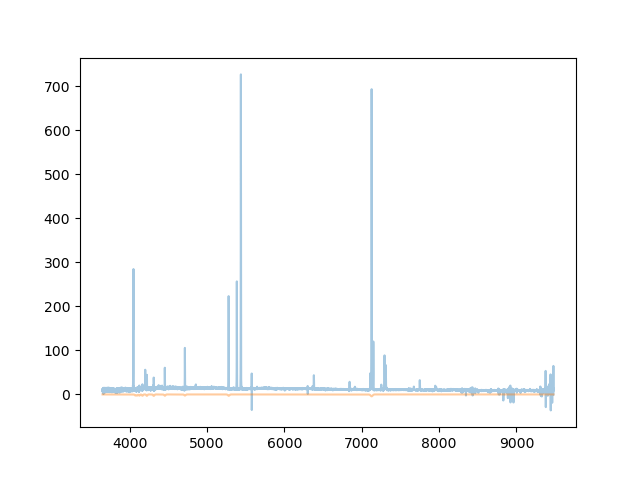

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.plot(data[0], c.continuum)
plt.legend()
plt.show()

ValueError: x and y must have same first dimension, but have shapes (12619,) and (12519,)

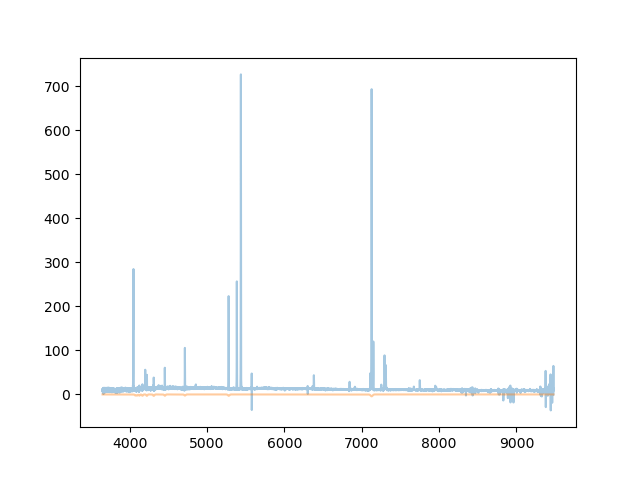

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.plot(c.wave, c.continuum)
plt.legend()
plt.show()

In [ ]:
class CONTINUUM_SUBSTRACT:
    def __init__(self, spectra, plot=False):
        self.gal_id = spectra.gal_id
        self.spectra = spectra
        self.plot = plot
        self.bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta',
                             'H_gamma', 'O3_5008', 'O3_4959', 'N2_6550',
                             'N2_6585', 'S2_6716', 'S2_6730']
        self.read_data()
        self.cont_est()
        self.save_corrected_data()

    def read_data(self):
        """
        Reads MW duct corrected data if it exist, otherwise reads the
        uncorrected data.
        """
        print(f'Reading data for {self.gal_id}')
        save_path2 = (f'{proj_DIR}bal_abs/bcorr_{self.gal_id}_new.csv')

        if os.path.exists(save_path2):
            print("Using MW dust + Balmer abs corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
            self.wave, self.flux, self.sigma = arrays
        else:
            print("Using uncorrected data")
            self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

    def moving_average(self, arr, window_size):
        i = 0
        smooth_spectra = []
        while i < len(arr) - window_size + 1:
            window1 = arr[i: i + window_size]
            smooth_spectrum = round(sum(window1) / window_size, 3)
            smooth_spectra.append(smooth_spectrum)
            i += 1
        return np.array(smooth_spectra)

    @log_method_call
    def cont_est(self):
        if self.spectra.model1IT is None:
            print('Calculating the first initial params')
            fit = fitSpectrum(self.wave, self.flux, self.sigma,
                              linelist=self.spectra.linelist_dict,
                              z_init=self.spectra.redshift,
                              weights=1/self.sigma**2,
                              showPlot=False,
                              broad=True, nfev=1000)
            self.spectra.model1IT = fit

        sigma_narr = self.spectra.model1IT.params['sigma_v_narrow'].value
        sigma_broad = self.spectra.model1IT.params['sigma_v_broad'].value

        def get_sigma(label):
            center = self.spectra.linelist_dict[label] * cte
            if label in self.bright_lines:
                sigma = (center / const.c.to('km/s').value) * sigma_broad
            else:
                sigma = (center / const.c.to('km/s').value) * sigma_narr
            return sigma, center

        # Mask every emission line 3 sigma from center

        cte = (1 + self.spectra.redshift)
        self.masked_flux = self.flux.copy()

        for label in self.spectra.linelist_dict:
            sigma, center = get_sigma(label)

            mask_below = (self.wave > center - 5*sigma)
            mask_up = (self.wave < center + 5*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            self.masked_flux[mask_line] = np.nan

        mask = np.isfinite(self.masked_flux)
        bin_flux = self.moving_average(self.masked_flux[mask], 100)
        bin_wave = self.moving_average(self.wave[mask], 100)

        # Model, #MODIFY BINWAVE TO TAKE THE DATA EVRY 100 WV?

        fit = CubicSpline(bin_wave, bin_flux,
                          bc_type='not-a-knot')

        mask_cubic_up = (self.wave > np.min(bin_wave))
        mask_cubic_down = (self.wave < np.max(bin_wave))
        mask_cub = mask_cubic_up & mask_cubic_down
        self.spectra.subs_wave = self.wave[mask_cub]
        self.subs_sigma = self.sigma[mask_cub]
        self.cont_wave = self.wave[mask_cub]
        self.cont_flux = fit(self.cont_wave)
        self.spectra.subs_flux = self.flux[mask_cub] - self.cont_flux
        if self.plot is True:
            _, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].set_title("Continuum estimation")
            axs[0].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[0].plot(self.wave, self.masked_flux, alpha=0.5,
                        label='Masked spectra')
            axs[0].plot(bin_wave, fit(bin_wave), alpha=0.5,
                        label='Spline model')

            axs[0].set_xlabel(r'Wavelength $\AA$')
            axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
            axs[0].set_ylim(np.min(fit(bin_wave)) - 30,
                            np.max(fit(bin_wave)) + 30)
            axs[0].legend()

            axs[1].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[1].plot(self.spectra.subs_wave, self.spectra.subs_flux,
                        alpha=0.5,
                        label='Substracted Flux')
            axs[1].set_xlabel(r'Wavelength $\AA$')
            axs[1].legend()
            save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
            os.makedirs(save_dir, exist_ok=True)
            path = f'{save_dir}/{self.gal_id}_CONT_SUBS_new.pdf'
            plt.savefig(path, format='pdf')
            plt.show()

    def save_corrected_data(self):
        """
        Saves the corrected data to a CSV file,
        creating the directory if needed.
        """
        # Define the directory and file path
        save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
        save_path = f'{save_dir}/cont_corr_{self.gal_id}_new.csv'

        # Create the directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Create and save DataFrame
        df = pd.DataFrame({'wave': self.spectra.subs_wave,
                           'flux': self.spectra.subs_flux,
                           'sigma': self.subs_sigma})

        print(f'Saved continuum substracted data to: {save_path}')



In [ ]:
c = CONTINUUM_SUBSTRACT(class_)

Reading data for J0328
Using MW dust + Balmer abs corrected  data
Executed cont_est in 0.1449s
Saved continuum substracted data to: /Users/javieratoro/Desktop/thesis/proyecto 2024-2/cont_subs/J0328/cont_corr_J0328_new.csv


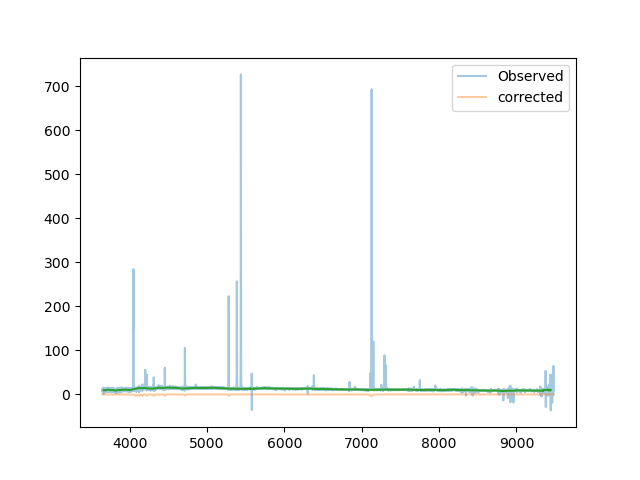

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.plot(c.cont_wave, c.cont_flux)
plt.legend()
plt.show()

In [ ]:
c.cont_flux + (data[1]-corrected_flux)

ValueError: operands could not be broadcast together with shapes (12519,) (12619,) 

In [ ]:
class CONTINUUM_SUBSTRACT:
    def __init__(self, spectra, plot=False):
        self.gal_id = spectra.gal_id
        self.spectra = spectra
        self.plot = plot
        self.bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta',
                             'H_gamma', 'O3_5008', 'O3_4959', 'N2_6550',
                             'N2_6585', 'S2_6716', 'S2_6730']
        self.read_data()
        self.cont_est()
        self.save_corrected_data()

    def read_data(self):
        """
        Reads MW duct corrected data if it exist, otherwise reads the
        uncorrected data.
        """
        print(f'Reading data for {self.gal_id}')
        save_path2 = (f'{proj_DIR}bal_abs/bcorr_{self.gal_id}_new.csv')

        if os.path.exists(save_path2):
            print("Using MW dust + Balmer abs corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
            self.wave, self.flux, self.sigma = arrays
        else:
            print("Using uncorrected data")
            self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

    def moving_average(self, arr, window_size):
        i = 0
        smooth_spectra = []
        while i < len(arr) - window_size + 1:
            window1 = arr[i: i + window_size]
            smooth_spectrum = round(sum(window1) / window_size, 3)
            smooth_spectra.append(smooth_spectrum)
            i += 1
        return np.array(smooth_spectra)

    @log_method_call
    def cont_est(self):
        if self.spectra.model1IT is None:
            print('Calculating the first initial params')
            fit = fitSpectrum(self.wave, self.flux, self.sigma,
                              linelist=self.spectra.linelist_dict,
                              z_init=self.spectra.redshift,
                              weights=1/self.sigma**2,
                              showPlot=False,
                              broad=True, nfev=1000)
            self.spectra.model1IT = fit

        sigma_narr = self.spectra.model1IT.params['sigma_v_narrow'].value
        sigma_broad = self.spectra.model1IT.params['sigma_v_broad'].value

        def get_sigma(label):
            center = self.spectra.linelist_dict[label] * cte
            if label in self.bright_lines:
                sigma = (center / const.c.to('km/s').value) * sigma_broad
            else:
                sigma = (center / const.c.to('km/s').value) * sigma_narr
            return sigma, center

        # Mask every emission line 3 sigma from center

        cte = (1 + self.spectra.redshift)
        self.masked_flux = self.flux.copy()

        for label in self.spectra.linelist_dict:
            sigma, center = get_sigma(label)

            mask_below = (self.wave > center - 5*sigma)
            mask_up = (self.wave < center + 5*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            self.masked_flux[mask_line] = np.nan

        mask = np.isfinite(self.masked_flux)
        bin_flux = self.moving_average(self.masked_flux[mask], 100)
        bin_wave = self.moving_average(self.wave[mask], 100)

        # Model, #MODIFY BINWAVE TO TAKE THE DATA EVRY 100 WV?

        fit = CubicSpline(bin_wave, bin_flux,
                          bc_type='not-a-knot')

        mask_cubic_up = (self.wave > np.min(bin_wave))
        mask_cubic_down = (self.wave < np.max(bin_wave))
        mask_cub = mask_cubic_up & mask_cubic_down
        self.mask_cub = mask_cub
        self.spectra.subs_wave = self.wave[mask_cub]
        self.subs_sigma = self.sigma[mask_cub]
        self.cont_flux = fit(self.cont_wave)
        self.spectra.subs_flux = self.flux[mask_cub] - self.cont_flux
        if self.plot is True:
            _, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].set_title("Continuum estimation")
            axs[0].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[0].plot(self.wave, self.masked_flux, alpha=0.5,
                        label='Masked spectra')
            axs[0].plot(bin_wave, fit(bin_wave), alpha=0.5,
                        label='Spline model')

            axs[0].set_xlabel(r'Wavelength $\AA$')
            axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
            axs[0].set_ylim(np.min(fit(bin_wave)) - 30,
                            np.max(fit(bin_wave)) + 30)
            axs[0].legend()

            axs[1].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[1].plot(self.spectra.subs_wave, self.spectra.subs_flux,
                        alpha=0.5,
                        label='Substracted Flux')
            axs[1].set_xlabel(r'Wavelength $\AA$')
            axs[1].legend()
            save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
            os.makedirs(save_dir, exist_ok=True)
            path = f'{save_dir}/{self.gal_id}_CONT_SUBS_new.pdf'
            plt.savefig(path, format='pdf')
            plt.show()

    def save_corrected_data(self):
        """
        Saves the corrected data to a CSV file,
        creating the directory if needed.
        """
        # Define the directory and file path
        save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
        save_path = f'{save_dir}/cont_corr_{self.gal_id}_new.csv'

        # Create the directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Create and save DataFrame
        df = pd.DataFrame({'wave': self.spectra.subs_wave,
                           'flux': self.spectra.subs_flux,
                           'sigma': self.subs_sigma})

        print(f'Saved continuum substracted data to: {save_path}')



In [ ]:
c = CONTINUUM_SUBSTRACT(class_)

Reading data for J0328
Using MW dust + Balmer abs corrected  data


AttributeError: 'CONTINUUM_SUBSTRACT' object has no attribute 'cont_wave'

In [ ]:
class CONTINUUM_SUBSTRACT:
    def __init__(self, spectra, plot=False):
        self.gal_id = spectra.gal_id
        self.spectra = spectra
        self.plot = plot
        self.bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta',
                             'H_gamma', 'O3_5008', 'O3_4959', 'N2_6550',
                             'N2_6585', 'S2_6716', 'S2_6730']
        self.read_data()
        self.cont_est()
        self.save_corrected_data()

    def read_data(self):
        """
        Reads MW duct corrected data if it exist, otherwise reads the
        uncorrected data.
        """
        print(f'Reading data for {self.gal_id}')
        save_path2 = (f'{proj_DIR}bal_abs/bcorr_{self.gal_id}_new.csv')

        if os.path.exists(save_path2):
            print("Using MW dust + Balmer abs corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
            self.wave, self.flux, self.sigma = arrays
        else:
            print("Using uncorrected data")
            self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

    def moving_average(self, arr, window_size):
        i = 0
        smooth_spectra = []
        while i < len(arr) - window_size + 1:
            window1 = arr[i: i + window_size]
            smooth_spectrum = round(sum(window1) / window_size, 3)
            smooth_spectra.append(smooth_spectrum)
            i += 1
        return np.array(smooth_spectra)

    @log_method_call
    def cont_est(self):
        if self.spectra.model1IT is None:
            print('Calculating the first initial params')
            fit = fitSpectrum(self.wave, self.flux, self.sigma,
                              linelist=self.spectra.linelist_dict,
                              z_init=self.spectra.redshift,
                              weights=1/self.sigma**2,
                              showPlot=False,
                              broad=True, nfev=1000)
            self.spectra.model1IT = fit

        sigma_narr = self.spectra.model1IT.params['sigma_v_narrow'].value
        sigma_broad = self.spectra.model1IT.params['sigma_v_broad'].value

        def get_sigma(label):
            center = self.spectra.linelist_dict[label] * cte
            if label in self.bright_lines:
                sigma = (center / const.c.to('km/s').value) * sigma_broad
            else:
                sigma = (center / const.c.to('km/s').value) * sigma_narr
            return sigma, center

        # Mask every emission line 3 sigma from center

        cte = (1 + self.spectra.redshift)
        self.masked_flux = self.flux.copy()

        for label in self.spectra.linelist_dict:
            sigma, center = get_sigma(label)

            mask_below = (self.wave > center - 5*sigma)
            mask_up = (self.wave < center + 5*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            self.masked_flux[mask_line] = np.nan

        mask = np.isfinite(self.masked_flux)
        bin_flux = self.moving_average(self.masked_flux[mask], 100)
        bin_wave = self.moving_average(self.wave[mask], 100)

        # Model, #MODIFY BINWAVE TO TAKE THE DATA EVRY 100 WV?

        fit = CubicSpline(bin_wave, bin_flux,
                          bc_type='not-a-knot')

        mask_cubic_up = (self.wave > np.min(bin_wave))
        mask_cubic_down = (self.wave < np.max(bin_wave))
        mask_cub = mask_cubic_up & mask_cubic_down
        self.mask_cub = mask_cub
        self.spectra.subs_wave = self.wave[mask_cub]
        self.subs_sigma = self.sigma[mask_cub]
        self.cont_flux = fit(self.spectra.subs_wave)
        self.spectra.subs_flux = self.flux[mask_cub] - self.cont_flux
        if self.plot is True:
            _, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].set_title("Continuum estimation")
            axs[0].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[0].plot(self.wave, self.masked_flux, alpha=0.5,
                        label='Masked spectra')
            axs[0].plot(bin_wave, fit(bin_wave), alpha=0.5,
                        label='Spline model')

            axs[0].set_xlabel(r'Wavelength $\AA$')
            axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
            axs[0].set_ylim(np.min(fit(bin_wave)) - 30,
                            np.max(fit(bin_wave)) + 30)
            axs[0].legend()

            axs[1].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[1].plot(self.spectra.subs_wave, self.spectra.subs_flux,
                        alpha=0.5,
                        label='Substracted Flux')
            axs[1].set_xlabel(r'Wavelength $\AA$')
            axs[1].legend()
            save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
            os.makedirs(save_dir, exist_ok=True)
            path = f'{save_dir}/{self.gal_id}_CONT_SUBS_new.pdf'
            plt.savefig(path, format='pdf')
            plt.show()

    def save_corrected_data(self):
        """
        Saves the corrected data to a CSV file,
        creating the directory if needed.
        """
        # Define the directory and file path
        save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
        save_path = f'{save_dir}/cont_corr_{self.gal_id}_new.csv'

        # Create the directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Create and save DataFrame
        df = pd.DataFrame({'wave': self.spectra.subs_wave,
                           'flux': self.spectra.subs_flux,
                           'sigma': self.subs_sigma})

        print(f'Saved continuum substracted data to: {save_path}')



In [ ]:
c = CONTINUUM_SUBSTRACT(class_)

Reading data for J0328
Using MW dust + Balmer abs corrected  data
Executed cont_est in 0.1423s
Saved continuum substracted data to: /Users/javieratoro/Desktop/thesis/proyecto 2024-2/cont_subs/J0328/cont_corr_J0328_new.csv


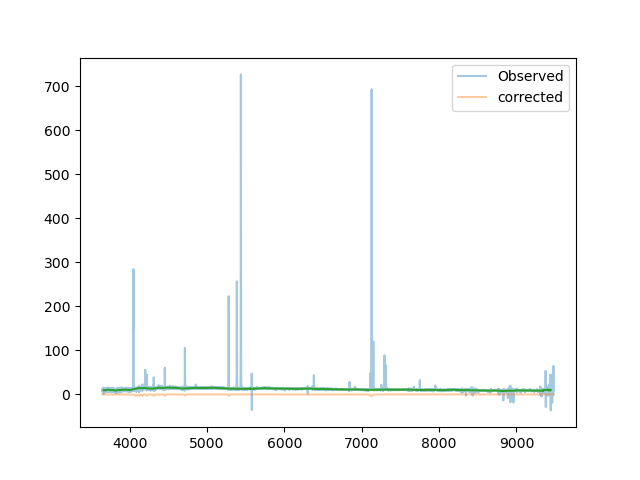

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], data[1]-corrected_flux, alpha=0.4, label='corrected')
plt.plot(c.spectra.subs_wave, c.cont_flux)
plt.legend()
plt.show()

In [ ]:
corr = data[1]-corrected_flux
all_corr = corr[c.mask_cub] + c.cont_flux

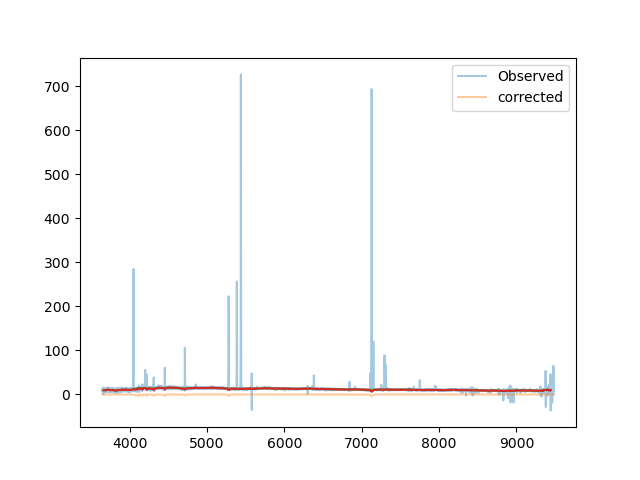

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corr, alpha=0.4, label='corrected')
plt.plot(c.spectra.subs_wave, c.cont_flux)
plt.plot(c.spectra.subs_wave, all_corr)
plt.legend()
plt.show()

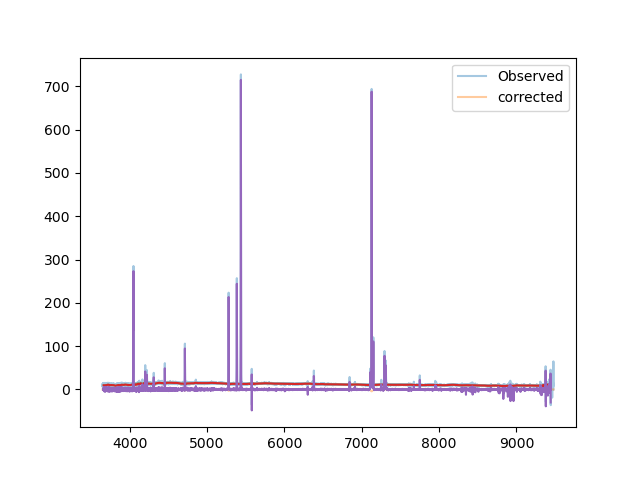

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corr, alpha=0.4, label='corrected')
plt.plot(c.spectra.subs_wave, c.cont_flux, alpha=0.4)
plt.plot(c.spectra.subs_wave, all_corr)
plt.plot(c.spectra.subs_wave, data[1][c.mask_cub] - all_corr)
plt.legend()
plt.show()

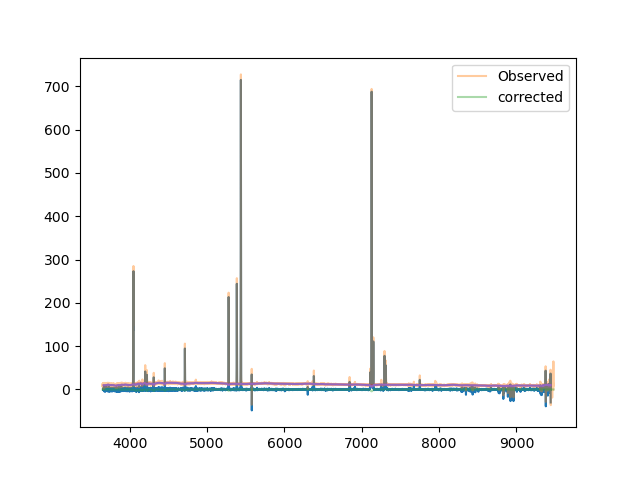

In [ ]:
plt.figure()
plt.plot(c.spectra.subs_wave, data[1][c.mask_cub] - all_corr)
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corr, alpha=0.4, label='corrected')
plt.plot(c.spectra.subs_wave, c.cont_flux, alpha=0.4)
plt.plot(c.spectra.subs_wave, all_corr)
plt.legend()
plt.show()

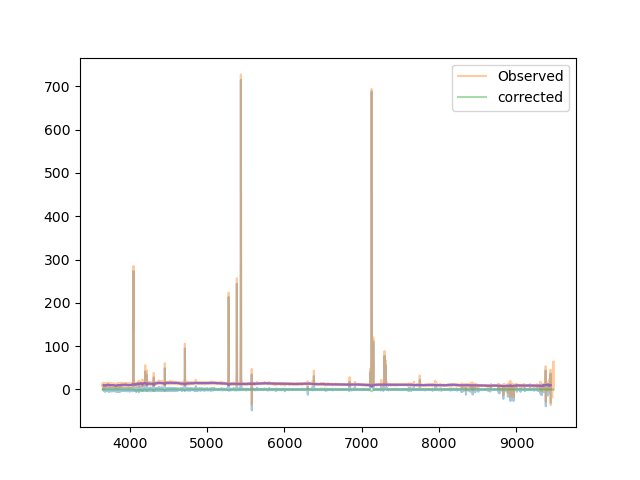

In [ ]:
plt.figure()
plt.plot(c.spectra.subs_wave, data[1][c.mask_cub] - all_corr, alpha=0.4)
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corr, alpha=0.4, label='corrected')
plt.plot(c.spectra.subs_wave, c.cont_flux, alpha=0.4)
plt.plot(c.spectra.subs_wave, all_corr)
plt.legend()
plt.show()

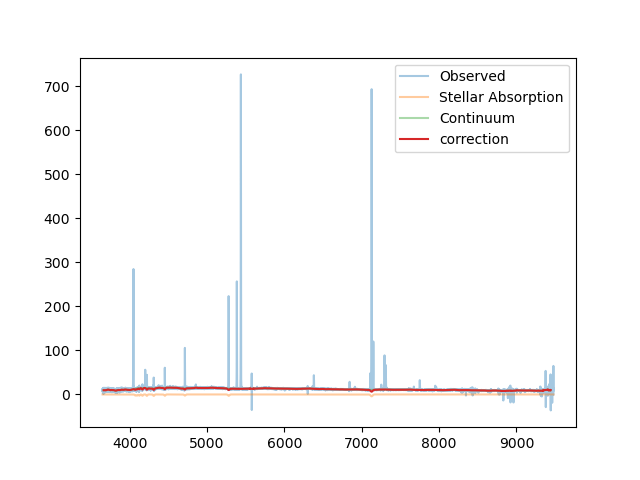

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corr, alpha=0.4, label='Stellar Absorption')
plt.plot(c.spectra.subs_wave, c.cont_flux, alpha=0.4, label ='Continuum')
plt.plot(c.spectra.subs_wave, all_corr, label='correction')
plt.legend()
plt.show()

In [ ]:
class CONTINUUM_SUBSTRACT:
    def __init__(self, spectra, plot=False):
        self.gal_id = spectra.gal_id
        self.spectra = spectra
        self.plot = plot
        self.bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta',
                             'H_gamma', 'O3_5008', 'O3_4959', 'N2_6550',
                             'N2_6585', 'S2_6716', 'S2_6730']
        self.read_data()
        self.cont_est()
        self.save_corrected_data()

    def read_data(self):
        """
        Reads MW duct corrected data if it exist, otherwise reads the
        uncorrected data.
        """
        print(f'Reading data for {self.gal_id}')
        save_path2 = (f'{proj_DIR}dust/dcorr_{self.gal_id}.csv')

        if os.path.exists(save_path2):
            print("Using MW dust corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
            self.wave, self.flux, self.sigma = arrays
        else:
            print("Using uncorrected data")
            self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

    def moving_average(self, arr, window_size):
        i = 0
        smooth_spectra = []
        while i < len(arr) - window_size + 1:
            window1 = arr[i: i + window_size]
            smooth_spectrum = round(sum(window1) / window_size, 3)
            smooth_spectra.append(smooth_spectrum)
            i += 1
        return np.array(smooth_spectra)

    @log_method_call
    def cont_est(self):
        if self.spectra.model1IT is None:
            print('Calculating the first initial params')
            fit = fitSpectrum(self.wave, self.flux, self.sigma,
                              linelist=self.spectra.linelist_dict,
                              z_init=self.spectra.redshift,
                              weights=1/self.sigma**2,
                              showPlot=False,
                              broad=True, nfev=1000)
            self.spectra.model1IT = fit

        sigma_narr = self.spectra.model1IT.params['sigma_v_narrow'].value
        sigma_broad = self.spectra.model1IT.params['sigma_v_broad'].value

        def get_sigma(label):
            center = self.spectra.linelist_dict[label] * cte
            if label in self.bright_lines:
                sigma = (center / const.c.to('km/s').value) * sigma_broad
            else:
                sigma = (center / const.c.to('km/s').value) * sigma_narr
            return sigma, center

        # Mask every emission line 3 sigma from center

        cte = (1 + self.spectra.redshift)
        self.masked_flux = self.flux.copy()

        for label in self.spectra.linelist_dict:
            sigma, center = get_sigma(label)

            mask_below = (self.wave > center - 5*sigma)
            mask_up = (self.wave < center + 5*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            self.masked_flux[mask_line] = np.nan

        mask = np.isfinite(self.masked_flux)
        bin_flux = self.moving_average(self.masked_flux[mask], 100)
        bin_wave = self.moving_average(self.wave[mask], 100)

        # Model, #MODIFY BINWAVE TO TAKE THE DATA EVRY 100 WV?

        fit = CubicSpline(bin_wave, bin_flux,
                          bc_type='not-a-knot')

        mask_cubic_up = (self.wave > np.min(bin_wave))
        mask_cubic_down = (self.wave < np.max(bin_wave))
        mask_cub = mask_cubic_up & mask_cubic_down
        self.mask_cub = mask_cub
        self.spectra.subs_wave = self.wave[mask_cub]
        self.subs_sigma = self.sigma[mask_cub]
        self.cont_flux = fit(self.spectra.subs_wave)
        self.spectra.subs_flux = self.flux[mask_cub] - self.cont_flux
        if self.plot is True:
            _, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].set_title("Continuum estimation")
            axs[0].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[0].plot(self.wave, self.masked_flux, alpha=0.5,
                        label='Masked spectra')
            axs[0].plot(bin_wave, fit(bin_wave), alpha=0.5,
                        label='Spline model')

            axs[0].set_xlabel(r'Wavelength $\AA$')
            axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
            axs[0].set_ylim(np.min(fit(bin_wave)) - 30,
                            np.max(fit(bin_wave)) + 30)
            axs[0].legend()

            axs[1].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[1].plot(self.spectra.subs_wave, self.spectra.subs_flux,
                        alpha=0.5,
                        label='Substracted Flux')
            axs[1].set_xlabel(r'Wavelength $\AA$')
            axs[1].legend()
            save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
            os.makedirs(save_dir, exist_ok=True)
            path = f'{save_dir}/{self.gal_id}_CONT_SUBS_new.pdf'
            plt.savefig(path, format='pdf')
            plt.show()

    def save_corrected_data(self):
        """
        Saves the corrected data to a CSV file,
        creating the directory if needed.
        """
        # Define the directory and file path
        save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
        save_path = f'{save_dir}/cont_corr_{self.gal_id}_new.csv'

        # Create the directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Create and save DataFrame
        df = pd.DataFrame({'wave': self.spectra.subs_wave,
                           'flux': self.spectra.subs_flux,
                           'sigma': self.subs_sigma})

        print(f'Saved continuum substracted data to: {save_path}')



In [ ]:
c = CONTINUUM_SUBSTRACT(class_)

Reading data for J0328
Using uncorrected data
Executed cont_est in 0.1518s
Saved continuum substracted data to: /Users/javieratoro/Desktop/thesis/proyecto 2024-2/cont_subs/J0328/cont_corr_J0328_new.csv


In [ ]:
corr = data[1]-corrected_flux
all_corr = corr[c.mask_cub] + c.cont_flux

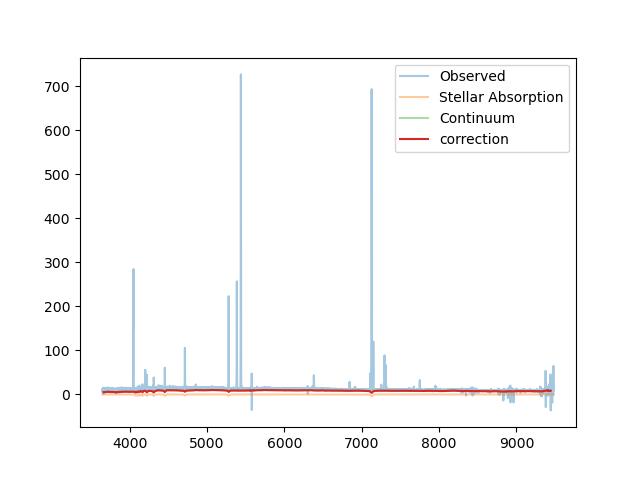

In [ ]:
plt.figure()
plt.plot(data[0], data[1], alpha=0.4, label='Observed')
plt.plot(data[0], corr, alpha=0.4, label='Stellar Absorption')
plt.plot(c.spectra.subs_wave, c.cont_flux, alpha=0.4, label ='Continuum')
plt.plot(c.spectra.subs_wave, all_corr, label='correction')
plt.legend()
plt.show()

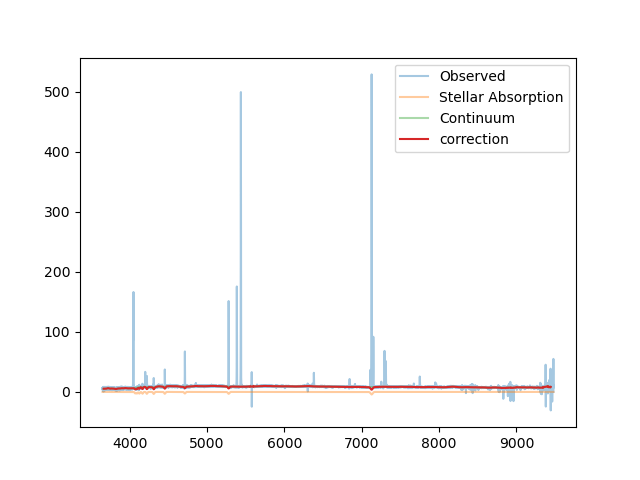

In [ ]:
plt.figure()
plt.plot(data[0], c.flux, alpha=0.4, label='Observed')
plt.plot(data[0], corr, alpha=0.4, label='Stellar Absorption')
plt.plot(c.spectra.subs_wave, c.cont_flux, alpha=0.4, label ='Continuum')
plt.plot(c.spectra.subs_wave, all_corr, label='correction')
plt.legend()
plt.show()

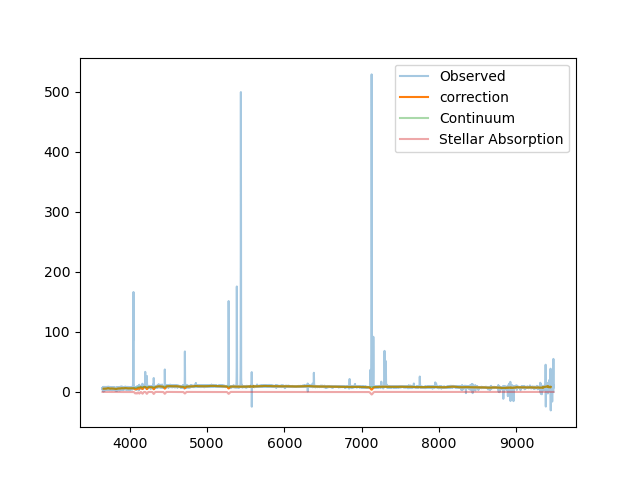

In [ ]:
plt.figure()
plt.plot(data[0], c.flux, alpha=0.4, label='Observed')
plt.plot(c.spectra.subs_wave, all_corr, label='correction')
plt.plot(c.spectra.subs_wave, c.cont_flux, alpha=0.4, label ='Continuum')
plt.plot(data[0], corr, alpha=0.4, label='Stellar Absorption')
plt.legend()
plt.show()

In [ ]:
class CONTINUUM_SUBSTRACT:
    def __init__(self, spectra, plot=False):
        self.gal_id = spectra.gal_id
        self.spectra = spectra
        self.plot = plot
        self.bright_lines = ['O2_3725', 'O2_3727', 'H_alpha', 'H_beta',
                             'H_gamma', 'O3_5008', 'O3_4959', 'N2_6550',
                             'N2_6585', 'S2_6716', 'S2_6730']
        self.read_data()
        self.cont_est()
        self.save_corrected_data()

    def read_data(self):
        """
        Reads MW duct corrected data if it exist, otherwise reads the
        uncorrected data.
        """
        print(f'Reading data for {self.gal_id}')
        save_path2 = (f'{proj_DIR}dust/dcorr_{self.gal_id}.csv')

        if os.path.exists(save_path2):
            print("Using MW dust corrected  data")
            dcorr = pd.read_csv(save_path2)
            arrays = dcorr.to_numpy().T  # Transpose to get column-wise array
            self.wave, self.flux, self.sigma = arrays
        else:
            print("Using uncorrected data")
            self.wave, self.flux, self.sigma, _ = self.spectra.datas[0]

    def moving_average(self, arr, window_size):
        i = 0
        smooth_spectra = []
        while i < len(arr) - window_size + 1:
            window1 = arr[i: i + window_size]
            smooth_spectrum = round(sum(window1) / window_size, 3)
            smooth_spectra.append(smooth_spectrum)
            i += 1
        return np.array(smooth_spectra)

    @log_method_call
    def cont_est(self):
        if self.spectra.model1IT is None:
            print('Calculating the first initial params')
            fit = fitSpectrum(self.wave, self.flux, self.sigma,
                              linelist=self.spectra.linelist_dict,
                              z_init=self.spectra.redshift,
                              weights=1/self.sigma**2,
                              showPlot=False,
                              broad=True, nfev=1000)
            self.spectra.model1IT = fit

        sigma_narr = self.spectra.model1IT.params['sigma_v_narrow'].value
        sigma_broad = self.spectra.model1IT.params['sigma_v_broad'].value

        def get_sigma(label):
            center = self.spectra.linelist_dict[label] * cte
            if label in self.bright_lines:
                sigma = (center / const.c.to('km/s').value) * sigma_broad
            else:
                sigma = (center / const.c.to('km/s').value) * sigma_narr
            return sigma, center

        # Mask every emission line 3 sigma from center

        cte = (1 + self.spectra.redshift)
        self.masked_flux = self.flux.copy()

        for label in self.spectra.linelist_dict:
            sigma, center = get_sigma(label)

            mask_below = (self.wave > center - 5*sigma)
            mask_up = (self.wave < center + 5*sigma)
            mask_line = mask_below & mask_up

            # Every line to nan
            self.masked_flux[mask_line] = np.nan

        mask = np.isfinite(self.masked_flux)
        bin_flux = self.moving_average(self.masked_flux[mask], 150)
        bin_wave = self.moving_average(self.wave[mask], 150)

        # Model, #MODIFY BINWAVE TO TAKE THE DATA EVRY 100 WV?

        fit = CubicSpline(bin_wave, bin_flux,
                          bc_type='not-a-knot')

        mask_cubic_up = (self.wave > np.min(bin_wave))
        mask_cubic_down = (self.wave < np.max(bin_wave))
        mask_cub = mask_cubic_up & mask_cubic_down
        self.mask_cub = mask_cub
        self.spectra.subs_wave = self.wave[mask_cub]
        self.subs_sigma = self.sigma[mask_cub]
        self.cont_flux = fit(self.spectra.subs_wave)
        self.spectra.subs_flux = self.flux[mask_cub] - self.cont_flux
        if self.plot is True:
            _, axs = plt.subplots(1, 2, figsize=(10, 4))
            axs[0].set_title("Continuum estimation")
            axs[0].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[0].plot(self.wave, self.masked_flux, alpha=0.5,
                        label='Masked spectra')
            axs[0].plot(bin_wave, fit(bin_wave), alpha=0.5,
                        label='Spline model')

            axs[0].set_xlabel(r'Wavelength $\AA$')
            axs[0].set_ylabel(r'Flux (erg / s / cm$^{2}$)')
            axs[0].set_ylim(np.min(fit(bin_wave)) - 30,
                            np.max(fit(bin_wave)) + 30)
            axs[0].legend()

            axs[1].plot(self.wave, self.flux, alpha=0.5, label='Obs Flux')
            axs[1].plot(self.spectra.subs_wave, self.spectra.subs_flux,
                        alpha=0.5,
                        label='Substracted Flux')
            axs[1].set_xlabel(r'Wavelength $\AA$')
            axs[1].legend()
            save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
            os.makedirs(save_dir, exist_ok=True)
            path = f'{save_dir}/{self.gal_id}_CONT_SUBS_new.pdf'
            plt.savefig(path, format='pdf')
            plt.show()

    def save_corrected_data(self):
        """
        Saves the corrected data to a CSV file,
        creating the directory if needed.
        """
        # Define the directory and file path
        save_dir = f'{proj_DIR}cont_subs/{self.gal_id}'
        save_path = f'{save_dir}/cont_corr_{self.gal_id}_new.csv'

        # Create the directory if it doesn't exist
        os.makedirs(save_dir, exist_ok=True)

        # Create and save DataFrame
        df = pd.DataFrame({'wave': self.spectra.subs_wave,
                           'flux': self.spectra.subs_flux,
                           'sigma': self.subs_sigma})

        print(f'Saved continuum substracted data to: {save_path}')



In [ ]:
c = CONTINUUM_SUBSTRACT(class_)

Reading data for J0328
Using uncorrected data
Executed cont_est in 0.2146s
Saved continuum substracted data to: /Users/javieratoro/Desktop/thesis/proyecto 2024-2/cont_subs/J0328/cont_corr_J0328_new.csv
Executed cont_est in 0.2146s
Saved continuum substracted data to: /Users/javieratoro/Desktop/thesis/proyecto 2024-2/cont_subs/J0328/cont_corr_J0328_new.csv


In [ ]:
corr = data[1]-corrected_flux
all_corr = corr[c.mask_cub] + c.cont_flux

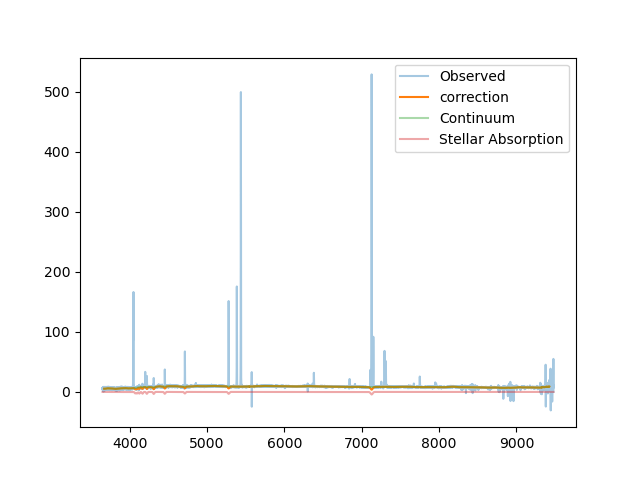

In [ ]:
plt.figure()
plt.plot(data[0], c.flux, alpha=0.4, label='Observed')
plt.plot(c.spectra.subs_wave, all_corr, label='correction')
plt.plot(c.spectra.subs_wave, c.cont_flux, alpha=0.4, label ='Continuum')
plt.plot(data[0], corr, alpha=0.4, label='Stellar Absorption')
plt.legend()
plt.show()

AttributeError: 'CONTINUUM_SUBSTRACT' object has no attribute 'fluc'

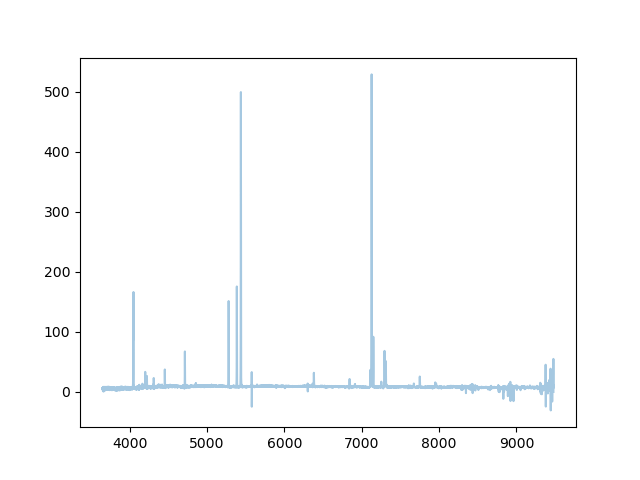

In [ ]:
plt.figure()
plt.plot(data[0], c.flux, alpha=0.4, label='Observed')
plt.plot(c.spectra.subs_wave, c.fluc[c.mask_cub] - all_corr, label='corrected')
plt.legend()
plt.show()

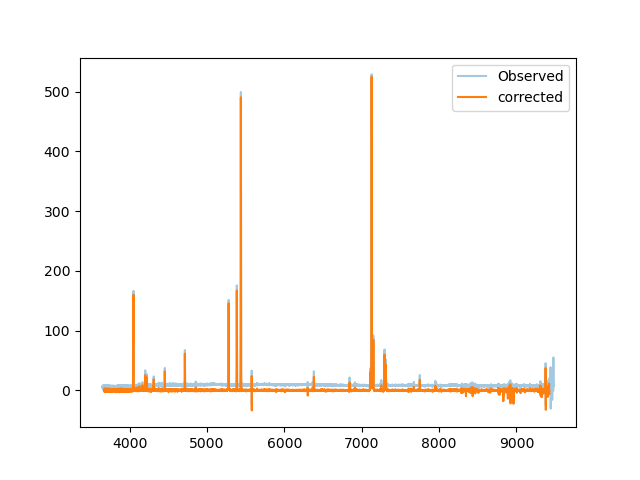

In [ ]:
plt.figure()
plt.plot(data[0], c.flux, alpha=0.4, label='Observed')
plt.plot(c.spectra.subs_wave, c.flux[c.mask_cub] - all_corr, label='corrected')
plt.legend()
plt.show()